In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay

In [2]:
df=pd.read_excel("C:/Users/Kavin/Downloads/CompData-1.xlsx")

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2058 entries, 0 to 2057
Data columns (total 58 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   Co_Code                                            2058 non-null   int64  
 1   Co_Name                                            2058 non-null   object 
 2   _Operating_Expense_Rate                            2058 non-null   float64
 3   _Research_and_development_expense_rate             2058 non-null   float64
 4   _Cash_flow_rate                                    2058 non-null   float64
 5   _Interest_bearing_debt_interest_rate               2058 non-null   float64
 6   _Tax_rate_A                                        2058 non-null   float64
 7   _Cash_Flow_Per_Share                               1891 non-null   float64
 8   _Per_Share_Net_profit_before_tax_Yuan_             2058 non-null   float64
 9   _Realize

In [4]:
print("Number of Companies is", df.shape[0], '\n' "The Number of Variables is", df.shape[1])

Number of Companies is 2058 
The Number of Variables is 58


In [5]:
2058*58

119364

In [6]:
df.isnull().sum().sum()

298

In [7]:
298/119364

0.00249656512851446

In [8]:
df.head()

,Co_Code,Co_Name,_Operating_Expense_Rate,_Research_and_development_expense_rate,_Cash_flow_rate,_Interest_bearing_debt_interest_rate,_Tax_rate_A,_Cash_Flow_Per_Share,_Per_Share_Net_profit_before_tax_Yuan_,_Realized_Sales_Gross_Profit_Growth_Rate,...,_Cash_Flow_to_Equity,_Current_Liability_to_Current_Assets,_Liability_Assets_Flag,_Total_assets_to_GNP_price,_No_credit_Interval,_Degree_of_Financial_Leverage_DFL,_Interest_Coverage_Ratio_Interest_expense_to_EBIT,_Net_Income_Flag,_Equity_to_Liability,Default
0,16974,Hind.Cables,8.820000e+09,0.000000e+00,0.462045,0.000352,0.001417,0.322558,0.194472,0.022074,...,0.310901,0.034913,0,0.028801,0.620927,0.026930,0.565744,1,0.015338,0
1,21214,Tata Tele. Mah.,9.380000e+09,4.230000e+09,0.460116,0.000716,0.000000,0.315520,0.161633,0.021902,...,0.314572,0.041653,0,0.006191,0.622513,0.026297,0.560741,1,0.029445,1
2,14852,ABG Shipyard,3.800000e+09,8.150000e+08,0.449893,0.000496,0.000000,0.299851,0.172554,0.022186,...,0.314777,0.033560,0,0.001095,0.623749,0.027276,0.566744,1,0.041718,0
3,2439,GTL,6.440000e+09,0.000000e+00,0.462731,0.000592,0.009313,0.319834,0.174738,0.027638,...,0.316974,0.016527,0,0.003749,0.622963,0.026988,0.565950,1,0.026956,0
4,23505,Bharati Defence,3.680000e+09,0.000000e+00,0.463117,0.000782,0.400243,0.325104,0.176546,0.022072,...,0.317729,0.034497,0,0.006595,0.624419,0.027498,0.567177,1,0.019900,0


In [9]:
df.tail()

,Co_Code,Co_Name,_Operating_Expense_Rate,_Research_and_development_expense_rate,_Cash_flow_rate,_Interest_bearing_debt_interest_rate,_Tax_rate_A,_Cash_Flow_Per_Share,_Per_Share_Net_profit_before_tax_Yuan_,_Realized_Sales_Gross_Profit_Growth_Rate,...,_Cash_Flow_to_Equity,_Current_Liability_to_Current_Assets,_Liability_Assets_Flag,_Total_assets_to_GNP_price,_No_credit_Interval,_Degree_of_Financial_Leverage_DFL,_Interest_Coverage_Ratio_Interest_expense_to_EBIT,_Net_Income_Flag,_Equity_to_Liability,Default
2053,2743,Kothari Ferment.,3.021580e-04,6.490000e+09,0.477066,0.000000,0.183014,0.322063,0.192739,0.022127,...,0.320387,0.004430,0,0.000420,0.624567,0.026791,0.565158,1,0.171662,0
2054,21216,Firstobj.Tech.,1.371450e-04,0.000000e+00,0.465211,0.000658,0.000000,0.319764,0.169391,0.022072,...,0.312324,0.032284,0,0.000882,0.624008,0.024201,0.573670,1,0.053740,0
2055,142,Diamines & Chem.,2.114990e-04,8.370000e+09,0.480248,0.000502,0.000000,0.327828,0.155005,0.021861,...,0.313122,0.040998,0,0.009579,0.623718,0.026702,0.564697,1,0.054984,0
2056,18014,IL&FS Engg.,3.750000e+09,0.000000e+00,0.474670,0.000578,0.306205,0.322027,0.173834,0.022167,...,0.315632,0.020275,0,0.004958,0.623443,0.026943,0.565792,1,0.057553,0
2057,43229,Channel Nine,2.981110e-04,0.000000e+00,0.467203,0.000826,0.000000,0.330021,0.180236,0.022418,...,0.316734,0.031368,0,0.000186,0.623588,0.026871,0.565512,1,0.020266,0


In [10]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Co_Code,2058.0,1.757211e+04,2.189289e+04,4.000000,3.674000e+03,6.240000e+03,2.428075e+04,7.249300e+04
_Operating_Expense_Rate,2058.0,2.052389e+09,3.252624e+09,0.000100,1.578727e-04,3.330330e-04,4.110000e+09,9.980000e+09
_Research_and_development_expense_rate,2058.0,1.208634e+09,2.144568e+09,0.000000,0.000000e+00,1.994130e-04,1.550000e+09,9.980000e+09
_Cash_flow_rate,2058.0,4.652426e-01,2.266269e-02,0.000000,4.600991e-01,4.634450e-01,4.680691e-01,1.000000e+00
_Interest_bearing_debt_interest_rate,2058.0,1.113022e+07,9.042595e+07,0.000000,2.760280e-04,4.540450e-04,6.630660e-04,9.900000e+08
_Tax_rate_A,2058.0,1.147770e-01,1.524457e-01,0.000000,0.000000e+00,3.709890e-02,2.161909e-01,9.996963e-01
_Cash_Flow_Per_Share,1891.0,3.199856e-01,1.529979e-02,0.169449,3.149890e-01,3.206479e-01,3.259178e-01,4.622268e-01
_Per_Share_Net_profit_before_tax_Yuan_,2058.0,1.769673e-01,3.015730e-02,0.000000,1.666039e-01,1.756421e-01,1.858854e-01,7.923477e-01
_Realized_Sales_Gross_Profit_Growth_Rate,2058.0,2.276117e-02,2.170104e-02,0.004282,2.205831e-02,2.210001e-02,2.215200e-02,1.000000e+00
_Operating_Profit_Growth_Rate,2058.0,8.481083e-01,4.589093e-03,0.736430,8.479740e-01,8.480386e-01,8.481147e-01,1.000000e+00


In [11]:
df.duplicated().sum()

0

In [12]:
df_X = df.drop(['Default', 'Co_Code', 'Co_Name'], axis=1)
df_Y = df['Default']

In [13]:
Q1 = df_X.quantile(0.25)
Q3 = df_X.quantile(0.75)
IQR = Q3 - Q1
UL = Q3 + 1.5*IQR
LL = Q1 - 1.5*IQR

In [14]:
((df_X > UL) | (df_X < LL)).sum()

_Operating_Expense_Rate                                0
_Research_and_development_expense_rate               264
_Cash_flow_rate                                      206
_Interest_bearing_debt_interest_rate                  94
_Tax_rate_A                                           42
_Cash_Flow_Per_Share                                 146
_Per_Share_Net_profit_before_tax_Yuan_               186
_Realized_Sales_Gross_Profit_Growth_Rate             283
_Operating_Profit_Growth_Rate                        317
_Continuous_Net_Profit_Growth_Rate                   340
_Total_Asset_Growth_Rate                               0
_Net_Value_Growth_Rate                               304
_Total_Asset_Return_Growth_Rate_Ratio                226
_Cash_Reinvestment_perc                              220
_Current_Ratio                                       193
_Quick_Ratio                                         190
_Interest_Expense_Ratio                              328
_Total_debt_to_Total_net_worth 

In [15]:
((df_X > UL) | (df_X < LL)).sum().sum()

10864

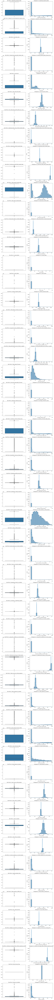

In [16]:
numeric_cols = df_X.select_dtypes(include=['int', 'float'])

# Set up the figure and axes
num_plots = len(numeric_cols.columns)
fig, axes = plt.subplots(num_plots, 2, figsize=(12, num_plots*4))

# Plot box plots and histograms for each column
for i, col in enumerate(numeric_cols.columns):
    sns.boxplot(data=numeric_cols[col], ax=axes[i, 0])
    axes[i, 0].set_title(f'Box Plot of {col}')
    
    sns.histplot(data=numeric_cols[col], bins=20, kde=True, ax=axes[i, 1])
    axes[i, 1].set_title(f'Histogram of {col}')

# Adjust layout
plt.tight_layout()
plt.show()

<Figure size 1200x600 with 0 Axes>

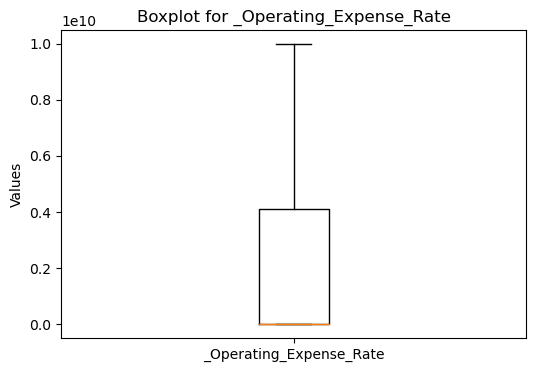

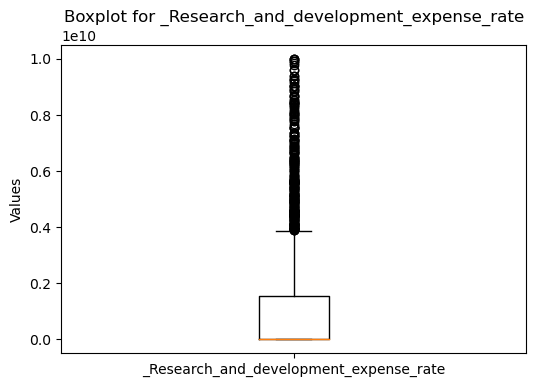

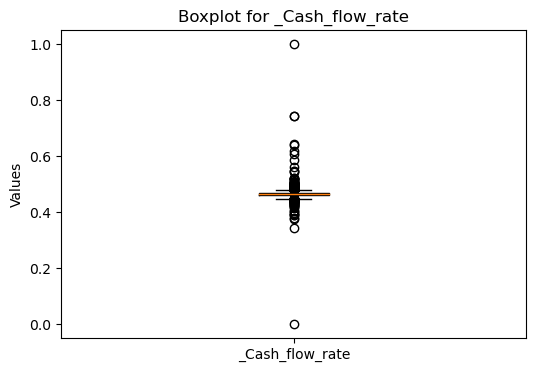

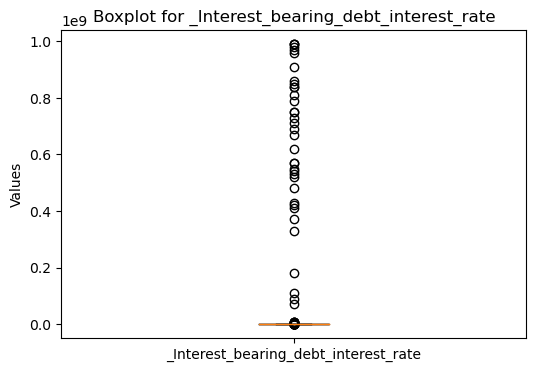

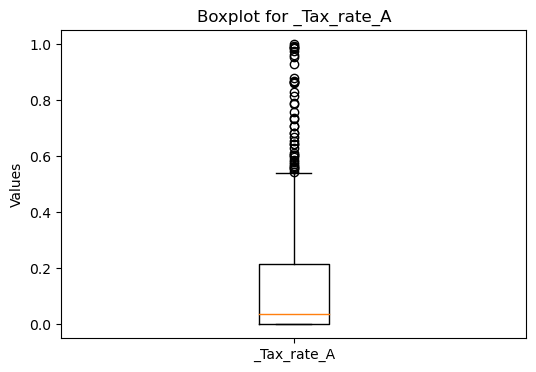

...

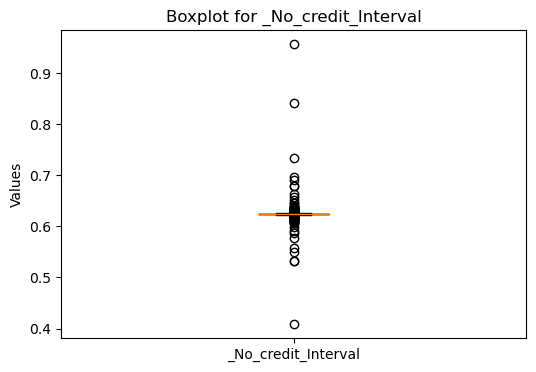

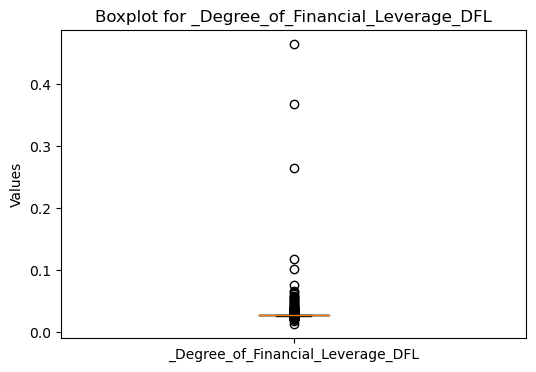

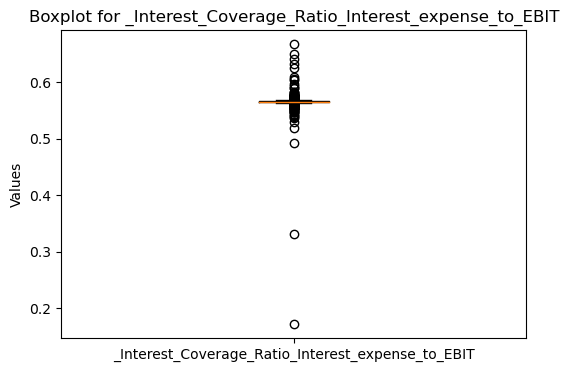

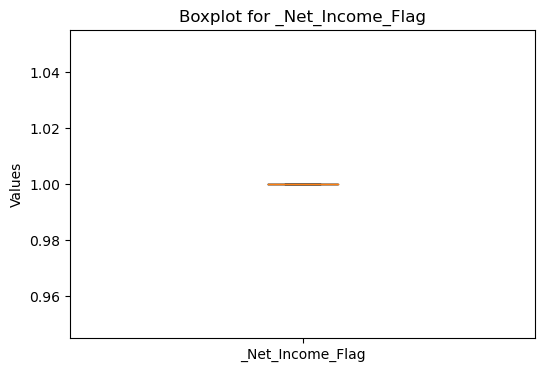

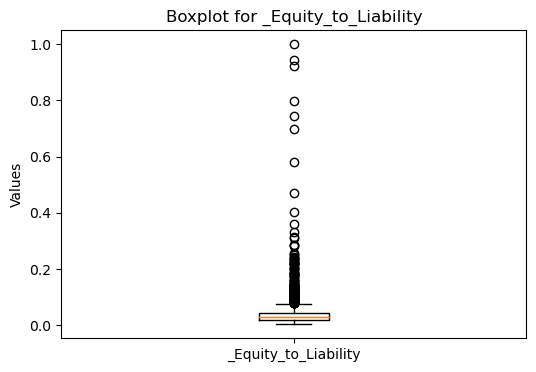

In [17]:
plt.figure(figsize=(12, 6))

# Loop through each column and create a boxplot
for column in df_X:
    plt.figure(figsize=(6, 4))  # Set individual plot size
    plt.boxplot(df_X[column])
    plt.title("Boxplot for " + column)
    plt.ylabel("Values")
    plt.xticks([1], [column])  # Set x-axis label
    plt.show()

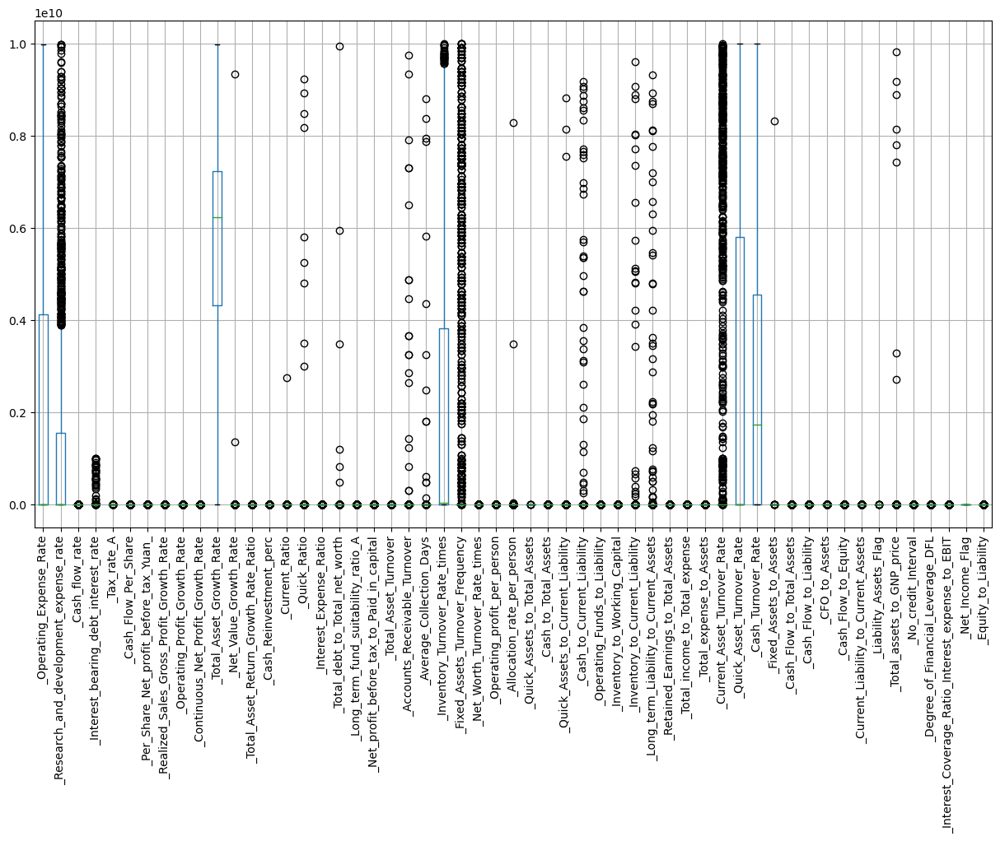

In [18]:
df_X.boxplot(figsize=(15,8))
plt.xticks(rotation=90)
plt.show();

In [19]:
df_X.head()

,_Operating_Expense_Rate,_Research_and_development_expense_rate,_Cash_flow_rate,_Interest_bearing_debt_interest_rate,_Tax_rate_A,_Cash_Flow_Per_Share,_Per_Share_Net_profit_before_tax_Yuan_,_Realized_Sales_Gross_Profit_Growth_Rate,_Operating_Profit_Growth_Rate,_Continuous_Net_Profit_Growth_Rate,...,_CFO_to_Assets,_Cash_Flow_to_Equity,_Current_Liability_to_Current_Assets,_Liability_Assets_Flag,_Total_assets_to_GNP_price,_No_credit_Interval,_Degree_of_Financial_Leverage_DFL,_Interest_Coverage_Ratio_Interest_expense_to_EBIT,_Net_Income_Flag,_Equity_to_Liability
0,8.820000e+09,0.000000e+00,0.462045,0.000352,0.001417,0.322558,0.194472,0.022074,0.848021,0.217590,...,0.576869,0.310901,0.034913,0,0.028801,0.620927,0.026930,0.565744,1,0.015338
1,9.380000e+09,4.230000e+09,0.460116,0.000716,0.000000,0.315520,0.161633,0.021902,0.839645,0.217360,...,0.551523,0.314572,0.041653,0,0.006191,0.622513,0.026297,0.560741,1,0.029445
2,3.800000e+09,8.150000e+08,0.449893,0.000496,0.000000,0.299851,0.172554,0.022186,0.848196,0.217573,...,0.463045,0.314777,0.033560,0,0.001095,0.623749,0.027276,0.566744,1,0.041718
3,6.440000e+09,0.000000e+00,0.462731,0.000592,0.009313,0.319834,0.174738,0.027638,0.848391,0.217662,...,0.577212,0.316974,0.016527,0,0.003749,0.622963,0.026988,0.565950,1,0.026956
4,3.680000e+09,0.000000e+00,0.463117,0.000782,0.400243,0.325104,0.176546,0.022072,0.847987,0.217589,...,0.594038,0.317729,0.034497,0,0.006595,0.624419,0.027498,0.567177,1,0.019900


In [20]:
def remove_outlier(data):
    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)
    iqr = q3 - q1
    lower_limit = q1 - 1.5 * iqr
    upper_limit = q3 + 1.5 * iqr
    return lower_limit, upper_limit

In [21]:
for column in df_X.columns:
    lower_limit, upper_limit = remove_outlier(df_X[column])
    df_X[column] = np.where(df_X[column] > upper_limit, upper_limit, df_X[column])
    df_X[column] = np.where(df_X[column] < lower_limit, lower_limit, df_X[column])

<Figure size 1200x600 with 0 Axes>

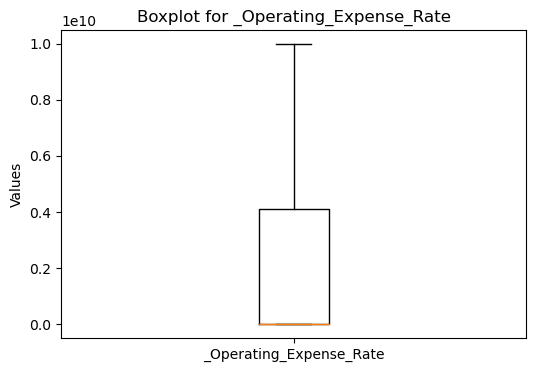

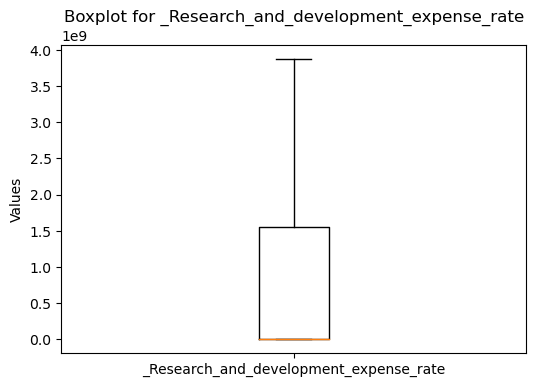

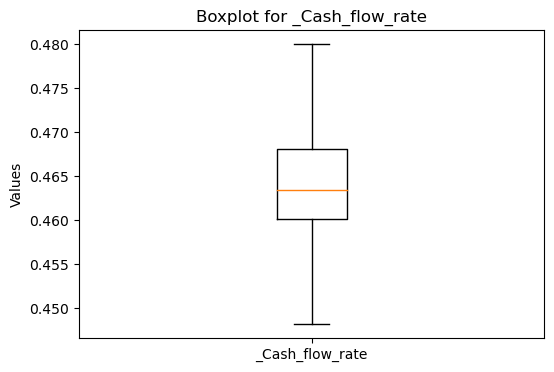

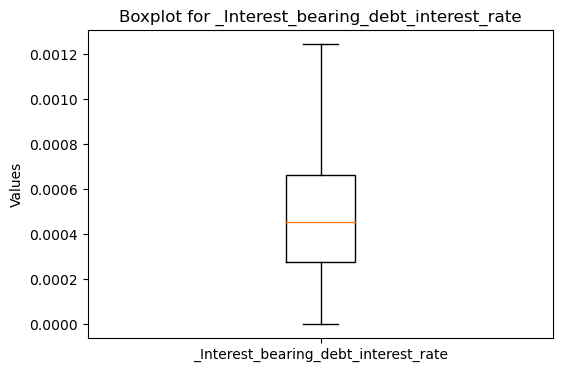

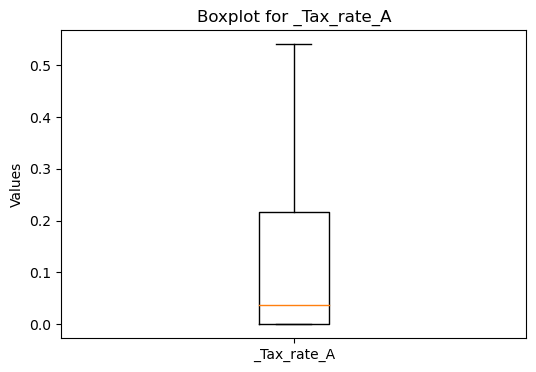

...

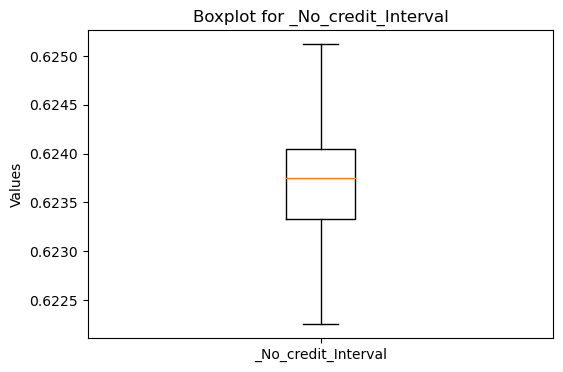

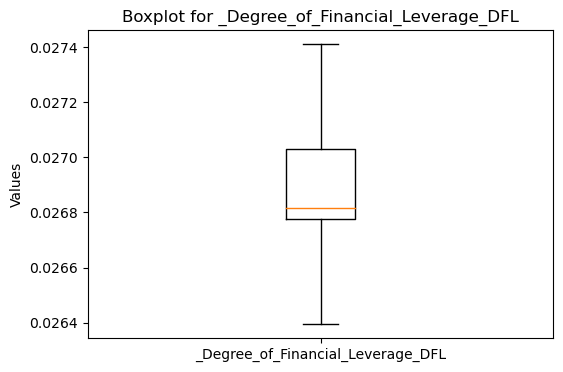

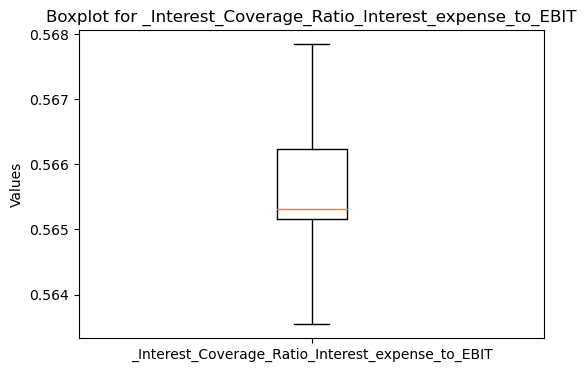

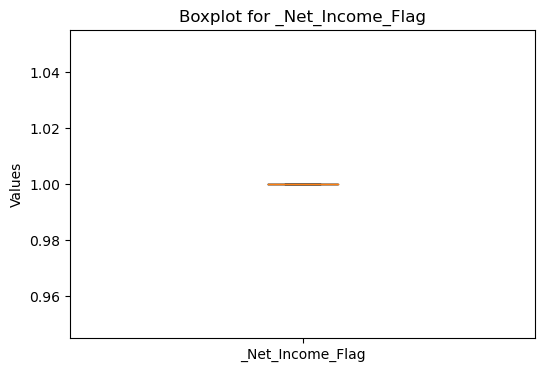

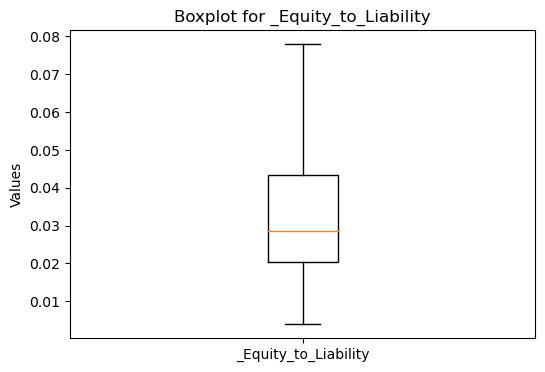

In [22]:
plt.figure(figsize=(12, 6))

# Loop through each column and create a boxplot
for column in df_X:
    plt.figure(figsize=(6, 4))  # Set individual plot size
    plt.boxplot(df_X[column])
    plt.title("Boxplot for " + column)
    plt.ylabel("Values")
    plt.xticks([1], [column])  # Set x-axis label
    plt.show()
    

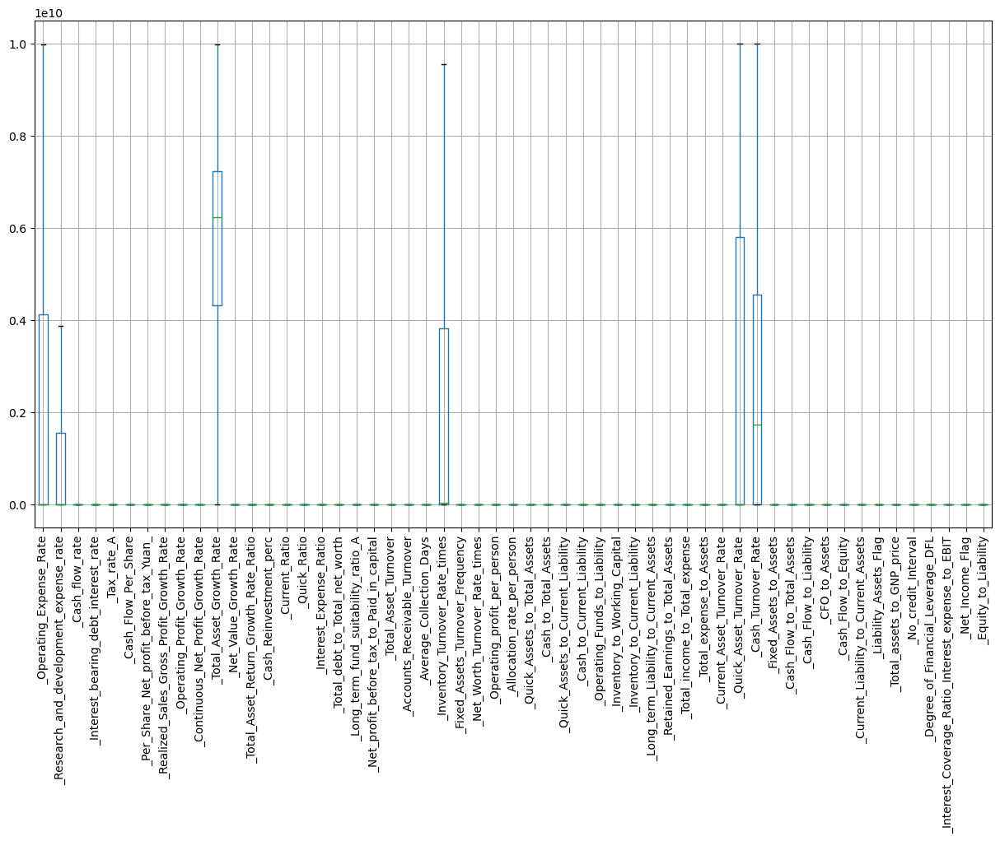

In [23]:
df_X.boxplot(figsize=(15,8))
plt.xticks(rotation=90)
plt.show();

<Figure size 1200x600 with 0 Axes>

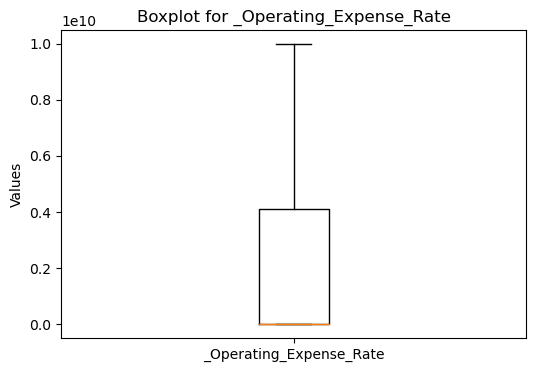

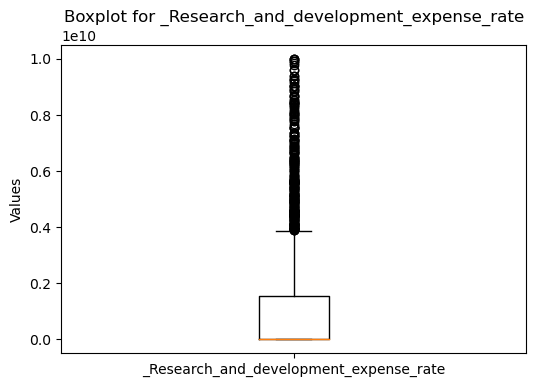

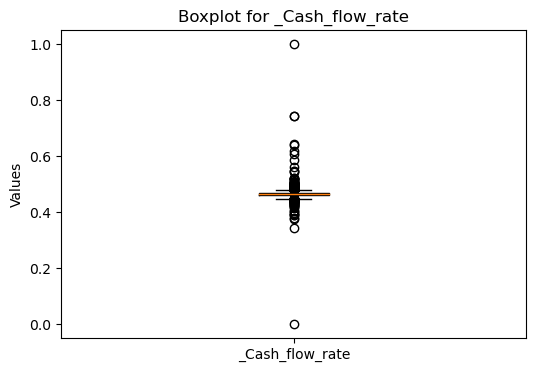

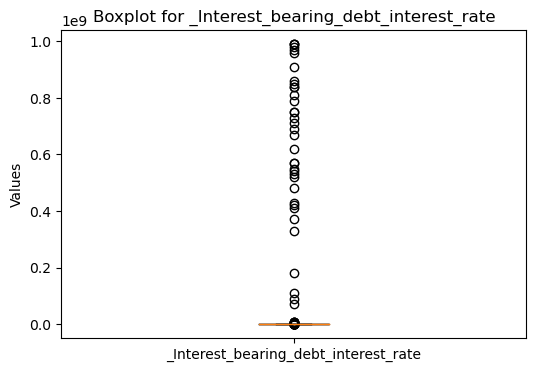

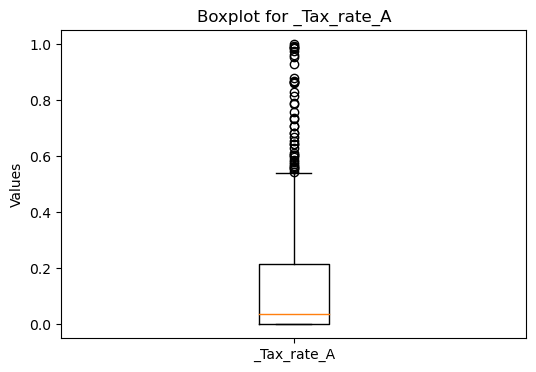

...

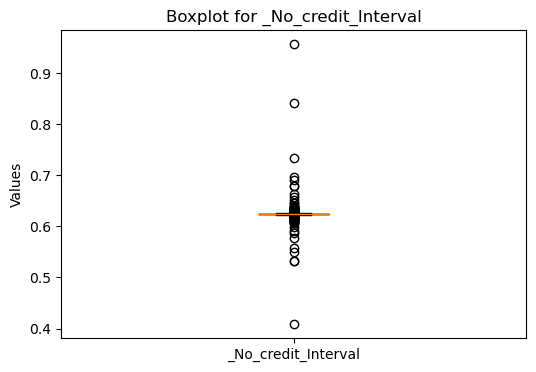

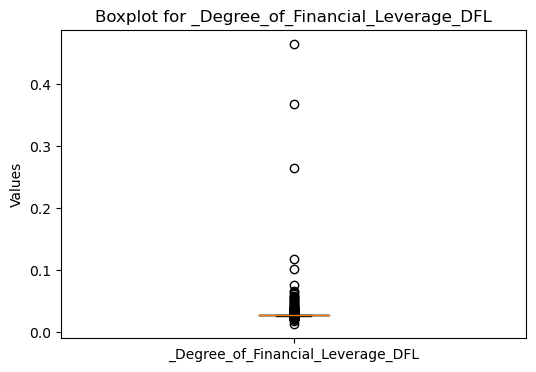

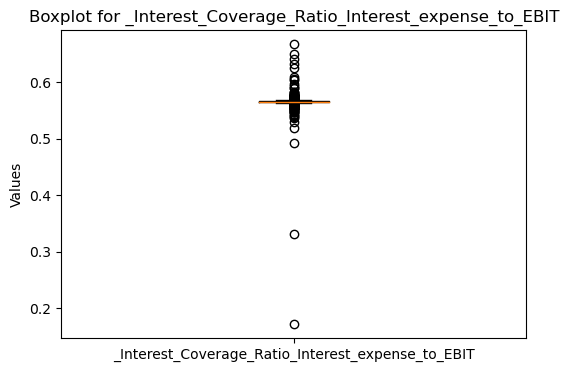

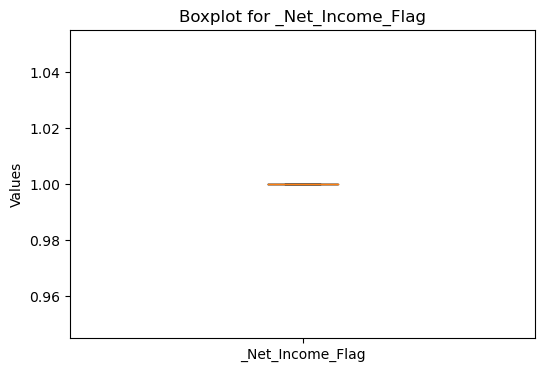

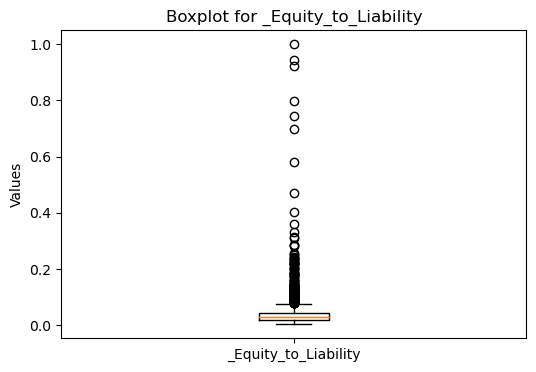

In [24]:
plt.figure(figsize=(12, 6))

# Loop through each column and create a boxplot
for column in numeric_cols:
    plt.figure(figsize=(6, 4))  # Set individual plot size
    plt.boxplot(df[column])
    plt.title("Boxplot for " + column)
    plt.ylabel("Values")
    plt.xticks([1], [column])  # Set x-axis label
    plt.show()

In [25]:
df.head()

,Co_Code,Co_Name,_Operating_Expense_Rate,_Research_and_development_expense_rate,_Cash_flow_rate,_Interest_bearing_debt_interest_rate,_Tax_rate_A,_Cash_Flow_Per_Share,_Per_Share_Net_profit_before_tax_Yuan_,_Realized_Sales_Gross_Profit_Growth_Rate,...,_Cash_Flow_to_Equity,_Current_Liability_to_Current_Assets,_Liability_Assets_Flag,_Total_assets_to_GNP_price,_No_credit_Interval,_Degree_of_Financial_Leverage_DFL,_Interest_Coverage_Ratio_Interest_expense_to_EBIT,_Net_Income_Flag,_Equity_to_Liability,Default
0,16974,Hind.Cables,8.820000e+09,0.000000e+00,0.462045,0.000352,0.001417,0.322558,0.194472,0.022074,...,0.310901,0.034913,0,0.028801,0.620927,0.026930,0.565744,1,0.015338,0
1,21214,Tata Tele. Mah.,9.380000e+09,4.230000e+09,0.460116,0.000716,0.000000,0.315520,0.161633,0.021902,...,0.314572,0.041653,0,0.006191,0.622513,0.026297,0.560741,1,0.029445,1
2,14852,ABG Shipyard,3.800000e+09,8.150000e+08,0.449893,0.000496,0.000000,0.299851,0.172554,0.022186,...,0.314777,0.033560,0,0.001095,0.623749,0.027276,0.566744,1,0.041718,0
3,2439,GTL,6.440000e+09,0.000000e+00,0.462731,0.000592,0.009313,0.319834,0.174738,0.027638,...,0.316974,0.016527,0,0.003749,0.622963,0.026988,0.565950,1,0.026956,0
4,23505,Bharati Defence,3.680000e+09,0.000000e+00,0.463117,0.000782,0.400243,0.325104,0.176546,0.022072,...,0.317729,0.034497,0,0.006595,0.624419,0.027498,0.567177,1,0.019900,0


In [26]:
df.isnull().sum()

Co_Code                                                0
Co_Name                                                0
_Operating_Expense_Rate                                0
_Research_and_development_expense_rate                 0
_Cash_flow_rate                                        0
_Interest_bearing_debt_interest_rate                   0
_Tax_rate_A                                            0
_Cash_Flow_Per_Share                                 167
_Per_Share_Net_profit_before_tax_Yuan_                 0
_Realized_Sales_Gross_Profit_Growth_Rate               0
_Operating_Profit_Growth_Rate                          0
_Continuous_Net_Profit_Growth_Rate                     0
_Total_Asset_Growth_Rate                               0
_Net_Value_Growth_Rate                                 0
_Total_Asset_Return_Growth_Rate_Ratio                  0
_Cash_Reinvestment_perc                                0
_Current_Ratio                                         0
_Quick_Ratio                   

In [27]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5)

In [28]:
df1 = pd.DataFrame(imputer.fit_transform(df_X), columns = df_X.columns)

In [29]:
df1.isnull().sum()

_Operating_Expense_Rate                              0
_Research_and_development_expense_rate               0
_Cash_flow_rate                                      0
_Interest_bearing_debt_interest_rate                 0
_Tax_rate_A                                          0
_Cash_Flow_Per_Share                                 0
_Per_Share_Net_profit_before_tax_Yuan_               0
_Realized_Sales_Gross_Profit_Growth_Rate             0
_Operating_Profit_Growth_Rate                        0
_Continuous_Net_Profit_Growth_Rate                   0
_Total_Asset_Growth_Rate                             0
_Net_Value_Growth_Rate                               0
_Total_Asset_Return_Growth_Rate_Ratio                0
_Cash_Reinvestment_perc                              0
_Current_Ratio                                       0
_Quick_Ratio                                         0
_Interest_Expense_Ratio                              0
_Total_debt_to_Total_net_worth                       0
_Long_term

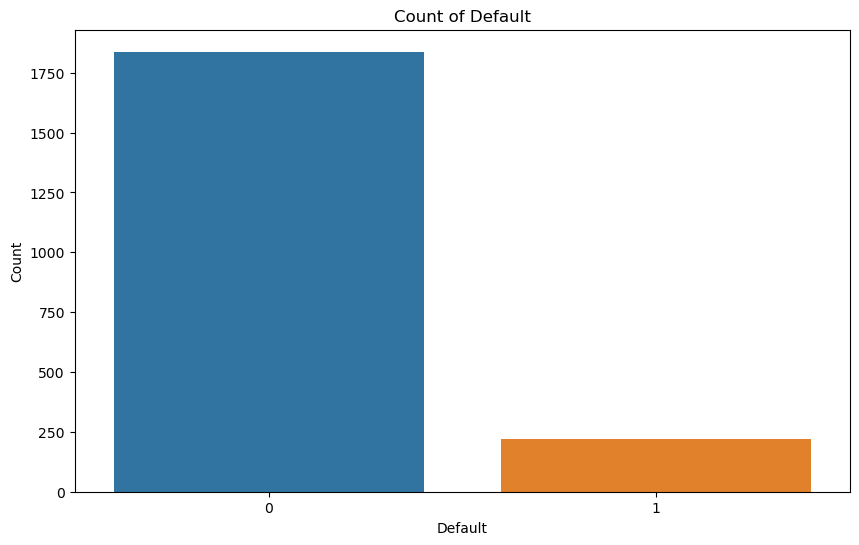

In [30]:
plt.figure(figsize=(10, 6))  # Set the figure size
sns.countplot(data=df, x='Default')

plt.xlabel('Default')
plt.ylabel('Count')
plt.title('Count of Default')
plt.show()

In [31]:
df['Default'].value_counts()

0    1838
1     220
Name: Default, dtype: int64

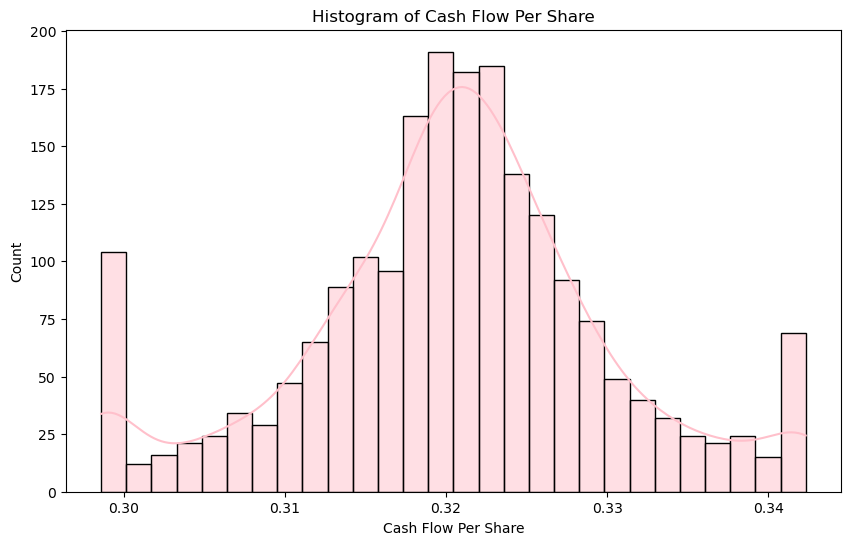

In [32]:
plt.figure(figsize=(10, 6))  

sns.histplot(data=df1, x='_Cash_Flow_Per_Share', color='pink', kde=True)

plt.xlabel('Cash Flow Per Share')
plt.ylabel('Count')
plt.title('Histogram of Cash Flow Per Share')

plt.show()

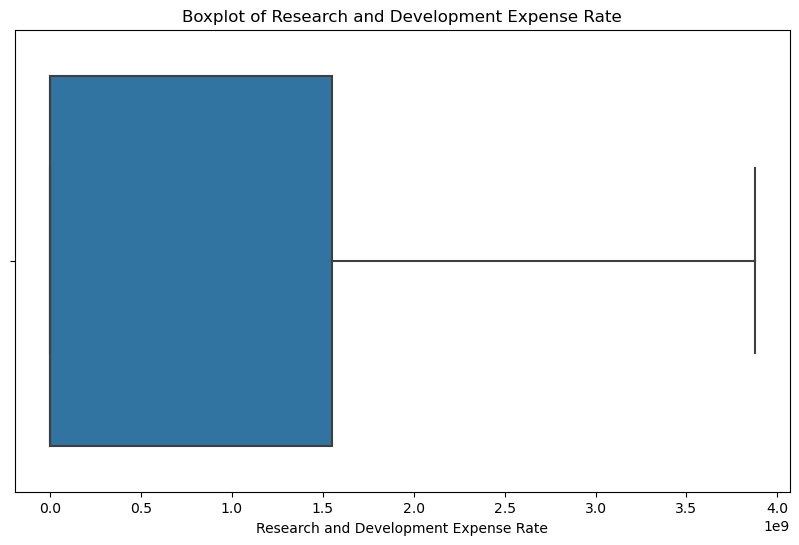

In [33]:
plt.figure(figsize=(10, 6))  

sns.boxplot(data=df1, x="_Research_and_development_expense_rate")

plt.xlabel("Research and Development Expense Rate")
plt.title("Boxplot of Research and Development Expense Rate")

plt.show()

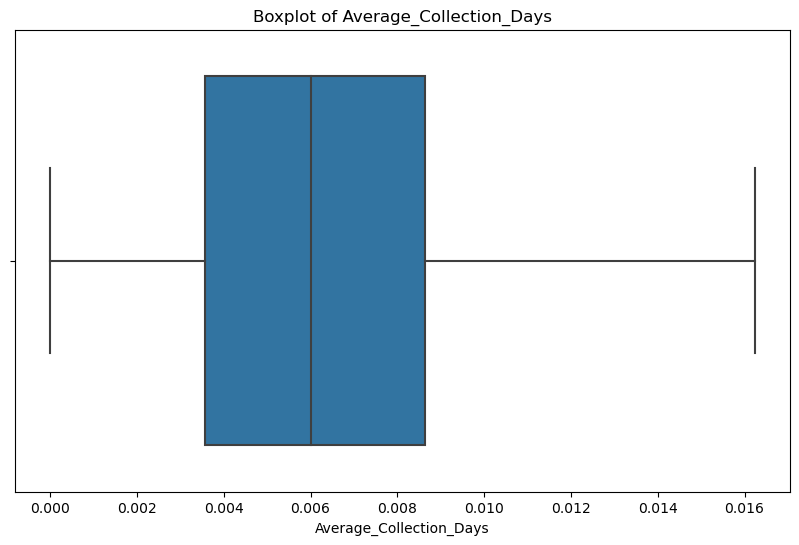

In [34]:
plt.figure(figsize=(10, 6))  

sns.boxplot(data=df1, x="_Average_Collection_Days")

plt.xlabel("Average_Collection_Days")
plt.title("Boxplot of Average_Collection_Days")

plt.show()

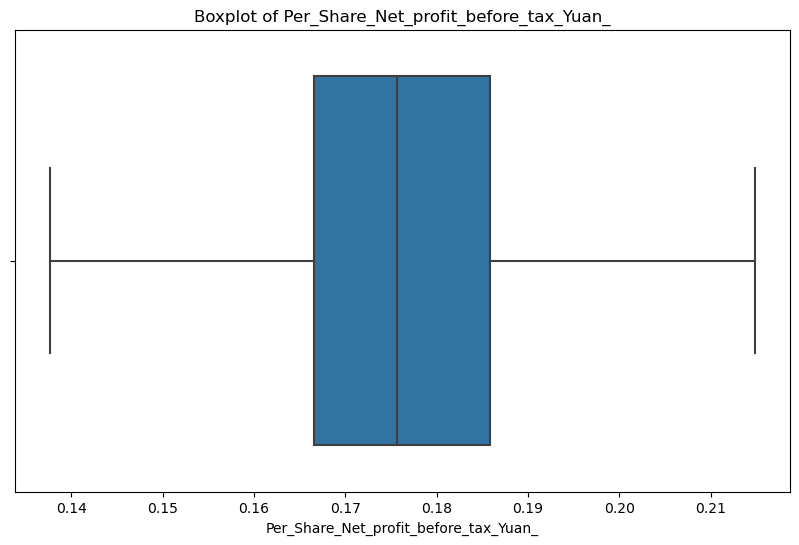

In [35]:
plt.figure(figsize=(10, 6))  

sns.boxplot(data=df1, x="_Per_Share_Net_profit_before_tax_Yuan_")

plt.xlabel("Per_Share_Net_profit_before_tax_Yuan_")
plt.title("Boxplot of Per_Share_Net_profit_before_tax_Yuan_")

plt.show()

In [36]:
BV = pd.concat([df1, df_Y], axis = 1)

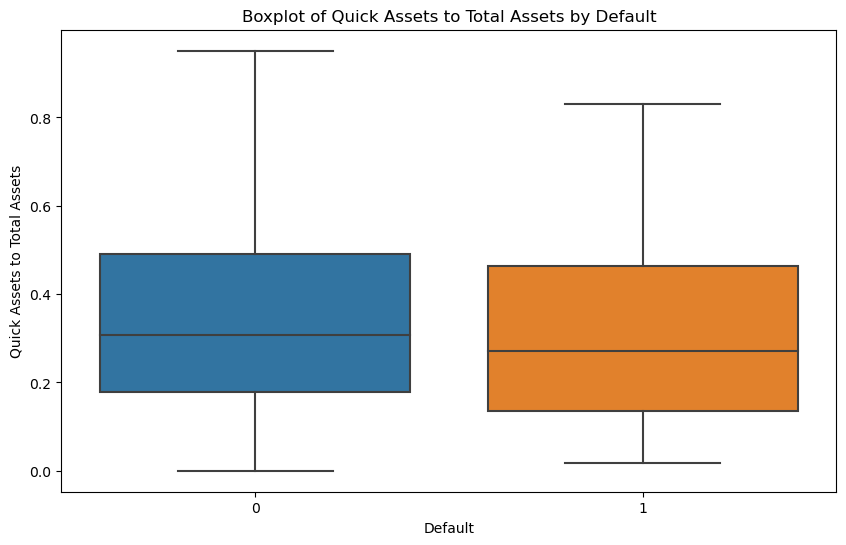

In [37]:
plt.figure(figsize=(10, 6))

sns.boxplot(data=BV, x='Default', y='_Quick_Assets_to_Total_Assets')

plt.xlabel('Default')
plt.ylabel('Quick Assets to Total Assets')
plt.title('Boxplot of Quick Assets to Total Assets by Default')

plt.show()

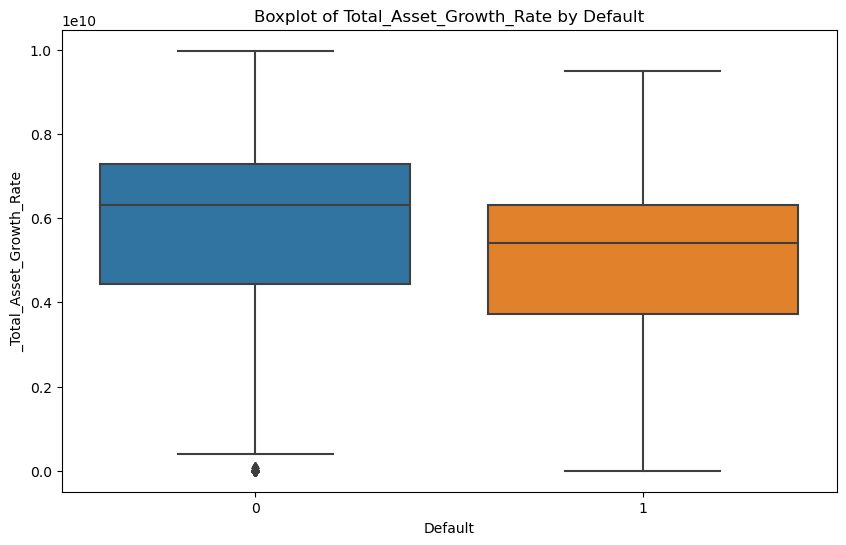

In [38]:
plt.figure(figsize=(10, 6))

sns.boxplot(data=BV, x='Default', y='_Total_Asset_Growth_Rate')

plt.xlabel('Default')
plt.ylabel('_Total_Asset_Growth_Rate')
plt.title('Boxplot of Total_Asset_Growth_Rate by Default')

plt.show()

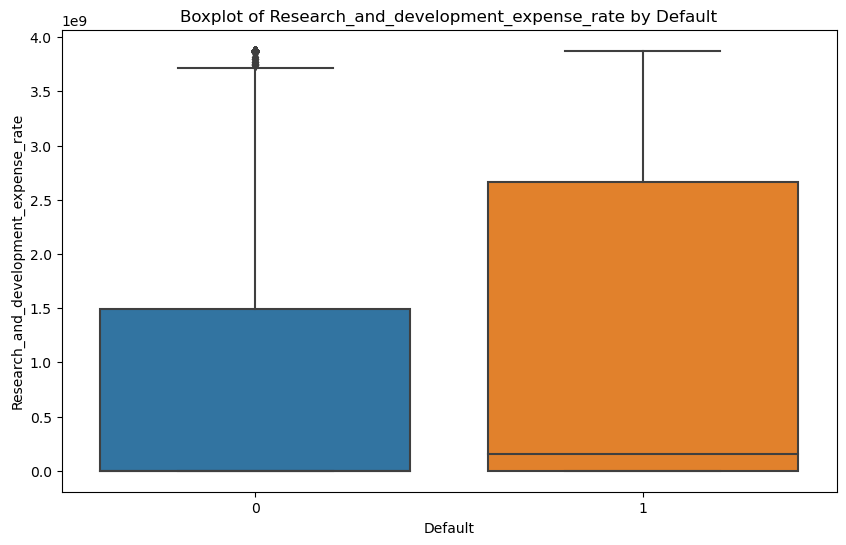

In [39]:
plt.figure(figsize=(10, 6))

sns.boxplot(data=BV, x='Default', y='_Research_and_development_expense_rate')

plt.xlabel('Default')
plt.ylabel('Research_and_development_expense_rate')
plt.title('Boxplot of Research_and_development_expense_rate by Default')

plt.show()

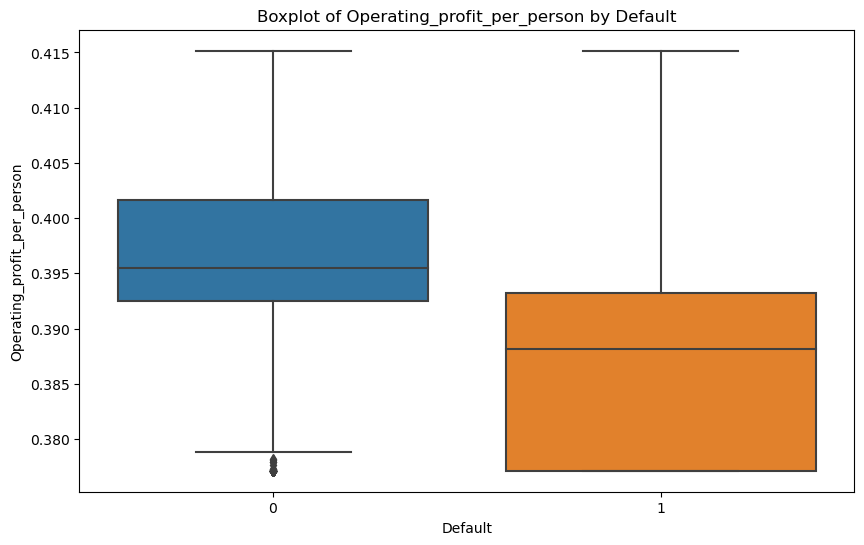

In [40]:
plt.figure(figsize=(10, 6))

sns.boxplot(data=BV, x='Default', y='_Operating_profit_per_person')

plt.xlabel('Default')
plt.ylabel('Operating_profit_per_person')
plt.title('Boxplot of Operating_profit_per_person by Default')

plt.show()

In [41]:
df1 = df1.drop(['_Realized_Sales_Gross_Profit_Growth_Rate', 
                  '_Operating_Profit_Growth_Rate', 
                  '_Continuous_Net_Profit_Growth_Rate', 
                  '_Current_Asset_Turnover_Rate', 
                  '_Cash_Flow_to_Liability', 
                  '_No_credit_Interval', 
                  '_Degree_of_Financial_Leverage_DFL', 
                  '_Interest_bearing_debt_interest_rate', 
                  '_Net_Value_Growth_Rate', 
                  '_Total_Asset_Return_Growth_Rate_Ratio', 
                  '_Interest_Expense_Ratio', 
                  '_Long_term_fund_suitability_ratio_A', 
                  '_Accounts_Receivable_Turnover', 
                  '_Inventory_to_Working_Capital', 
                  '_Retained_Earnings_to_Total_Assets', 
                  '_Total_income_to_Total_expense', 
                  '_Interest_Coverage_Ratio_Interest_expense_to_EBIT'],axis=1)

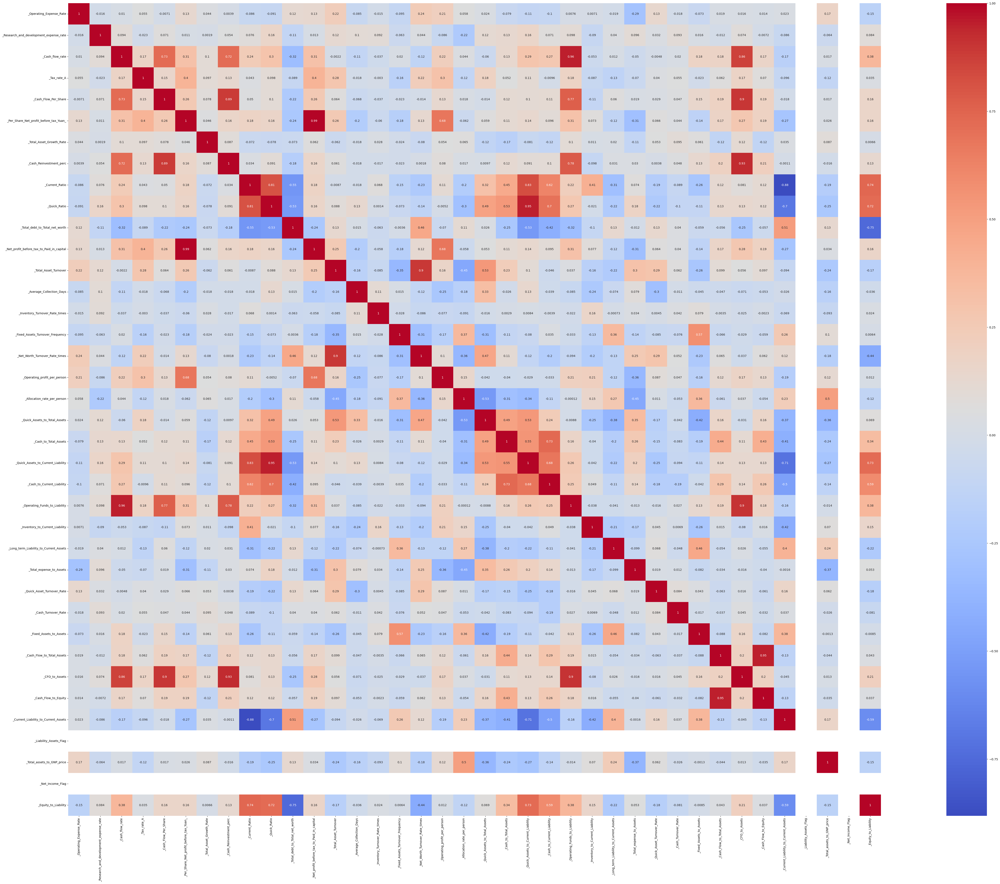

In [42]:
plt.figure(figsize=(80,50))  # setting the size of figure to 12 by 10
p=sns.heatmap(df1.corr(), annot=True,cmap='coolwarm',square=True)

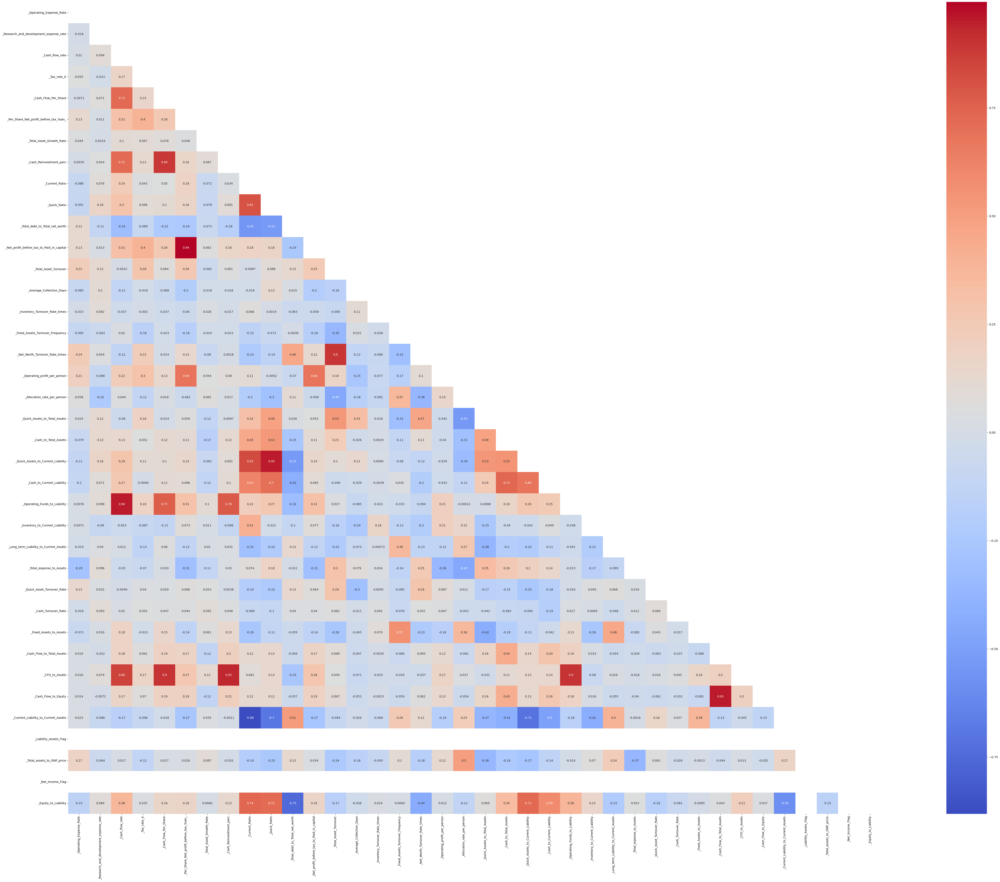

In [43]:
plt.figure(figsize=(80, 50))
corr_matrix = df1.corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
p = sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', square=True, mask=mask)


In [44]:
from sklearn.preprocessing import StandardScaler #Scale train and test separately
scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(df1), columns =df1.columns)

In [45]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [46]:
calc_vif(X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
11,_Net_profit_before_tax_to_Paid_in_capital,95.987931
5,_Per_Share_Net_profit_before_tax_Yuan_,95.913815
31,_CFO_to_Assets,28.400461
23,_Operating_Funds_to_Liability,20.924898
21,_Quick_Assets_to_Current_Liability,19.152383
2,_Cash_flow_rate,15.855457
16,_Net_Worth_Turnover_Rate_times,14.181975
8,_Current_Ratio,13.868594
12,_Total_Asset_Turnover,12.810488
9,_Quick_Ratio,12.306470


In [47]:
X = X.drop('_Net_profit_before_tax_to_Paid_in_capital', axis = 1)
calc_vif(X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
30,_CFO_to_Assets,27.858131
22,_Operating_Funds_to_Liability,20.878370
20,_Quick_Assets_to_Current_Liability,19.149233
2,_Cash_flow_rate,15.852557
15,_Net_Worth_Turnover_Rate_times,14.161670
8,_Current_Ratio,13.863576
11,_Total_Asset_Turnover,12.810426
9,_Quick_Ratio,12.306459
29,_Cash_Flow_to_Total_Assets,12.157870
31,_Cash_Flow_to_Equity,12.138745


In [48]:
X = X.drop('_CFO_to_Assets', axis = 1)
calc_vif(X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
20,_Quick_Assets_to_Current_Liability,19.139529
22,_Operating_Funds_to_Liability,18.358500
2,_Cash_flow_rate,15.332538
15,_Net_Worth_Turnover_Rate_times,14.161539
8,_Current_Ratio,13.859090
11,_Total_Asset_Turnover,12.810415
9,_Quick_Ratio,12.305887
29,_Cash_Flow_to_Total_Assets,12.075593
30,_Cash_Flow_to_Equity,12.051185
31,_Current_Liability_to_Current_Assets,6.643446


In [49]:
X = X.drop('_Quick_Assets_to_Current_Liability', axis = 1)
calc_vif(X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
21,_Operating_Funds_to_Liability,18.152901
2,_Cash_flow_rate,15.082986
15,_Net_Worth_Turnover_Rate_times,14.124183
11,_Total_Asset_Turnover,12.735871
28,_Cash_Flow_to_Total_Assets,12.054768
29,_Cash_Flow_to_Equity,12.028380
8,_Current_Ratio,11.996144
9,_Quick_Ratio,7.752976
30,_Current_Liability_to_Current_Assets,6.618412
7,_Cash_Reinvestment_perc,6.421775


In [50]:
X = X.drop('_Operating_Funds_to_Liability', axis = 1)
calc_vif(X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
15,_Net_Worth_Turnover_Rate_times,13.975800
11,_Total_Asset_Turnover,12.599977
27,_Cash_Flow_to_Total_Assets,12.023249
28,_Cash_Flow_to_Equity,11.980578
8,_Current_Ratio,11.838470
9,_Quick_Ratio,7.645461
29,_Current_Liability_to_Current_Assets,6.614068
7,_Cash_Reinvestment_perc,5.733025
4,_Cash_Flow_Per_Share,5.667950
33,_Equity_to_Liability,5.160051


In [51]:
X = X.drop('_Net_Worth_Turnover_Rate_times', axis = 1)
calc_vif(X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
26,_Cash_Flow_to_Total_Assets,12.023249
27,_Cash_Flow_to_Equity,11.979256
8,_Current_Ratio,11.799870
9,_Quick_Ratio,7.578424
28,_Current_Liability_to_Current_Assets,6.612983
7,_Cash_Reinvestment_perc,5.721135
4,_Cash_Flow_Per_Share,5.667654
32,_Equity_to_Liability,5.113359
17,_Quick_Assets_to_Total_Assets,4.866967
19,_Cash_to_Current_Liability,4.224715


In [52]:
X = X.drop('_Cash_Flow_to_Total_Assets', axis = 1)
calc_vif(X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
8,_Current_Ratio,11.799504
9,_Quick_Ratio,7.577413
27,_Current_Liability_to_Current_Assets,6.602654
7,_Cash_Reinvestment_perc,5.648707
4,_Cash_Flow_Per_Share,5.641759
31,_Equity_to_Liability,5.104238
17,_Quick_Assets_to_Total_Assets,4.866050
19,_Cash_to_Current_Liability,4.183806
18,_Cash_to_Total_Assets,3.635088
2,_Cash_flow_rate,3.221914


In [53]:
X = X.drop('_Current_Ratio', axis = 1)
calc_vif(X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
8,_Quick_Ratio,5.963413
7,_Cash_Reinvestment_perc,5.643043
4,_Cash_Flow_Per_Share,5.632355
16,_Quick_Assets_to_Total_Assets,4.840001
30,_Equity_to_Liability,4.611856
26,_Current_Liability_to_Current_Assets,4.397061
18,_Cash_to_Current_Liability,4.180390
17,_Cash_to_Total_Assets,3.634742
2,_Cash_flow_rate,3.219693
10,_Total_Asset_Turnover,3.004138


In [54]:
X = X.drop('_Quick_Ratio', axis = 1)
calc_vif(X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
7,_Cash_Reinvestment_perc,5.642553
4,_Cash_Flow_Per_Share,5.605405
15,_Quick_Assets_to_Total_Assets,4.099688
29,_Equity_to_Liability,3.797976
25,_Current_Liability_to_Current_Assets,3.648880
17,_Cash_to_Current_Liability,3.609171
16,_Cash_to_Total_Assets,3.558687
2,_Cash_flow_rate,3.189152
9,_Total_Asset_Turnover,2.998711
8,_Total_debt_to_Total_net_worth,2.921688


In [55]:
X = X.drop('_Cash_Reinvestment_perc', axis = 1)
calc_vif(X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
14,_Quick_Assets_to_Total_Assets,4.098079
28,_Equity_to_Liability,3.785433
24,_Current_Liability_to_Current_Assets,3.628274
16,_Cash_to_Current_Liability,3.602009
15,_Cash_to_Total_Assets,3.550621
8,_Total_Asset_Turnover,2.985223
7,_Total_debt_to_Total_net_worth,2.911499
2,_Cash_flow_rate,2.878504
5,_Per_Share_Net_profit_before_tax_Yuan_,2.628898
22,_Fixed_Assets_to_Assets,2.505774


In [56]:
X = X.drop('_Liability_Assets_Flag', axis = 1)
calc_vif(X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
14,_Quick_Assets_to_Total_Assets,4.098079
27,_Equity_to_Liability,3.785433
24,_Current_Liability_to_Current_Assets,3.628274
16,_Cash_to_Current_Liability,3.602009
15,_Cash_to_Total_Assets,3.550621
8,_Total_Asset_Turnover,2.985223
7,_Total_debt_to_Total_net_worth,2.911499
2,_Cash_flow_rate,2.878504
5,_Per_Share_Net_profit_before_tax_Yuan_,2.628898
22,_Fixed_Assets_to_Assets,2.505774


In [57]:
X = X.drop('_Net_Income_Flag', axis = 1)
calc_vif(X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
14,_Quick_Assets_to_Total_Assets,4.098079
26,_Equity_to_Liability,3.785433
24,_Current_Liability_to_Current_Assets,3.628274
16,_Cash_to_Current_Liability,3.602009
15,_Cash_to_Total_Assets,3.550621
8,_Total_Asset_Turnover,2.985223
7,_Total_debt_to_Total_net_worth,2.911499
2,_Cash_flow_rate,2.878504
5,_Per_Share_Net_profit_before_tax_Yuan_,2.628898
22,_Fixed_Assets_to_Assets,2.505774


In [58]:
X.shape

(2058, 27)

In [59]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, df_Y, test_size=0.33, random_state=42, stratify = df_Y)


In [60]:
print("Train dataset shape:", X_train.shape, y_train.shape)
print("Test dataset shape:", X_test.shape, y_test.shape)

Train dataset shape: (1378, 27) (1378,)
Test dataset shape: (680, 27) (680,)


In [61]:
X_train.head()

,_Operating_Expense_Rate,_Research_and_development_expense_rate,_Cash_flow_rate,_Tax_rate_A,_Cash_Flow_Per_Share,_Per_Share_Net_profit_before_tax_Yuan_,_Total_Asset_Growth_Rate,_Total_debt_to_Total_net_worth,_Total_Asset_Turnover,_Average_Collection_Days,...,_Inventory_to_Current_Liability,_Long_term_Liability_to_Current_Assets,_Total_expense_to_Assets,_Quick_Asset_Turnover_Rate,_Cash_Turnover_Rate,_Fixed_Assets_to_Assets,_Cash_Flow_to_Equity,_Current_Liability_to_Current_Assets,_Total_assets_to_GNP_price,_Equity_to_Liability
2011,-0.631148,-0.645151,2.093814,-0.819217,1.665836,-1.319380,-0.318576,-0.619945,-0.510776,-1.408818,...,2.339449,-0.684788,0.925107,0.471582,-0.762507,-0.989209,-0.012152,-0.880024,-0.673772,0.067741
697,-0.631148,0.566343,0.256393,1.520875,0.860006,0.935610,0.114130,-0.409237,0.549087,0.984423,...,0.075034,-0.776160,-0.186256,1.922618,1.253760,0.196344,-1.215210,-0.335344,-0.567406,-0.234766
160,-0.631148,-0.645151,-0.718630,-0.819217,-0.581192,-0.279579,0.478153,0.174314,-0.977835,-0.338722,...,-0.541959,0.719898,-0.404241,-0.744856,-0.940840,-0.025362,0.929920,0.287934,1.633784,-0.634845
1273,1.201664,1.341698,-0.250583,-0.819217,0.046057,-0.542661,0.066052,0.327921,2.444266,0.307238,...,-0.821618,-0.776160,0.319444,1.743049,0.009326,-0.995493,-1.946695,-0.213819,0.897458,-0.693777
541,-0.631148,-0.186860,-0.516785,-0.819217,-0.426224,-0.651234,0.498758,-0.184963,-0.259283,0.129865,...,0.169549,-0.500322,0.011740,1.583753,-0.769598,0.153299,-0.087736,0.233950,0.447642,-0.436084


In [62]:
X_test.head()

,_Operating_Expense_Rate,_Research_and_development_expense_rate,_Cash_flow_rate,_Tax_rate_A,_Cash_Flow_Per_Share,_Per_Share_Net_profit_before_tax_Yuan_,_Total_Asset_Growth_Rate,_Total_debt_to_Total_net_worth,_Total_Asset_Turnover,_Average_Collection_Days,...,_Inventory_to_Current_Liability,_Long_term_Liability_to_Current_Assets,_Total_expense_to_Assets,_Quick_Asset_Turnover_Rate,_Cash_Turnover_Rate,_Fixed_Assets_to_Assets,_Cash_Flow_to_Equity,_Current_Liability_to_Current_Assets,_Total_assets_to_GNP_price,_Equity_to_Liability
974,-0.631148,0.178665,1.297347,1.127607,1.510869,0.889675,0.972674,-0.457812,1.267638,-0.960397,...,0.416733,-0.168159,0.499834,0.709077,1.938022,0.656816,1.563998,-0.469643,-0.818238,-0.177746
134,-0.631148,-0.645151,-0.962554,-0.723902,-1.898415,0.547251,1.024187,0.504136,-0.941907,-0.820536,...,1.371359,-0.705228,-1.054530,-0.744856,-0.940840,-0.920221,0.770728,-0.109883,-0.498806,-0.749341
1267,-0.631148,-0.645151,-0.349818,-0.819217,-0.289705,-0.496726,-1.612230,-1.146265,-0.223356,-0.336554,...,0.794395,-0.776160,0.570942,-0.744856,2.203926,1.223052,-0.570007,-1.136756,-0.886203,2.219068
464,-0.631148,-0.645151,2.093814,1.340002,1.182486,0.839564,0.677335,-1.030511,0.872435,-1.579036,...,-1.059743,-0.234873,2.234492,0.100858,0.431228,0.568821,0.219774,0.742421,-0.209355,1.819291
579,0.577401,-0.645151,-0.384471,1.370022,-0.267567,0.004383,0.433509,-0.464142,0.926326,-0.240061,...,-0.272425,-0.776160,-0.951906,-0.744856,0.477318,-0.411408,0.462044,-0.574799,-0.681316,-0.169813


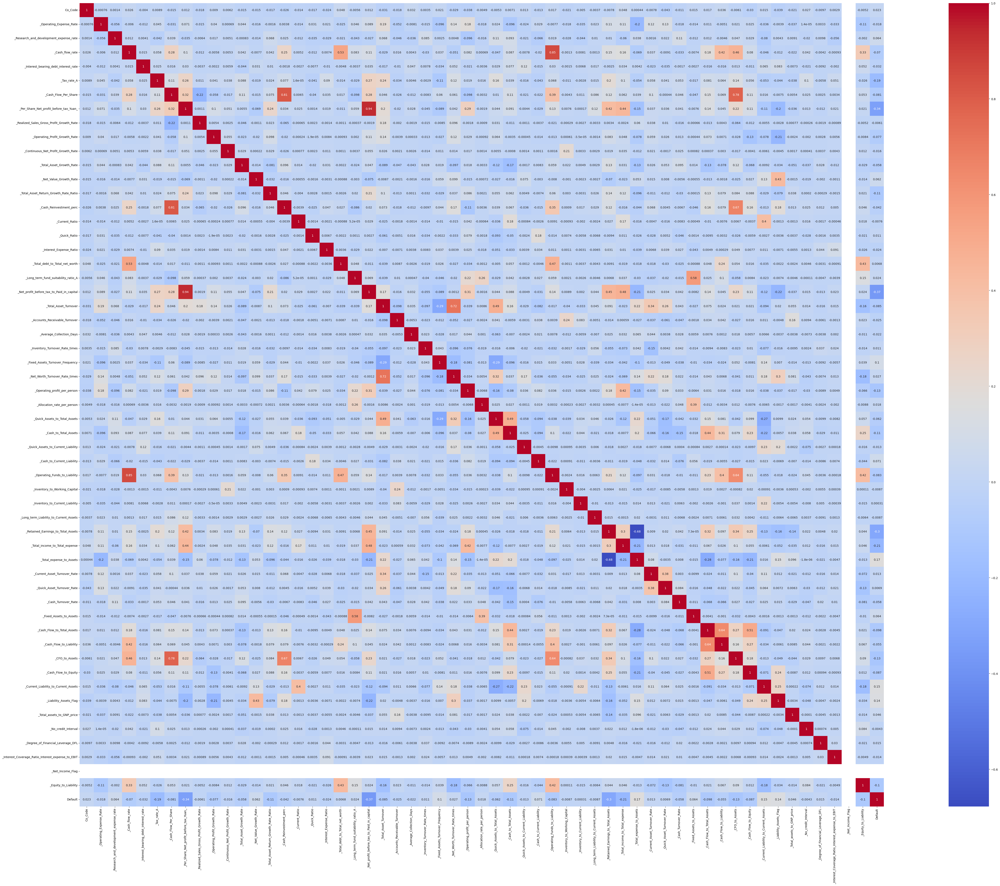

In [63]:
plt.figure(figsize=(80,50))  # setting the size of figure to 12 by 10
p=sns.heatmap(df.corr(), annot=True,cmap='coolwarm',square=True)

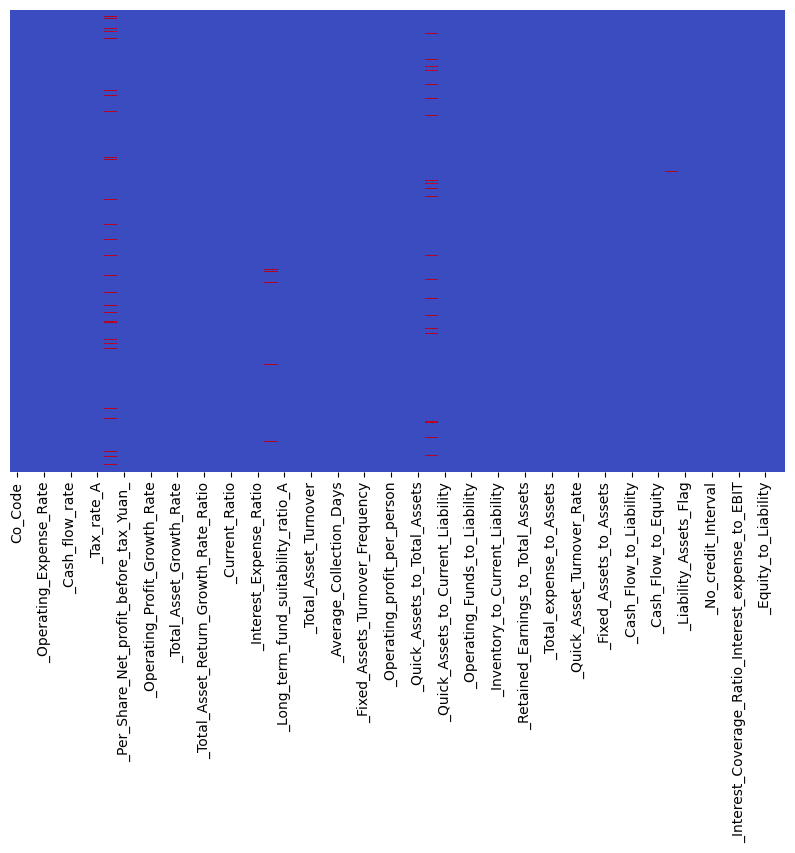

In [64]:
plt.figure(figsize=(10,6))
sns.heatmap(df.isnull(), cbar = False, cmap = "coolwarm", yticklabels = False)
plt.show()

In [65]:
company_df= df[df.isnull().sum(axis=1) <=5]

In [66]:
company_df.shape

(2058, 58)

In [67]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, df_Y, test_size=0.33, random_state=42, stratify = df_Y)

In [68]:
print("Train dataset shape:", X_train.shape, y_train.shape)
print("Test dataset shape:", X_test.shape, y_test.shape)

Train dataset shape: (1378, 27) (1378,)
Test dataset shape: (680, 27) (680,)


In [69]:
X_train.head()

,_Operating_Expense_Rate,_Research_and_development_expense_rate,_Cash_flow_rate,_Tax_rate_A,_Cash_Flow_Per_Share,_Per_Share_Net_profit_before_tax_Yuan_,_Total_Asset_Growth_Rate,_Total_debt_to_Total_net_worth,_Total_Asset_Turnover,_Average_Collection_Days,...,_Inventory_to_Current_Liability,_Long_term_Liability_to_Current_Assets,_Total_expense_to_Assets,_Quick_Asset_Turnover_Rate,_Cash_Turnover_Rate,_Fixed_Assets_to_Assets,_Cash_Flow_to_Equity,_Current_Liability_to_Current_Assets,_Total_assets_to_GNP_price,_Equity_to_Liability
2011,-0.631148,-0.645151,2.093814,-0.819217,1.665836,-1.319380,-0.318576,-0.619945,-0.510776,-1.408818,...,2.339449,-0.684788,0.925107,0.471582,-0.762507,-0.989209,-0.012152,-0.880024,-0.673772,0.067741
697,-0.631148,0.566343,0.256393,1.520875,0.860006,0.935610,0.114130,-0.409237,0.549087,0.984423,...,0.075034,-0.776160,-0.186256,1.922618,1.253760,0.196344,-1.215210,-0.335344,-0.567406,-0.234766
160,-0.631148,-0.645151,-0.718630,-0.819217,-0.581192,-0.279579,0.478153,0.174314,-0.977835,-0.338722,...,-0.541959,0.719898,-0.404241,-0.744856,-0.940840,-0.025362,0.929920,0.287934,1.633784,-0.634845
1273,1.201664,1.341698,-0.250583,-0.819217,0.046057,-0.542661,0.066052,0.327921,2.444266,0.307238,...,-0.821618,-0.776160,0.319444,1.743049,0.009326,-0.995493,-1.946695,-0.213819,0.897458,-0.693777
541,-0.631148,-0.186860,-0.516785,-0.819217,-0.426224,-0.651234,0.498758,-0.184963,-0.259283,0.129865,...,0.169549,-0.500322,0.011740,1.583753,-0.769598,0.153299,-0.087736,0.233950,0.447642,-0.436084


In [70]:
X_test.head()

,_Operating_Expense_Rate,_Research_and_development_expense_rate,_Cash_flow_rate,_Tax_rate_A,_Cash_Flow_Per_Share,_Per_Share_Net_profit_before_tax_Yuan_,_Total_Asset_Growth_Rate,_Total_debt_to_Total_net_worth,_Total_Asset_Turnover,_Average_Collection_Days,...,_Inventory_to_Current_Liability,_Long_term_Liability_to_Current_Assets,_Total_expense_to_Assets,_Quick_Asset_Turnover_Rate,_Cash_Turnover_Rate,_Fixed_Assets_to_Assets,_Cash_Flow_to_Equity,_Current_Liability_to_Current_Assets,_Total_assets_to_GNP_price,_Equity_to_Liability
974,-0.631148,0.178665,1.297347,1.127607,1.510869,0.889675,0.972674,-0.457812,1.267638,-0.960397,...,0.416733,-0.168159,0.499834,0.709077,1.938022,0.656816,1.563998,-0.469643,-0.818238,-0.177746
134,-0.631148,-0.645151,-0.962554,-0.723902,-1.898415,0.547251,1.024187,0.504136,-0.941907,-0.820536,...,1.371359,-0.705228,-1.054530,-0.744856,-0.940840,-0.920221,0.770728,-0.109883,-0.498806,-0.749341
1267,-0.631148,-0.645151,-0.349818,-0.819217,-0.289705,-0.496726,-1.612230,-1.146265,-0.223356,-0.336554,...,0.794395,-0.776160,0.570942,-0.744856,2.203926,1.223052,-0.570007,-1.136756,-0.886203,2.219068
464,-0.631148,-0.645151,2.093814,1.340002,1.182486,0.839564,0.677335,-1.030511,0.872435,-1.579036,...,-1.059743,-0.234873,2.234492,0.100858,0.431228,0.568821,0.219774,0.742421,-0.209355,1.819291
579,0.577401,-0.645151,-0.384471,1.370022,-0.267567,0.004383,0.433509,-0.464142,0.926326,-0.240061,...,-0.272425,-0.776160,-0.951906,-0.744856,0.477318,-0.411408,0.462044,-0.574799,-0.681316,-0.169813


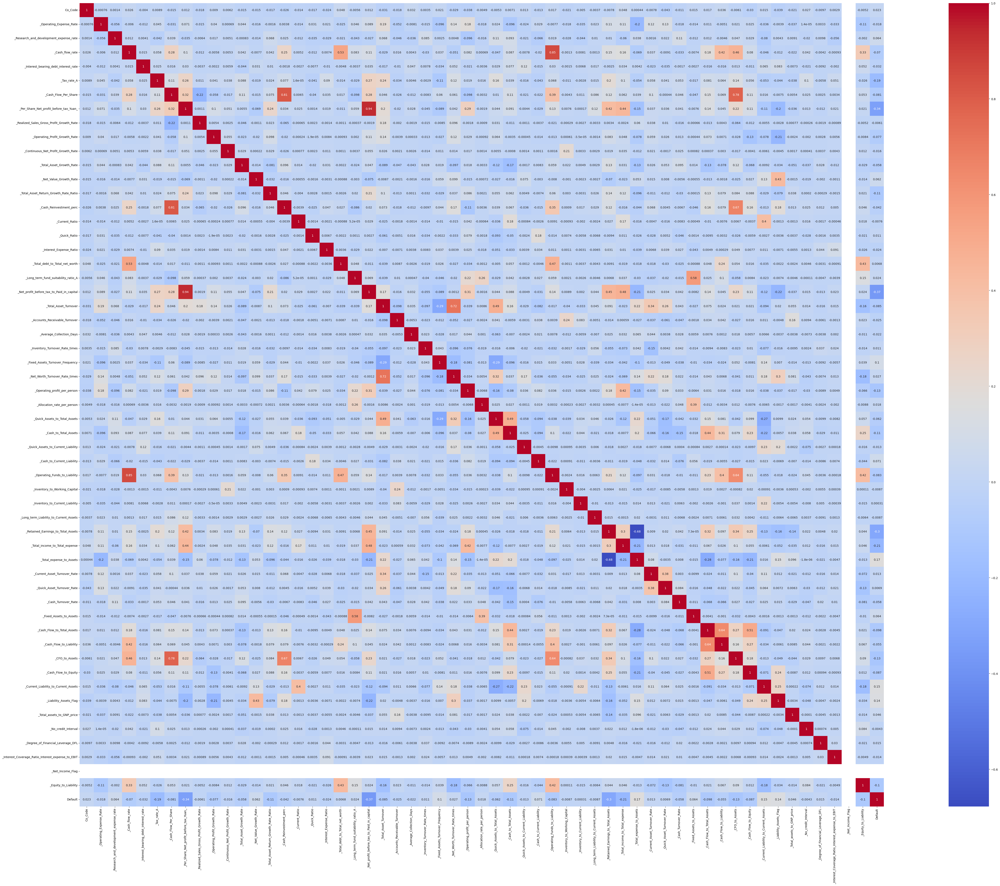

In [71]:
plt.figure(figsize=(80,50)) 
p=sns.heatmap(df.corr(), annot=True,cmap='coolwarm',square=True)

In [72]:
import statsmodels.formula.api as SM

In [73]:
Default_train = pd.concat([X_train, y_train], axis = 1)
Default_test = pd.concat([X_test, y_test], axis = 1)

In [74]:
Default_train.columns

Index(['_Operating_Expense_Rate', '_Research_and_development_expense_rate',
       '_Cash_flow_rate', '_Tax_rate_A', '_Cash_Flow_Per_Share',
       '_Per_Share_Net_profit_before_tax_Yuan_', '_Total_Asset_Growth_Rate',
       '_Total_debt_to_Total_net_worth', '_Total_Asset_Turnover',
       '_Average_Collection_Days', '_Inventory_Turnover_Rate_times',
       '_Fixed_Assets_Turnover_Frequency', '_Operating_profit_per_person',
       '_Allocation_rate_per_person', '_Quick_Assets_to_Total_Assets',
       '_Cash_to_Total_Assets', '_Cash_to_Current_Liability',
       '_Inventory_to_Current_Liability',
       '_Long_term_Liability_to_Current_Assets', '_Total_expense_to_Assets',
       '_Quick_Asset_Turnover_Rate', '_Cash_Turnover_Rate',
       '_Fixed_Assets_to_Assets', '_Cash_Flow_to_Equity',
       '_Current_Liability_to_Current_Assets', '_Total_assets_to_GNP_price',
       '_Equity_to_Liability', 'Default'],
      dtype='object')

In [75]:
Default_train.describe().T

,count,mean,std,min,25%,50%,75%,max
_Operating_Expense_Rate,1378.0,0.013326,1.009646,-0.631148,-0.631148,-0.631148,0.664275,2.437890
_Research_and_development_expense_rate,1378.0,0.018660,1.013705,-0.645151,-0.645151,-0.645151,0.536921,2.037441
_Cash_flow_rate,1378.0,0.004775,1.001436,-2.182514,-0.580803,-0.126258,0.488841,2.093814
_Tax_rate_A,1378.0,-0.003592,0.995435,-0.819217,-0.819217,-0.529895,0.769801,3.188040
_Cash_Flow_Per_Share,1378.0,0.001846,1.015075,-2.276610,-0.507398,0.034988,0.550624,2.283861
_Per_Share_Net_profit_before_tax_Yuan_,1378.0,0.000068,0.995471,-2.146209,-0.555189,-0.045728,0.526371,2.129920
_Total_Asset_Growth_Rate,1378.0,-0.042755,1.007255,-1.815876,-0.480841,0.289273,0.625822,1.611431
_Total_debt_to_Total_net_worth,1378.0,0.012537,1.008541,-1.304652,-0.755207,-0.272683,0.542377,2.467888
_Total_Asset_Turnover,1378.0,0.031520,1.008843,-1.480820,-0.726342,-0.205392,0.585014,2.444266
_Average_Collection_Days,1378.0,0.007479,0.995580,-1.630643,-0.710328,-0.094454,0.574870,2.491474


In [76]:
m2= 'Default ~ _Operating_Expense_Rate + _Research_and_development_expense_rate + _Cash_flow_rate + _Tax_rate_A + _Cash_Flow_Per_Share +_Per_Share_Net_profit_before_tax_Yuan_ + _Total_Asset_Growth_Rate + _Total_debt_to_Total_net_worth + _Total_Asset_Turnover + _Average_Collection_Days + _Inventory_Turnover_Rate_times + _Fixed_Assets_Turnover_Frequency + _Operating_profit_per_person + _Allocation_rate_per_person + _Quick_Assets_to_Total_Assets + _Cash_to_Total_Assets + _Cash_to_Current_Liability + _Inventory_to_Current_Liability + _Long_term_Liability_to_Current_Assets + _Total_expense_to_Assets + _Quick_Asset_Turnover_Rate + _Cash_Turnover_Rate + _Fixed_Assets_to_Assets + _Cash_Flow_to_Equity + _Current_Liability_to_Current_Assets + _Total_assets_to_GNP_price + _Equity_to_Liability'

In [77]:
model_2 = SM.logit(formula = m2, data=Default_train).fit()

Optimization terminated successfully.
         Current function value: 0.198135
         Iterations 9


In [78]:
model_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1350
Method:                           MLE   Df Model:                           27
Date:                Sun, 07 Apr 2024   Pseudo R-squ.:                  0.4164
Time:                        23:00:16   Log-Likelihood:                -273.03
converged:                       True   LL-Null:                       -467.84
Covariance Type:            nonrobust   LLR p-value:                 6.440e-66
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
Intercept                                 -3.6120      0.217    -16.670      0.000      -4.037      -3.187
_Operating_Expense_Rate                    0.1554      0.132      1.180      0.238      -0.103       0.413
_Research_and_development_expense_rate     0.4398      0.117      3.764      0.000       0.211       0.669
_Cash_flow_rate                            0.0488      0.250      0.195      0.845      -0.442       0.540
_Tax_rate_A                               -0.0770      0.163     -0.473      0.636      -0.396       0.242
_Cash_Flow_Per_Share                      -0.0393      0.199     -0.197      0.843      -0.429       0.351
_Per_Share_Net_profit_before_tax_Yuan_    -1.0875      0.230     -4.724      0.000      -1.539      -0.636
_Total_Asset_Growth_Rate                  -0.0732      0.130     -0.563      0.574      -0.328       0.182
_Total_debt_to_Total_net_worth             0.5025      0.186      2.700      0.007       0.138       0.867
_Total_Asset_Turnover                     -0.2550      0.218     -1.171      0.241      -0.682       0.172
_Average_Collection_Days                   0.4120      0.138      2.980      0.003       0.141       0.683
_Inventory_Turnover_Rate_times             0.0383      0.123      0.310      0.756      -0.203       0.280
_Fixed_Assets_Turnover_Frequency           0.1612      0.146      1.103      0.270      -0.125       0.448
_Operating_profit_per_person               0.0465      0.175      0.266      0.790      -0.296       0.389
_Allocation_rate_per_person                0.0694      0.176      0.393      0.694      -0.276       0.415
_Quick_Assets_to_Total_Assets             -0.6755      0.262     -2.578      0.010      -1.189      -0.162
_Cash_to_Total_Assets                      0.0758      0.199      0.381      0.703      -0.314       0.466
_Cash_to_Current_Liability                 0.0510      0.167      0.305      0.761      -0.277       0.379
_Inventory_to_Current_Liability           -0.1017      0.208     -0.488      0.625      -0.510       0.307
_Long_term_Liability_to_Current_Assets    -0.1827      0.135     -1.348      0.178      -0.448       0.083
_Total_expense_to_Assets                   0.4416      0.165      2.681      0.007       0.119       0.764
_Quick_Asset_Turnover_Rate                -0.0274      0.136     -0.201      0.840      -0.294       0.239
_Cash_Turnover_Rate                       -0.3718      0.138     -2.704      0.007      -0.641      -0.102
_Fixed_Assets_to_Assets                   -0.1158      0.173     -0.670      0.503      -0.455       0.223
_Cash_Flow_to_Equity                      -0.1825      0.129     -1.414      0.157      -0.435       0.070
_Current_Liability_to_Current_Assets       0.1078      0.209      0.517      0.605      -0.301       0.517
_Total_assets_to_GNP_price                 0.0706      0.146      0.485      0.628      -0.215       0.356
_Equity_to_Liability           

In [79]:
#_Cash_flow_rate
Default_train1= Default_train.drop('_Cash_flow_rate', axis = 1)

In [80]:
m3= 'Default ~ _Operating_Expense_Rate + _Research_and_development_expense_rate + _Tax_rate_A + _Cash_Flow_Per_Share +_Per_Share_Net_profit_before_tax_Yuan_ + _Total_Asset_Growth_Rate + _Total_debt_to_Total_net_worth + _Total_Asset_Turnover + _Average_Collection_Days + _Inventory_Turnover_Rate_times + _Fixed_Assets_Turnover_Frequency + _Operating_profit_per_person + _Allocation_rate_per_person + _Quick_Assets_to_Total_Assets + _Cash_to_Total_Assets + _Cash_to_Current_Liability + _Inventory_to_Current_Liability + _Long_term_Liability_to_Current_Assets + _Total_expense_to_Assets + _Quick_Asset_Turnover_Rate + _Cash_Turnover_Rate + _Fixed_Assets_to_Assets + _Cash_Flow_to_Equity + _Current_Liability_to_Current_Assets + _Total_assets_to_GNP_price + _Equity_to_Liability'

In [81]:
model_3 = SM.logit(formula = m3, data=Default_train1).fit()

Optimization terminated successfully.
         Current function value: 0.198148
         Iterations 9


In [82]:
model_3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1351
Method:                           MLE   Df Model:                           26
Date:                Sun, 07 Apr 2024   Pseudo R-squ.:                  0.4164
Time:                        23:00:16   Log-Likelihood:                -273.05
converged:                       True   LL-Null:                       -467.84
Covariance Type:            nonrobust   LLR p-value:                 1.673e-66
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
Intercept                                 -3.6150      0.217    -16.685      0.000      -4.040      -3.190
_Operating_Expense_Rate                    0.1555      0.132      1.181      0.238      -0.103       0.414
_Research_and_development_expense_rate     0.4414      0.117      3.786      0.000       0.213       0.670
_Tax_rate_A                               -0.0777      0.163     -0.477      0.633      -0.397       0.242
_Cash_Flow_Per_Share                      -0.0107      0.134     -0.080      0.936      -0.273       0.252
_Per_Share_Net_profit_before_tax_Yuan_    -1.0856      0.230     -4.725      0.000      -1.536      -0.635
_Total_Asset_Growth_Rate                  -0.0718      0.130     -0.553      0.580      -0.326       0.183
_Total_debt_to_Total_net_worth             0.5044      0.186      2.708      0.007       0.139       0.869
_Total_Asset_Turnover                     -0.2507      0.216     -1.159      0.247      -0.675       0.173
_Average_Collection_Days                   0.4114      0.138      2.976      0.003       0.140       0.682
_Inventory_Turnover_Rate_times             0.0394      0.123      0.320      0.749      -0.202       0.281
_Fixed_Assets_Turnover_Frequency           0.1598      0.146      1.094      0.274      -0.126       0.446
_Operating_profit_per_person               0.0490      0.174      0.281      0.779      -0.292       0.390
_Allocation_rate_per_person                0.0725      0.176      0.413      0.680      -0.272       0.417
_Quick_Assets_to_Total_Assets             -0.6762      0.262     -2.582      0.010      -1.189      -0.163
_Cash_to_Total_Assets                      0.0710      0.197      0.360      0.719      -0.316       0.458
_Cash_to_Current_Liability                 0.0534      0.167      0.320      0.749      -0.273       0.380
_Inventory_to_Current_Liability           -0.1033      0.209     -0.495      0.620      -0.512       0.306
_Long_term_Liability_to_Current_Assets    -0.1839      0.135     -1.359      0.174      -0.449       0.081
_Total_expense_to_Assets                   0.4400      0.164      2.677      0.007       0.118       0.762
_Quick_Asset_Turnover_Rate                -0.0269      0.136     -0.198      0.843      -0.294       0.240
_Cash_Turnover_Rate                       -0.3712      0.138     -2.699      0.007      -0.641      -0.102
_Fixed_Assets_to_Assets                   -0.1152      0.173     -0.666      0.505      -0.454       0.224
_Cash_Flow_to_Equity                      -0.1795      0.128     -1.402      0.161      -0.431       0.071
_Current_Liability_to_Current_Assets       0.1081      0.209      0.517      0.605      -0.302       0.518
_Total_assets_to_GNP_price                 0.0704      0.146      0.484      0.629      -0.215       0.356
_Equity_to_Liability                      -0.8451      0.340     -2.486      0.013      -1.511      -0.179
===============================

In [83]:
#_Cash_Flow_Per_Share
Default_train2= Default_train1.drop('_Cash_Flow_Per_Share', axis = 1)

In [84]:
m4= 'Default ~ _Operating_Expense_Rate + _Research_and_development_expense_rate + _Tax_rate_A + _Per_Share_Net_profit_before_tax_Yuan_ + _Total_Asset_Growth_Rate + _Total_debt_to_Total_net_worth + _Total_Asset_Turnover + _Average_Collection_Days + _Inventory_Turnover_Rate_times + _Fixed_Assets_Turnover_Frequency + _Operating_profit_per_person + _Allocation_rate_per_person + _Quick_Assets_to_Total_Assets + _Cash_to_Total_Assets + _Cash_to_Current_Liability + _Inventory_to_Current_Liability + _Long_term_Liability_to_Current_Assets + _Total_expense_to_Assets + _Quick_Asset_Turnover_Rate + _Cash_Turnover_Rate + _Fixed_Assets_to_Assets + _Cash_Flow_to_Equity + _Current_Liability_to_Current_Assets + _Total_assets_to_GNP_price + _Equity_to_Liability'

In [85]:
model_4 = SM.logit(formula = m4, data=Default_train2).fit()

Optimization terminated successfully.
         Current function value: 0.198151
         Iterations 9


In [86]:
model_4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1352
Method:                           MLE   Df Model:                           25
Date:                Sun, 07 Apr 2024   Pseudo R-squ.:                  0.4164
Time:                        23:00:17   Log-Likelihood:                -273.05
converged:                       True   LL-Null:                       -467.84
Covariance Type:            nonrobust   LLR p-value:                 4.197e-67
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
Intercept                                 -3.6146      0.217    -16.690      0.000      -4.039      -3.190
_Operating_Expense_Rate                    0.1551      0.132      1.178      0.239      -0.103       0.413
_Research_and_development_expense_rate     0.4409      0.116      3.787      0.000       0.213       0.669
_Tax_rate_A                               -0.0785      0.163     -0.483      0.629      -0.397       0.240
_Per_Share_Net_profit_before_tax_Yuan_    -1.0894      0.225     -4.851      0.000      -1.530      -0.649
_Total_Asset_Growth_Rate                  -0.0724      0.130     -0.558      0.577      -0.327       0.182
_Total_debt_to_Total_net_worth             0.5055      0.186      2.721      0.007       0.141       0.869
_Total_Asset_Turnover                     -0.2505      0.216     -1.157      0.247      -0.675       0.174
_Average_Collection_Days                   0.4114      0.138      2.977      0.003       0.141       0.682
_Inventory_Turnover_Rate_times             0.0401      0.123      0.326      0.744      -0.201       0.281
_Fixed_Assets_Turnover_Frequency           0.1609      0.145      1.106      0.269      -0.124       0.446
_Operating_profit_per_person               0.0504      0.173      0.291      0.771      -0.289       0.390
_Allocation_rate_per_person                0.0713      0.175      0.407      0.684      -0.272       0.414
_Quick_Assets_to_Total_Assets             -0.6775      0.261     -2.592      0.010      -1.190      -0.165
_Cash_to_Total_Assets                      0.0711      0.197      0.361      0.718      -0.316       0.458
_Cash_to_Current_Liability                 0.0540      0.167      0.324      0.746      -0.272       0.380
_Inventory_to_Current_Liability           -0.1032      0.209     -0.495      0.621      -0.512       0.305
_Long_term_Liability_to_Current_Assets    -0.1848      0.135     -1.370      0.171      -0.449       0.080
_Total_expense_to_Assets                   0.4384      0.163      2.688      0.007       0.119       0.758
_Quick_Asset_Turnover_Rate                -0.0273      0.136     -0.201      0.841      -0.294       0.239
_Cash_Turnover_Rate                       -0.3710      0.138     -2.698      0.007      -0.641      -0.101
_Fixed_Assets_to_Assets                   -0.1161      0.173     -0.673      0.501      -0.454       0.222
_Cash_Flow_to_Equity                      -0.1808      0.127     -1.423      0.155      -0.430       0.068
_Current_Liability_to_Current_Assets       0.1067      0.208      0.512      0.609      -0.302       0.515
_Total_assets_to_GNP_price                 0.0699      0.145      0.481      0.631      -0.215       0.355
_Equity_to_Liability                      -0.8460      0.340     -2.491      0.013      -1.512      -0.180
==========================================================================================================
"""

In [87]:
#_Quick_Asset_Turnover_Rate
Default_train3= Default_train2.drop('_Quick_Asset_Turnover_Rate', axis = 1)

In [88]:
m5= 'Default ~ _Operating_Expense_Rate + _Research_and_development_expense_rate + _Tax_rate_A + _Per_Share_Net_profit_before_tax_Yuan_ + _Total_Asset_Growth_Rate + _Total_debt_to_Total_net_worth + _Total_Asset_Turnover + _Average_Collection_Days + _Inventory_Turnover_Rate_times + _Fixed_Assets_Turnover_Frequency + _Operating_profit_per_person + _Allocation_rate_per_person + _Quick_Assets_to_Total_Assets + _Cash_to_Total_Assets + _Cash_to_Current_Liability + _Inventory_to_Current_Liability + _Long_term_Liability_to_Current_Assets + _Total_expense_to_Assets + _Cash_Turnover_Rate + _Fixed_Assets_to_Assets + _Cash_Flow_to_Equity + _Current_Liability_to_Current_Assets + _Total_assets_to_GNP_price + _Equity_to_Liability'

In [89]:
model_5 = SM.logit(formula = m5, data=Default_train3).fit()

Optimization terminated successfully.
         Current function value: 0.198165
         Iterations 9


In [90]:
model_5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1353
Method:                           MLE   Df Model:                           24
Date:                Sun, 07 Apr 2024   Pseudo R-squ.:                  0.4163
Time:                        23:00:17   Log-Likelihood:                -273.07
converged:                       True   LL-Null:                       -467.84
Covariance Type:            nonrobust   LLR p-value:                 1.048e-67
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
Intercept                                 -3.6159      0.217    -16.693      0.000      -4.040      -3.191
_Operating_Expense_Rate                    0.1538      0.131      1.170      0.242      -0.104       0.411
_Research_and_development_expense_rate     0.4392      0.116      3.782      0.000       0.212       0.667
_Tax_rate_A                               -0.0796      0.163     -0.489      0.625      -0.398       0.239
_Per_Share_Net_profit_before_tax_Yuan_    -1.0907      0.225     -4.854      0.000      -1.531      -0.650
_Total_Asset_Growth_Rate                  -0.0728      0.130     -0.561      0.575      -0.327       0.182
_Total_debt_to_Total_net_worth             0.5008      0.184      2.717      0.007       0.139       0.862
_Total_Asset_Turnover                     -0.2625      0.208     -1.261      0.207      -0.670       0.146
_Average_Collection_Days                   0.4167      0.136      3.069      0.002       0.151       0.683
_Inventory_Turnover_Rate_times             0.0383      0.123      0.312      0.755      -0.202       0.279
_Fixed_Assets_Turnover_Frequency           0.1597      0.145      1.099      0.272      -0.125       0.445
_Operating_profit_per_person               0.0510      0.173      0.295      0.768      -0.288       0.390
_Allocation_rate_per_person                0.0688      0.175      0.394      0.694      -0.274       0.411
_Quick_Assets_to_Total_Assets             -0.6694      0.258     -2.591      0.010      -1.176      -0.163
_Cash_to_Total_Assets                      0.0736      0.197      0.374      0.709      -0.312       0.460
_Cash_to_Current_Liability                 0.0538      0.167      0.323      0.747      -0.273       0.380
_Inventory_to_Current_Liability           -0.1023      0.209     -0.490      0.624      -0.511       0.306
_Long_term_Liability_to_Current_Assets    -0.1862      0.135     -1.382      0.167      -0.450       0.078
_Total_expense_to_Assets                   0.4353      0.162      2.681      0.007       0.117       0.754
_Cash_Turnover_Rate                       -0.3729      0.137     -2.715      0.007      -0.642      -0.104
_Fixed_Assets_to_Assets                   -0.1133      0.172     -0.659      0.510      -0.450       0.224
_Cash_Flow_to_Equity                      -0.1813      0.127     -1.428      0.153      -0.430       0.068
_Current_Liability_to_Current_Assets       0.1064      0.208      0.511      0.610      -0.302       0.515
_Total_assets_to_GNP_price                 0.0708      0.145      0.487      0.626      -0.214       0.356
_Equity_to_Liability                      -0.8503      0.339     -2.506      0.012      -1.515      -0.185
==========================================================================================================
"""

In [91]:
#_Operating_profit_per_person
Default_train4= Default_train3.drop('_Operating_profit_per_person', axis = 1)

In [92]:
m6= 'Default ~ _Operating_Expense_Rate + _Research_and_development_expense_rate + _Tax_rate_A + _Per_Share_Net_profit_before_tax_Yuan_ + _Total_Asset_Growth_Rate + _Total_debt_to_Total_net_worth + _Total_Asset_Turnover + _Average_Collection_Days + _Inventory_Turnover_Rate_times + _Fixed_Assets_Turnover_Frequency + _Allocation_rate_per_person + _Quick_Assets_to_Total_Assets + _Cash_to_Total_Assets + _Cash_to_Current_Liability + _Inventory_to_Current_Liability + _Long_term_Liability_to_Current_Assets + _Total_expense_to_Assets + _Cash_Turnover_Rate + _Fixed_Assets_to_Assets + _Cash_Flow_to_Equity + _Current_Liability_to_Current_Assets + _Total_assets_to_GNP_price + _Equity_to_Liability'

In [93]:
model_6 = SM.logit(formula = m6, data=Default_train4).fit()

Optimization terminated successfully.
         Current function value: 0.198197
         Iterations 9


In [94]:
model_6.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1354
Method:                           MLE   Df Model:                           23
Date:                Sun, 07 Apr 2024   Pseudo R-squ.:                  0.4162
Time:                        23:00:17   Log-Likelihood:                -273.12
converged:                       True   LL-Null:                       -467.84
Covariance Type:            nonrobust   LLR p-value:                 2.617e-68
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
Intercept                                 -3.6140      0.216    -16.721      0.000      -4.038      -3.190
_Operating_Expense_Rate                    0.1598      0.130      1.230      0.219      -0.095       0.414
_Research_and_development_expense_rate     0.4406      0.116      3.801      0.000       0.213       0.668
_Tax_rate_A                               -0.0739      0.161     -0.458      0.647      -0.390       0.242
_Per_Share_Net_profit_before_tax_Yuan_    -1.0552      0.189     -5.592      0.000      -1.425      -0.685
_Total_Asset_Growth_Rate                  -0.0729      0.130     -0.562      0.574      -0.327       0.181
_Total_debt_to_Total_net_worth             0.5032      0.184      2.736      0.006       0.143       0.864
_Total_Asset_Turnover                     -0.2692      0.207     -1.302      0.193      -0.674       0.136
_Average_Collection_Days                   0.4104      0.134      3.064      0.002       0.148       0.673
_Inventory_Turnover_Rate_times             0.0360      0.122      0.294      0.769      -0.204       0.276
_Fixed_Assets_Turnover_Frequency           0.1578      0.145      1.087      0.277      -0.127       0.442
_Allocation_rate_per_person                0.0637      0.174      0.366      0.714      -0.277       0.405
_Quick_Assets_to_Total_Assets             -0.6687      0.258     -2.589      0.010      -1.175      -0.162
_Cash_to_Total_Assets                      0.0709      0.197      0.360      0.719      -0.315       0.457
_Cash_to_Current_Liability                 0.0536      0.167      0.321      0.748      -0.273       0.381
_Inventory_to_Current_Liability           -0.1004      0.208     -0.482      0.630      -0.509       0.308
_Long_term_Liability_to_Current_Assets    -0.1890      0.134     -1.408      0.159      -0.452       0.074
_Total_expense_to_Assets                   0.4376      0.162      2.705      0.007       0.121       0.755
_Cash_Turnover_Rate                       -0.3698      0.137     -2.705      0.007      -0.638      -0.102
_Fixed_Assets_to_Assets                   -0.1109      0.172     -0.646      0.518      -0.447       0.226
_Cash_Flow_to_Equity                      -0.1808      0.127     -1.424      0.154      -0.430       0.068
_Current_Liability_to_Current_Assets       0.1029      0.208      0.495      0.621      -0.305       0.511
_Total_assets_to_GNP_price                 0.0744      0.145      0.515      0.607      -0.209       0.358
_Equity_to_Liability                      -0.8550      0.338     -2.527      0.012      -1.518      -0.192
==========================================================================================================
"""

In [95]:
#_Cash_to_Current_Liability
Default_train5= Default_train4.drop('_Cash_to_Current_Liability', axis = 1)

In [96]:
m7= 'Default ~ _Operating_Expense_Rate + _Research_and_development_expense_rate + _Tax_rate_A + _Per_Share_Net_profit_before_tax_Yuan_ + _Total_Asset_Growth_Rate + _Total_debt_to_Total_net_worth + _Total_Asset_Turnover + _Average_Collection_Days + _Inventory_Turnover_Rate_times + _Fixed_Assets_Turnover_Frequency + _Allocation_rate_per_person + _Quick_Assets_to_Total_Assets + _Cash_to_Total_Assets + _Inventory_to_Current_Liability + _Long_term_Liability_to_Current_Assets + _Total_expense_to_Assets + _Cash_Turnover_Rate + _Fixed_Assets_to_Assets + _Cash_Flow_to_Equity + _Current_Liability_to_Current_Assets + _Total_assets_to_GNP_price + _Equity_to_Liability'

In [97]:
model_7 = SM.logit(formula = m7, data=Default_train5).fit()

Optimization terminated successfully.
         Current function value: 0.198234
         Iterations 9


In [98]:
model_7.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1355
Method:                           MLE   Df Model:                           22
Date:                Sun, 07 Apr 2024   Pseudo R-squ.:                  0.4161
Time:                        23:00:17   Log-Likelihood:                -273.17
converged:                       True   LL-Null:                       -467.84
Covariance Type:            nonrobust   LLR p-value:                 6.440e-69
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
Intercept                                 -3.6198      0.216    -16.766      0.000      -4.043      -3.197
_Operating_Expense_Rate                    0.1598      0.130      1.230      0.219      -0.095       0.414
_Research_and_development_expense_rate     0.4381      0.116      3.786      0.000       0.211       0.665
_Tax_rate_A                               -0.0734      0.161     -0.455      0.649      -0.390       0.243
_Per_Share_Net_profit_before_tax_Yuan_    -1.0591      0.188     -5.621      0.000      -1.428      -0.690
_Total_Asset_Growth_Rate                  -0.0725      0.130     -0.559      0.576      -0.327       0.182
_Total_debt_to_Total_net_worth             0.5094      0.183      2.784      0.005       0.151       0.868
_Total_Asset_Turnover                     -0.2699      0.207     -1.305      0.192      -0.675       0.135
_Average_Collection_Days                   0.4172      0.132      3.158      0.002       0.158       0.676
_Inventory_Turnover_Rate_times             0.0336      0.122      0.275      0.783      -0.206       0.273
_Fixed_Assets_Turnover_Frequency           0.1574      0.145      1.085      0.278      -0.127       0.442
_Allocation_rate_per_person                0.0716      0.172      0.416      0.677      -0.265       0.409
_Quick_Assets_to_Total_Assets             -0.6793      0.256     -2.651      0.008      -1.181      -0.177
_Cash_to_Total_Assets                      0.0975      0.179      0.545      0.586      -0.253       0.448
_Inventory_to_Current_Liability           -0.1010      0.209     -0.484      0.628      -0.510       0.308
_Long_term_Liability_to_Current_Assets    -0.1894      0.134     -1.411      0.158      -0.453       0.074
_Total_expense_to_Assets                   0.4399      0.162      2.722      0.006       0.123       0.757
_Cash_Turnover_Rate                       -0.3774      0.135     -2.802      0.005      -0.641      -0.113
_Fixed_Assets_to_Assets                   -0.1098      0.171     -0.641      0.522      -0.446       0.226
_Cash_Flow_to_Equity                      -0.1820      0.127     -1.433      0.152      -0.431       0.067
_Current_Liability_to_Current_Assets       0.0911      0.205      0.444      0.657      -0.311       0.493
_Total_assets_to_GNP_price                 0.0728      0.144      0.504      0.614      -0.210       0.356
_Equity_to_Liability                      -0.8402      0.335     -2.506      0.012      -1.497      -0.183
==========================================================================================================
"""

In [99]:
#_Inventory_Turnover_Rate_times
Default_train6= Default_train5.drop('_Inventory_Turnover_Rate_times', axis = 1)

In [100]:
m8= 'Default ~ _Operating_Expense_Rate + _Research_and_development_expense_rate + _Tax_rate_A + _Per_Share_Net_profit_before_tax_Yuan_ + _Total_Asset_Growth_Rate + _Total_debt_to_Total_net_worth + _Total_Asset_Turnover + _Average_Collection_Days + _Fixed_Assets_Turnover_Frequency + _Allocation_rate_per_person + _Quick_Assets_to_Total_Assets + _Cash_to_Total_Assets + _Inventory_to_Current_Liability + _Long_term_Liability_to_Current_Assets + _Total_expense_to_Assets + _Cash_Turnover_Rate + _Fixed_Assets_to_Assets + _Cash_Flow_to_Equity + _Current_Liability_to_Current_Assets + _Total_assets_to_GNP_price + _Equity_to_Liability'

In [101]:
model_8 = SM.logit(formula = m8, data=Default_train6).fit()

Optimization terminated successfully.
         Current function value: 0.198262
         Iterations 9


In [102]:
model_8.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1356
Method:                           MLE   Df Model:                           21
Date:                Sun, 07 Apr 2024   Pseudo R-squ.:                  0.4160
Time:                        23:00:17   Log-Likelihood:                -273.20
converged:                       True   LL-Null:                       -467.84
Covariance Type:            nonrobust   LLR p-value:                 1.528e-69
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
Intercept                                 -3.6190      0.216    -16.767      0.000      -4.042      -3.196
_Operating_Expense_Rate                    0.1617      0.130      1.246      0.213      -0.093       0.416
_Research_and_development_expense_rate     0.4411      0.115      3.827      0.000       0.215       0.667
_Tax_rate_A                               -0.0712      0.161     -0.442      0.658      -0.387       0.244
_Per_Share_Net_profit_before_tax_Yuan_    -1.0611      0.188     -5.632      0.000      -1.430      -0.692
_Total_Asset_Growth_Rate                  -0.0722      0.130     -0.557      0.578      -0.326       0.182
_Total_debt_to_Total_net_worth             0.5037      0.182      2.771      0.006       0.147       0.860
_Total_Asset_Turnover                     -0.2734      0.206     -1.324      0.185      -0.678       0.131
_Average_Collection_Days                   0.4189      0.132      3.173      0.002       0.160       0.678
_Fixed_Assets_Turnover_Frequency           0.1557      0.145      1.075      0.282      -0.128       0.440
_Allocation_rate_per_person                0.0656      0.170      0.385      0.700      -0.268       0.399
_Quick_Assets_to_Total_Assets             -0.6806      0.256     -2.655      0.008      -1.183      -0.178
_Cash_to_Total_Assets                      0.0968      0.179      0.541      0.589      -0.254       0.447
_Inventory_to_Current_Liability           -0.0968      0.208     -0.466      0.641      -0.504       0.310
_Long_term_Liability_to_Current_Assets    -0.1879      0.134     -1.401      0.161      -0.451       0.075
_Total_expense_to_Assets                   0.4387      0.162      2.712      0.007       0.122       0.756
_Cash_Turnover_Rate                       -0.3771      0.135     -2.799      0.005      -0.641      -0.113
_Fixed_Assets_to_Assets                   -0.1046      0.170     -0.614      0.539      -0.438       0.229
_Cash_Flow_to_Equity                      -0.1806      0.127     -1.423      0.155      -0.429       0.068
_Current_Liability_to_Current_Assets       0.0872      0.204      0.427      0.669      -0.313       0.487
_Total_assets_to_GNP_price                 0.0700      0.144      0.486      0.627      -0.212       0.352
_Equity_to_Liability                      -0.8498      0.334     -2.545      0.011      -1.504      -0.195
==========================================================================================================
"""

In [103]:
#_Allocation_rate_per_person
Default_train7= Default_train6.drop('_Allocation_rate_per_person', axis = 1)

In [104]:
m9= 'Default ~ _Operating_Expense_Rate + _Research_and_development_expense_rate + _Tax_rate_A + _Per_Share_Net_profit_before_tax_Yuan_ + _Total_Asset_Growth_Rate + _Total_debt_to_Total_net_worth + _Total_Asset_Turnover + _Average_Collection_Days + _Fixed_Assets_Turnover_Frequency + _Quick_Assets_to_Total_Assets + _Cash_to_Total_Assets + _Inventory_to_Current_Liability + _Long_term_Liability_to_Current_Assets + _Total_expense_to_Assets + _Cash_Turnover_Rate + _Fixed_Assets_to_Assets + _Cash_Flow_to_Equity + _Current_Liability_to_Current_Assets + _Total_assets_to_GNP_price + _Equity_to_Liability'

In [105]:
model_9 = SM.logit(formula = m9, data=Default_train7).fit()

Optimization terminated successfully.
         Current function value: 0.198315
         Iterations 9


In [106]:
model_9.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1357
Method:                           MLE   Df Model:                           20
Date:                Sun, 07 Apr 2024   Pseudo R-squ.:                  0.4159
Time:                        23:00:17   Log-Likelihood:                -273.28
converged:                       True   LL-Null:                       -467.84
Covariance Type:            nonrobust   LLR p-value:                 3.661e-70
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
Intercept                                 -3.6206      0.216    -16.766      0.000      -4.044      -3.197
_Operating_Expense_Rate                    0.1609      0.130      1.239      0.215      -0.094       0.415
_Research_and_development_expense_rate     0.4343      0.114      3.813      0.000       0.211       0.658
_Tax_rate_A                               -0.0703      0.161     -0.437      0.662      -0.386       0.245
_Per_Share_Net_profit_before_tax_Yuan_    -1.0656      0.188     -5.665      0.000      -1.434      -0.697
_Total_Asset_Growth_Rate                  -0.0715      0.130     -0.552      0.581      -0.325       0.182
_Total_debt_to_Total_net_worth             0.5122      0.181      2.835      0.005       0.158       0.866
_Total_Asset_Turnover                     -0.2874      0.203     -1.414      0.157      -0.686       0.111
_Average_Collection_Days                   0.4159      0.132      3.150      0.002       0.157       0.675
_Fixed_Assets_Turnover_Frequency           0.1663      0.142      1.173      0.241      -0.111       0.444
_Quick_Assets_to_Total_Assets             -0.6887      0.256     -2.694      0.007      -1.190      -0.188
_Cash_to_Total_Assets                      0.0942      0.179      0.527      0.598      -0.256       0.445
_Inventory_to_Current_Liability           -0.0945      0.208     -0.455      0.649      -0.502       0.313
_Long_term_Liability_to_Current_Assets    -0.1941      0.133     -1.460      0.144      -0.455       0.067
_Total_expense_to_Assets                   0.4248      0.157      2.699      0.007       0.116       0.733
_Cash_Turnover_Rate                       -0.3783      0.135     -2.808      0.005      -0.642      -0.114
_Fixed_Assets_to_Assets                   -0.0922      0.167     -0.552      0.581      -0.420       0.235
_Cash_Flow_to_Equity                      -0.1781      0.127     -1.405      0.160      -0.427       0.070
_Current_Liability_to_Current_Assets       0.0822      0.204      0.403      0.687      -0.317       0.482
_Total_assets_to_GNP_price                 0.0936      0.130      0.719      0.472      -0.162       0.349
_Equity_to_Liability                      -0.8522      0.334     -2.548      0.011      -1.508      -0.197
==========================================================================================================
"""

In [107]:
#_Current_Liability_to_Current_Assets
Default_train8= Default_train7.drop('_Current_Liability_to_Current_Assets', axis = 1)

In [108]:
m10= 'Default ~ _Operating_Expense_Rate + _Research_and_development_expense_rate + _Tax_rate_A + _Per_Share_Net_profit_before_tax_Yuan_ + _Total_Asset_Growth_Rate + _Total_debt_to_Total_net_worth + _Total_Asset_Turnover + _Average_Collection_Days + _Fixed_Assets_Turnover_Frequency + _Quick_Assets_to_Total_Assets + _Cash_to_Total_Assets + _Inventory_to_Current_Liability + _Long_term_Liability_to_Current_Assets + _Total_expense_to_Assets + _Cash_Turnover_Rate + _Fixed_Assets_to_Assets + _Cash_Flow_to_Equity + _Total_assets_to_GNP_price + _Equity_to_Liability'

In [109]:
model_10 = SM.logit(formula = m10, data=Default_train8).fit()

Optimization terminated successfully.
         Current function value: 0.198374
         Iterations 9


In [110]:
model_10.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1358
Method:                           MLE   Df Model:                           19
Date:                Sun, 07 Apr 2024   Pseudo R-squ.:                  0.4157
Time:                        23:00:17   Log-Likelihood:                -273.36
converged:                       True   LL-Null:                       -467.84
Covariance Type:            nonrobust   LLR p-value:                 8.604e-71
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
Intercept                                 -3.6287      0.216    -16.828      0.000      -4.051      -3.206
_Operating_Expense_Rate                    0.1618      0.130      1.246      0.213      -0.093       0.416
_Research_and_development_expense_rate     0.4301      0.113      3.794      0.000       0.208       0.652
_Tax_rate_A                               -0.0683      0.161     -0.424      0.672      -0.384       0.248
_Per_Share_Net_profit_before_tax_Yuan_    -1.0777      0.186     -5.791      0.000      -1.442      -0.713
_Total_Asset_Growth_Rate                  -0.0696      0.129     -0.538      0.591      -0.323       0.184
_Total_debt_to_Total_net_worth             0.5292      0.175      3.020      0.003       0.186       0.873
_Total_Asset_Turnover                     -0.2891      0.204     -1.419      0.156      -0.688       0.110
_Average_Collection_Days                   0.4136      0.132      3.134      0.002       0.155       0.672
_Fixed_Assets_Turnover_Frequency           0.1694      0.141      1.198      0.231      -0.108       0.447
_Quick_Assets_to_Total_Assets             -0.7363      0.229     -3.218      0.001      -1.185      -0.288
_Cash_to_Total_Assets                      0.0888      0.178      0.498      0.618      -0.261       0.438
_Inventory_to_Current_Liability           -0.1447      0.168     -0.860      0.390      -0.475       0.185
_Long_term_Liability_to_Current_Assets    -0.2028      0.131     -1.543      0.123      -0.461       0.055
_Total_expense_to_Assets                   0.4299      0.157      2.739      0.006       0.122       0.737
_Cash_Turnover_Rate                       -0.3764      0.134     -2.800      0.005      -0.640      -0.113
_Fixed_Assets_to_Assets                   -0.0803      0.165     -0.487      0.626      -0.404       0.243
_Cash_Flow_to_Equity                      -0.1746      0.127     -1.380      0.168      -0.423       0.073
_Total_assets_to_GNP_price                 0.0895      0.130      0.689      0.491      -0.165       0.344
_Equity_to_Liability                      -0.8874      0.323     -2.745      0.006      -1.521      -0.254
==========================================================================================================
"""

In [111]:
#_Tax_rate_A
Default_train9= Default_train8.drop('_Tax_rate_A', axis = 1)

In [112]:
m11= 'Default ~ _Operating_Expense_Rate + _Research_and_development_expense_rate + _Per_Share_Net_profit_before_tax_Yuan_ + _Total_Asset_Growth_Rate + _Total_debt_to_Total_net_worth + _Total_Asset_Turnover + _Average_Collection_Days + _Fixed_Assets_Turnover_Frequency + _Quick_Assets_to_Total_Assets + _Cash_to_Total_Assets + _Inventory_to_Current_Liability + _Long_term_Liability_to_Current_Assets + _Total_expense_to_Assets + _Cash_Turnover_Rate + _Fixed_Assets_to_Assets + _Cash_Flow_to_Equity + _Total_assets_to_GNP_price + _Equity_to_Liability'

In [113]:
model_11 = SM.logit(formula = m11, data=Default_train9).fit()

Optimization terminated successfully.
         Current function value: 0.198441
         Iterations 9


In [114]:
model_11.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1359
Method:                           MLE   Df Model:                           18
Date:                Sun, 07 Apr 2024   Pseudo R-squ.:                  0.4155
Time:                        23:00:17   Log-Likelihood:                -273.45
converged:                       True   LL-Null:                       -467.84
Covariance Type:            nonrobust   LLR p-value:                 1.990e-71
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
Intercept                                 -3.6253      0.215    -16.857      0.000      -4.047      -3.204
_Operating_Expense_Rate                    0.1671      0.129      1.293      0.196      -0.086       0.420
_Research_and_development_expense_rate     0.4338      0.113      3.835      0.000       0.212       0.655
_Per_Share_Net_profit_before_tax_Yuan_    -1.1084      0.173     -6.424      0.000      -1.447      -0.770
_Total_Asset_Growth_Rate                  -0.0703      0.129     -0.543      0.587      -0.324       0.183
_Total_debt_to_Total_net_worth             0.5323      0.175      3.037      0.002       0.189       0.876
_Total_Asset_Turnover                     -0.2975      0.203     -1.465      0.143      -0.695       0.100
_Average_Collection_Days                   0.4136      0.132      3.128      0.002       0.154       0.673
_Fixed_Assets_Turnover_Frequency           0.1724      0.141      1.221      0.222      -0.104       0.449
_Quick_Assets_to_Total_Assets             -0.7419      0.229     -3.239      0.001      -1.191      -0.293
_Cash_to_Total_Assets                      0.0898      0.178      0.503      0.615      -0.260       0.439
_Inventory_to_Current_Liability           -0.1433      0.169     -0.850      0.395      -0.474       0.187
_Long_term_Liability_to_Current_Assets    -0.2015      0.131     -1.533      0.125      -0.459       0.056
_Total_expense_to_Assets                   0.4308      0.157      2.742      0.006       0.123       0.739
_Cash_Turnover_Rate                       -0.3780      0.134     -2.811      0.005      -0.642      -0.114
_Fixed_Assets_to_Assets                   -0.0858      0.165     -0.521      0.602      -0.408       0.237
_Cash_Flow_to_Equity                      -0.1740      0.127     -1.371      0.170      -0.423       0.075
_Total_assets_to_GNP_price                 0.0863      0.130      0.666      0.505      -0.168       0.340
_Equity_to_Liability                      -0.8861      0.323     -2.740      0.006      -1.520      -0.252
==========================================================================================================
"""

In [115]:
#_Cash_to_Total_Assets
Default_train10= Default_train9.drop('_Cash_to_Total_Assets', axis = 1)

In [116]:
m12= 'Default ~ _Operating_Expense_Rate + _Research_and_development_expense_rate + _Per_Share_Net_profit_before_tax_Yuan_ + _Total_Asset_Growth_Rate + _Total_debt_to_Total_net_worth + _Total_Asset_Turnover + _Average_Collection_Days + _Fixed_Assets_Turnover_Frequency + _Quick_Assets_to_Total_Assets + _Inventory_to_Current_Liability + _Long_term_Liability_to_Current_Assets + _Total_expense_to_Assets + _Cash_Turnover_Rate + _Fixed_Assets_to_Assets + _Cash_Flow_to_Equity + _Total_assets_to_GNP_price + _Equity_to_Liability'

In [117]:
model_12 = SM.logit(formula = m12, data=Default_train10).fit()

Optimization terminated successfully.
         Current function value: 0.198533
         Iterations 9


In [118]:
model_12.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1360
Method:                           MLE   Df Model:                           17
Date:                Sun, 07 Apr 2024   Pseudo R-squ.:                  0.4152
Time:                        23:00:18   Log-Likelihood:                -273.58
converged:                       True   LL-Null:                       -467.84
Covariance Type:            nonrobust   LLR p-value:                 4.616e-72
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
Intercept                                 -3.6219      0.214    -16.888      0.000      -4.042      -3.202
_Operating_Expense_Rate                    0.1630      0.129      1.263      0.207      -0.090       0.416
_Research_and_development_expense_rate     0.4388      0.113      3.894      0.000       0.218       0.660
_Per_Share_Net_profit_before_tax_Yuan_    -1.1126      0.173     -6.441      0.000      -1.451      -0.774
_Total_Asset_Growth_Rate                  -0.0759      0.129     -0.588      0.557      -0.329       0.177
_Total_debt_to_Total_net_worth             0.5250      0.175      3.008      0.003       0.183       0.867
_Total_Asset_Turnover                     -0.2932      0.203     -1.441      0.150      -0.692       0.106
_Average_Collection_Days                   0.4019      0.131      3.080      0.002       0.146       0.658
_Fixed_Assets_Turnover_Frequency           0.1736      0.141      1.232      0.218      -0.102       0.450
_Quick_Assets_to_Total_Assets             -0.7045      0.217     -3.248      0.001      -1.130      -0.279
_Inventory_to_Current_Liability           -0.1360      0.168     -0.811      0.417      -0.464       0.192
_Long_term_Liability_to_Current_Assets    -0.1981      0.131     -1.513      0.130      -0.455       0.058
_Total_expense_to_Assets                   0.4368      0.157      2.787      0.005       0.130       0.744
_Cash_Turnover_Rate                       -0.3730      0.134     -2.779      0.005      -0.636      -0.110
_Fixed_Assets_to_Assets                   -0.0824      0.164     -0.503      0.615      -0.404       0.239
_Cash_Flow_to_Equity                      -0.1527      0.121     -1.267      0.205      -0.389       0.084
_Total_assets_to_GNP_price                 0.0868      0.129      0.671      0.502      -0.167       0.341
_Equity_to_Liability                      -0.8571      0.317     -2.706      0.007      -1.478      -0.236
==========================================================================================================
"""

In [119]:
#_Fixed_Assets_to_Assets
Default_train11= Default_train10.drop('_Fixed_Assets_to_Assets', axis = 1)

In [120]:
m13= 'Default ~ _Operating_Expense_Rate + _Research_and_development_expense_rate + _Per_Share_Net_profit_before_tax_Yuan_ + _Total_Asset_Growth_Rate + _Total_debt_to_Total_net_worth + _Total_Asset_Turnover + _Average_Collection_Days + _Fixed_Assets_Turnover_Frequency + _Quick_Assets_to_Total_Assets + _Inventory_to_Current_Liability + _Long_term_Liability_to_Current_Assets + _Total_expense_to_Assets + _Cash_Turnover_Rate + _Cash_Flow_to_Equity + _Total_assets_to_GNP_price + _Equity_to_Liability'

In [121]:
model_13 = SM.logit(formula = m13, data=Default_train11).fit()

Optimization terminated successfully.
         Current function value: 0.198624
         Iterations 9


In [122]:
model_13.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1361
Method:                           MLE   Df Model:                           16
Date:                Sun, 07 Apr 2024   Pseudo R-squ.:                  0.4150
Time:                        23:00:18   Log-Likelihood:                -273.70
converged:                       True   LL-Null:                       -467.84
Covariance Type:            nonrobust   LLR p-value:                 1.039e-72
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
Intercept                                 -3.6172      0.214    -16.923      0.000      -4.036      -3.198
_Operating_Expense_Rate                    0.1643      0.129      1.273      0.203      -0.089       0.417
_Research_and_development_expense_rate     0.4397      0.113      3.906      0.000       0.219       0.660
_Per_Share_Net_profit_before_tax_Yuan_    -1.1090      0.173     -6.426      0.000      -1.447      -0.771
_Total_Asset_Growth_Rate                  -0.0771      0.129     -0.598      0.550      -0.330       0.176
_Total_debt_to_Total_net_worth             0.5218      0.175      2.989      0.003       0.180       0.864
_Total_Asset_Turnover                     -0.2978      0.204     -1.461      0.144      -0.697       0.102
_Average_Collection_Days                   0.4016      0.131      3.063      0.002       0.145       0.659
_Fixed_Assets_Turnover_Frequency           0.1420      0.126      1.123      0.262      -0.106       0.390
_Quick_Assets_to_Total_Assets             -0.6668      0.203     -3.277      0.001      -1.066      -0.268
_Inventory_to_Current_Liability           -0.1094      0.159     -0.690      0.490      -0.420       0.201
_Long_term_Liability_to_Current_Assets    -0.2148      0.127     -1.693      0.090      -0.464       0.034
_Total_expense_to_Assets                   0.4417      0.156      2.827      0.005       0.135       0.748
_Cash_Turnover_Rate                       -0.3715      0.134     -2.769      0.006      -0.634      -0.108
_Cash_Flow_to_Equity                      -0.1549      0.120     -1.286      0.199      -0.391       0.081
_Total_assets_to_GNP_price                 0.1024      0.126      0.816      0.415      -0.144       0.348
_Equity_to_Liability                      -0.8609      0.317     -2.714      0.007      -1.483      -0.239
==========================================================================================================
"""

In [123]:
#_Total_Asset_Growth_Rate
Default_train12= Default_train11.drop('_Total_Asset_Growth_Rate', axis = 1)

In [124]:
m14= 'Default ~ _Operating_Expense_Rate + _Research_and_development_expense_rate + _Per_Share_Net_profit_before_tax_Yuan_ + _Total_debt_to_Total_net_worth + _Total_Asset_Turnover + _Average_Collection_Days + _Fixed_Assets_Turnover_Frequency + _Quick_Assets_to_Total_Assets + _Inventory_to_Current_Liability + _Long_term_Liability_to_Current_Assets + _Total_expense_to_Assets + _Cash_Turnover_Rate + _Cash_Flow_to_Equity + _Total_assets_to_GNP_price + _Equity_to_Liability'

In [125]:
model_14 = SM.logit(formula = m14, data=Default_train12).fit()

Optimization terminated successfully.
         Current function value: 0.198753
         Iterations 9


In [126]:
model_14.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1362
Method:                           MLE   Df Model:                           15
Date:                Sun, 07 Apr 2024   Pseudo R-squ.:                  0.4146
Time:                        23:00:18   Log-Likelihood:                -273.88
converged:                       True   LL-Null:                       -467.84
Covariance Type:            nonrobust   LLR p-value:                 2.376e-73
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
Intercept                                 -3.6138      0.213    -16.928      0.000      -4.032      -3.195
_Operating_Expense_Rate                    0.1664      0.129      1.289      0.197      -0.087       0.419
_Research_and_development_expense_rate     0.4358      0.112      3.885      0.000       0.216       0.656
_Per_Share_Net_profit_before_tax_Yuan_    -1.1170      0.173     -6.458      0.000      -1.456      -0.778
_Total_debt_to_Total_net_worth             0.5232      0.175      2.989      0.003       0.180       0.866
_Total_Asset_Turnover                     -0.2969      0.204     -1.453      0.146      -0.697       0.104
_Average_Collection_Days                   0.4034      0.132      3.066      0.002       0.146       0.661
_Fixed_Assets_Turnover_Frequency           0.1470      0.126      1.166      0.244      -0.100       0.394
_Quick_Assets_to_Total_Assets             -0.6613      0.204     -3.247      0.001      -1.060      -0.262
_Inventory_to_Current_Liability           -0.1076      0.159     -0.678      0.498      -0.419       0.203
_Long_term_Liability_to_Current_Assets    -0.2155      0.127     -1.699      0.089      -0.464       0.033
_Total_expense_to_Assets                   0.4463      0.156      2.864      0.004       0.141       0.752
_Cash_Turnover_Rate                       -0.3678      0.134     -2.746      0.006      -0.630      -0.105
_Cash_Flow_to_Equity                      -0.1506      0.120     -1.251      0.211      -0.387       0.085
_Total_assets_to_GNP_price                 0.0965      0.125      0.770      0.441      -0.149       0.342
_Equity_to_Liability                      -0.8565      0.317     -2.701      0.007      -1.478      -0.235
==========================================================================================================
"""

In [127]:
#_Inventory_to_Current_Liability
Default_train13= Default_train12.drop('_Inventory_to_Current_Liability', axis = 1)

In [128]:
m15= 'Default ~ _Operating_Expense_Rate + _Research_and_development_expense_rate + _Per_Share_Net_profit_before_tax_Yuan_ + _Total_debt_to_Total_net_worth + _Total_Asset_Turnover + _Average_Collection_Days + _Fixed_Assets_Turnover_Frequency + _Quick_Assets_to_Total_Assets + _Long_term_Liability_to_Current_Assets + _Total_expense_to_Assets + _Cash_Turnover_Rate + _Cash_Flow_to_Equity + _Total_assets_to_GNP_price + _Equity_to_Liability'

In [129]:
model_15 = SM.logit(formula = m15, data=Default_train13).fit()

Optimization terminated successfully.
         Current function value: 0.198922
         Iterations 9


In [130]:
model_15.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1363
Method:                           MLE   Df Model:                           14
Date:                Sun, 07 Apr 2024   Pseudo R-squ.:                  0.4141
Time:                        23:00:18   Log-Likelihood:                -274.11
converged:                       True   LL-Null:                       -467.84
Covariance Type:            nonrobust   LLR p-value:                 5.541e-74
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
Intercept                                 -3.6140      0.213    -16.950      0.000      -4.032      -3.196
_Operating_Expense_Rate                    0.1739      0.128      1.353      0.176      -0.078       0.426
_Research_and_development_expense_rate     0.4406      0.112      3.934      0.000       0.221       0.660
_Per_Share_Net_profit_before_tax_Yuan_    -1.1266      0.172     -6.533      0.000      -1.465      -0.789
_Total_debt_to_Total_net_worth             0.5195      0.175      2.971      0.003       0.177       0.862
_Total_Asset_Turnover                     -0.2888      0.204     -1.419      0.156      -0.688       0.110
_Average_Collection_Days                   0.4130      0.130      3.167      0.002       0.157       0.669
_Fixed_Assets_Turnover_Frequency           0.1667      0.122      1.361      0.174      -0.073       0.407
_Quick_Assets_to_Total_Assets             -0.6250      0.196     -3.194      0.001      -1.008      -0.242
_Long_term_Liability_to_Current_Assets    -0.1929      0.122     -1.579      0.114      -0.432       0.047
_Total_expense_to_Assets                   0.4586      0.155      2.961      0.003       0.155       0.762
_Cash_Turnover_Rate                       -0.3720      0.134     -2.785      0.005      -0.634      -0.110
_Cash_Flow_to_Equity                      -0.1568      0.120     -1.309      0.190      -0.392       0.078
_Total_assets_to_GNP_price                 0.0939      0.125      0.749      0.454      -0.152       0.339
_Equity_to_Liability                      -0.8693      0.316     -2.755      0.006      -1.488      -0.251
==========================================================================================================
"""

In [131]:
#_Total_assets_to_GNP_price
Default_train14= Default_train13.drop('_Total_assets_to_GNP_price', axis = 1)

In [132]:
m16= 'Default ~ _Operating_Expense_Rate + _Research_and_development_expense_rate + _Per_Share_Net_profit_before_tax_Yuan_ + _Total_debt_to_Total_net_worth + _Total_Asset_Turnover + _Average_Collection_Days + _Fixed_Assets_Turnover_Frequency + _Quick_Assets_to_Total_Assets + _Long_term_Liability_to_Current_Assets + _Total_expense_to_Assets + _Cash_Turnover_Rate + _Cash_Flow_to_Equity + _Equity_to_Liability'

In [133]:
model_16 = SM.logit(formula = m16, data=Default_train14).fit()

Optimization terminated successfully.
         Current function value: 0.199124
         Iterations 9


In [134]:
model_16.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1364
Method:                           MLE   Df Model:                           13
Date:                Sun, 07 Apr 2024   Pseudo R-squ.:                  0.4135
Time:                        23:00:18   Log-Likelihood:                -274.39
converged:                       True   LL-Null:                       -467.84
Covariance Type:            nonrobust   LLR p-value:                 1.302e-74
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
Intercept                                 -3.6216      0.214    -16.959      0.000      -4.040      -3.203
_Operating_Expense_Rate                    0.1933      0.126      1.537      0.124      -0.053       0.440
_Research_and_development_expense_rate     0.4376      0.112      3.912      0.000       0.218       0.657
_Per_Share_Net_profit_before_tax_Yuan_    -1.1373      0.172     -6.596      0.000      -1.475      -0.799
_Total_debt_to_Total_net_worth             0.5216      0.175      2.986      0.003       0.179       0.864
_Total_Asset_Turnover                     -0.3130      0.202     -1.552      0.121      -0.708       0.082
_Average_Collection_Days                   0.4042      0.130      3.099      0.002       0.149       0.660
_Fixed_Assets_Turnover_Frequency           0.1606      0.122      1.314      0.189      -0.079       0.400
_Quick_Assets_to_Total_Assets             -0.6304      0.196     -3.212      0.001      -1.015      -0.246
_Long_term_Liability_to_Current_Assets    -0.1812      0.121     -1.497      0.135      -0.418       0.056
_Total_expense_to_Assets                   0.4336      0.151      2.867      0.004       0.137       0.730
_Cash_Turnover_Rate                       -0.3691      0.133     -2.771      0.006      -0.630      -0.108
_Cash_Flow_to_Equity                      -0.1533      0.119     -1.287      0.198      -0.387       0.080
_Equity_to_Liability                      -0.8811      0.316     -2.792      0.005      -1.500      -0.263
==========================================================================================================
"""

In [135]:
#_Cash_Flow_to_Equity
Default_train15= Default_train14.drop('_Cash_Flow_to_Equity', axis = 1)

In [136]:
m17= 'Default ~ _Operating_Expense_Rate + _Research_and_development_expense_rate + _Per_Share_Net_profit_before_tax_Yuan_ + _Total_debt_to_Total_net_worth + _Total_Asset_Turnover + _Average_Collection_Days + _Fixed_Assets_Turnover_Frequency + _Quick_Assets_to_Total_Assets + _Long_term_Liability_to_Current_Assets + _Total_expense_to_Assets + _Cash_Turnover_Rate + _Equity_to_Liability'

In [137]:
model_17 = SM.logit(formula = m17, data=Default_train15).fit()

Optimization terminated successfully.
         Current function value: 0.199727
         Iterations 9


In [138]:
model_17.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1365
Method:                           MLE   Df Model:                           12
Date:                Sun, 07 Apr 2024   Pseudo R-squ.:                  0.4117
Time:                        23:00:18   Log-Likelihood:                -275.22
converged:                       True   LL-Null:                       -467.84
Covariance Type:            nonrobust   LLR p-value:                 5.036e-75
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
Intercept                                 -3.6151      0.213    -16.967      0.000      -4.033      -3.198
_Operating_Expense_Rate                    0.1984      0.125      1.581      0.114      -0.047       0.444
_Research_and_development_expense_rate     0.4300      0.111      3.857      0.000       0.212       0.648
_Per_Share_Net_profit_before_tax_Yuan_    -1.1693      0.171     -6.826      0.000      -1.505      -0.834
_Total_debt_to_Total_net_worth             0.5324      0.174      3.063      0.002       0.192       0.873
_Total_Asset_Turnover                     -0.2815      0.199     -1.413      0.158      -0.672       0.109
_Average_Collection_Days                   0.4269      0.128      3.334      0.001       0.176       0.678
_Fixed_Assets_Turnover_Frequency           0.1589      0.122      1.300      0.194      -0.081       0.399
_Quick_Assets_to_Total_Assets             -0.6724      0.192     -3.498      0.000      -1.049      -0.296
_Long_term_Liability_to_Current_Assets    -0.1799      0.121     -1.487      0.137      -0.417       0.057
_Total_expense_to_Assets                   0.4318      0.151      2.859      0.004       0.136       0.728
_Cash_Turnover_Rate                       -0.3671      0.132     -2.778      0.005      -0.626      -0.108
_Equity_to_Liability                      -0.8645      0.313     -2.759      0.006      -1.479      -0.250
==========================================================================================================
"""

In [139]:
#_Fixed_Assets_Turnover_Frequency
Default_train16= Default_train15.drop('_Fixed_Assets_Turnover_Frequency', axis = 1)

In [140]:
m18= 'Default ~ _Operating_Expense_Rate + _Research_and_development_expense_rate + _Per_Share_Net_profit_before_tax_Yuan_ + _Total_debt_to_Total_net_worth + _Total_Asset_Turnover + _Average_Collection_Days + _Quick_Assets_to_Total_Assets + _Long_term_Liability_to_Current_Assets + _Total_expense_to_Assets + _Cash_Turnover_Rate + _Equity_to_Liability'

In [141]:
model_18 = SM.logit(formula = m18, data=Default_train16).fit()

Optimization terminated successfully.
         Current function value: 0.200339
         Iterations 9


In [142]:
model_18.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1366
Method:                           MLE   Df Model:                           11
Date:                Sun, 07 Apr 2024   Pseudo R-squ.:                  0.4099
Time:                        23:00:18   Log-Likelihood:                -276.07
converged:                       True   LL-Null:                       -467.84
Covariance Type:            nonrobust   LLR p-value:                 1.890e-75
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
Intercept                                 -3.6106      0.213    -16.942      0.000      -4.028      -3.193
_Operating_Expense_Rate                    0.1904      0.125      1.526      0.127      -0.054       0.435
_Research_and_development_expense_rate     0.4359      0.111      3.911      0.000       0.217       0.654
_Per_Share_Net_profit_before_tax_Yuan_    -1.2092      0.170     -7.131      0.000      -1.542      -0.877
_Total_debt_to_Total_net_worth             0.5370      0.174      3.090      0.002       0.196       0.878
_Total_Asset_Turnover                     -0.3199      0.198     -1.612      0.107      -0.709       0.069
_Average_Collection_Days                   0.4319      0.128      3.385      0.001       0.182       0.682
_Quick_Assets_to_Total_Assets             -0.6939      0.191     -3.628      0.000      -1.069      -0.319
_Long_term_Liability_to_Current_Assets    -0.1257      0.113     -1.112      0.266      -0.347       0.096
_Total_expense_to_Assets                   0.3978      0.149      2.671      0.008       0.106       0.690
_Cash_Turnover_Rate                       -0.3733      0.132     -2.831      0.005      -0.632      -0.115
_Equity_to_Liability                      -0.8281      0.310     -2.669      0.008      -1.436      -0.220
==========================================================================================================
"""

In [143]:
#_Long_term_Liability_to_Current_Assets
Default_train17= Default_train16.drop('_Long_term_Liability_to_Current_Assets', axis = 1)

In [144]:
m19= 'Default ~ _Operating_Expense_Rate + _Research_and_development_expense_rate + _Per_Share_Net_profit_before_tax_Yuan_ + _Total_debt_to_Total_net_worth + _Total_Asset_Turnover + _Average_Collection_Days + _Quick_Assets_to_Total_Assets + _Total_expense_to_Assets + _Cash_Turnover_Rate + _Equity_to_Liability'

In [145]:
model_19 = SM.logit(formula = m19, data=Default_train17).fit()

Optimization terminated successfully.
         Current function value: 0.200792
         Iterations 9


In [146]:
model_19.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1367
Method:                           MLE   Df Model:                           10
Date:                Sun, 07 Apr 2024   Pseudo R-squ.:                  0.4086
Time:                        23:00:18   Log-Likelihood:                -276.69
converged:                       True   LL-Null:                       -467.84
Covariance Type:            nonrobust   LLR p-value:                 5.471e-76
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
Intercept                                 -3.5947      0.211    -17.019      0.000      -4.009      -3.181
_Operating_Expense_Rate                    0.1942      0.125      1.558      0.119      -0.050       0.439
_Research_and_development_expense_rate     0.4148      0.110      3.788      0.000       0.200       0.629
_Per_Share_Net_profit_before_tax_Yuan_    -1.1904      0.169     -7.063      0.000      -1.521      -0.860
_Total_debt_to_Total_net_worth             0.5375      0.174      3.096      0.002       0.197       0.878
_Total_Asset_Turnover                     -0.3167      0.198     -1.598      0.110      -0.705       0.072
_Average_Collection_Days                   0.4313      0.128      3.375      0.001       0.181       0.682
_Quick_Assets_to_Total_Assets             -0.6310      0.181     -3.478      0.001      -0.987      -0.275
_Total_expense_to_Assets                   0.4106      0.149      2.760      0.006       0.119       0.702
_Cash_Turnover_Rate                       -0.3618      0.132     -2.743      0.006      -0.620      -0.103
_Equity_to_Liability                      -0.7879      0.307     -2.570      0.010      -1.389      -0.187
==========================================================================================================
"""

In [147]:
#_Operating_Expense_Rate
Default_train18= Default_train17.drop('_Operating_Expense_Rate', axis = 1)

In [148]:
m20= 'Default ~ _Research_and_development_expense_rate + _Per_Share_Net_profit_before_tax_Yuan_ + _Total_debt_to_Total_net_worth + _Total_Asset_Turnover + _Average_Collection_Days + _Quick_Assets_to_Total_Assets + _Total_expense_to_Assets + _Cash_Turnover_Rate + _Equity_to_Liability'

In [149]:
model_20 = SM.logit(formula = m20, data=Default_train18).fit()

Optimization terminated successfully.
         Current function value: 0.201653
         Iterations 9


In [150]:
model_20.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1368
Method:                           MLE   Df Model:                            9
Date:                Sun, 07 Apr 2024   Pseudo R-squ.:                  0.4060
Time:                        23:00:19   Log-Likelihood:                -277.88
converged:                       True   LL-Null:                       -467.84
Covariance Type:            nonrobust   LLR p-value:                 2.608e-76
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
Intercept                                 -3.5718      0.209    -17.130      0.000      -3.981      -3.163
_Research_and_development_expense_rate     0.4109      0.109      3.786      0.000       0.198       0.624
_Per_Share_Net_profit_before_tax_Yuan_    -1.1986      0.168     -7.143      0.000      -1.527      -0.870
_Total_debt_to_Total_net_worth             0.5503      0.173      3.182      0.001       0.211       0.889
_Total_Asset_Turnover                     -0.2237      0.187     -1.195      0.232      -0.591       0.143
_Average_Collection_Days                   0.4235      0.127      3.327      0.001       0.174       0.673
_Quick_Assets_to_Total_Assets             -0.6254      0.180     -3.473      0.001      -0.978      -0.272
_Total_expense_to_Assets                   0.3451      0.141      2.441      0.015       0.068       0.622
_Cash_Turnover_Rate                       -0.3777      0.131     -2.879      0.004      -0.635      -0.121
_Equity_to_Liability                      -0.7743      0.304     -2.551      0.011      -1.369      -0.179
==========================================================================================================
"""

In [151]:
#_Total_Asset_Turnover
Default_train19= Default_train18.drop('_Total_Asset_Turnover', axis = 1)

In [152]:
m21= 'Default ~ _Research_and_development_expense_rate + _Per_Share_Net_profit_before_tax_Yuan_ + _Total_debt_to_Total_net_worth + _Average_Collection_Days + _Quick_Assets_to_Total_Assets + _Total_expense_to_Assets + _Cash_Turnover_Rate + _Equity_to_Liability'

In [153]:
model_21 = SM.logit(formula = m21, data=Default_train19).fit()

Optimization terminated successfully.
         Current function value: 0.202175
         Iterations 9


In [154]:
model_21.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1369
Method:                           MLE   Df Model:                            8
Date:                Sun, 07 Apr 2024   Pseudo R-squ.:                  0.4045
Time:                        23:00:19   Log-Likelihood:                -278.60
converged:                       True   LL-Null:                       -467.84
Covariance Type:            nonrobust   LLR p-value:                 7.426e-77
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
Intercept                                 -3.5586      0.207    -17.163      0.000      -3.965      -3.152
_Research_and_development_expense_rate     0.3870      0.107      3.628      0.000       0.178       0.596
_Per_Share_Net_profit_before_tax_Yuan_    -1.2508      0.162     -7.706      0.000      -1.569      -0.933
_Total_debt_to_Total_net_worth             0.5402      0.173      3.116      0.002       0.200       0.880
_Average_Collection_Days                   0.4927      0.113      4.354      0.000       0.271       0.715
_Quick_Assets_to_Total_Assets             -0.7559      0.145     -5.219      0.000      -1.040      -0.472
_Total_expense_to_Assets                   0.3042      0.137      2.226      0.026       0.036       0.572
_Cash_Turnover_Rate                       -0.3883      0.132     -2.945      0.003      -0.647      -0.130
_Equity_to_Liability                      -0.7349      0.302     -2.430      0.015      -1.328      -0.142
==========================================================================================================
"""

In [155]:
#_Total_expense_to_Assets
Default_train20= Default_train19.drop('_Total_expense_to_Assets', axis = 1)

In [156]:
m22= 'Default ~ _Research_and_development_expense_rate + _Per_Share_Net_profit_before_tax_Yuan_ + _Total_debt_to_Total_net_worth + _Average_Collection_Days + _Quick_Assets_to_Total_Assets + _Cash_Turnover_Rate + _Equity_to_Liability'

In [157]:
model_22 = SM.logit(formula = m22, data=Default_train20).fit()

Optimization terminated successfully.
         Current function value: 0.203907
         Iterations 9


In [158]:
model_22.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1370
Method:                           MLE   Df Model:                            7
Date:                Sun, 07 Apr 2024   Pseudo R-squ.:                  0.3994
Time:                        23:00:19   Log-Likelihood:                -280.98
converged:                       True   LL-Null:                       -467.84
Covariance Type:            nonrobust   LLR p-value:                 1.024e-76
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
Intercept                                 -3.5879      0.208    -17.272      0.000      -3.995      -3.181
_Research_and_development_expense_rate     0.3940      0.107      3.689      0.000       0.185       0.603
_Per_Share_Net_profit_before_tax_Yuan_    -1.4576      0.142    -10.286      0.000      -1.735      -1.180
_Total_debt_to_Total_net_worth             0.4810      0.170      2.833      0.005       0.148       0.814
_Average_Collection_Days                   0.4455      0.111      3.996      0.000       0.227       0.664
_Quick_Assets_to_Total_Assets             -0.6340      0.132     -4.816      0.000      -0.892      -0.376
_Cash_Turnover_Rate                       -0.3720      0.130     -2.853      0.004      -0.628      -0.116
_Equity_to_Liability                      -0.7226      0.298     -2.423      0.015      -1.307      -0.138
==========================================================================================================
"""

In [159]:
#_Equity_to_Liability
Default_train21= Default_train20.drop('_Equity_to_Liability', axis = 1)

In [160]:
m23= 'Default ~ _Research_and_development_expense_rate + _Per_Share_Net_profit_before_tax_Yuan_ + _Total_debt_to_Total_net_worth + _Average_Collection_Days + _Quick_Assets_to_Total_Assets + _Cash_Turnover_Rate'

In [161]:
model_23 = SM.logit(formula = m23, data=Default_train21).fit()

Optimization terminated successfully.
         Current function value: 0.206795
         Iterations 8


In [162]:
model_23.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1371
Method:                           MLE   Df Model:                            6
Date:                Sun, 07 Apr 2024   Pseudo R-squ.:                  0.3909
Time:                        23:00:19   Log-Likelihood:                -284.96
converged:                       True   LL-Null:                       -467.84
Covariance Type:            nonrobust   LLR p-value:                 6.367e-76
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
Intercept                                 -3.4280      0.184    -18.656      0.000      -3.788      -3.068
_Research_and_development_expense_rate     0.4041      0.106      3.817      0.000       0.197       0.612
_Per_Share_Net_profit_before_tax_Yuan_    -1.4585      0.140    -10.403      0.000      -1.733      -1.184
_Total_debt_to_Total_net_worth             0.8129      0.107      7.581      0.000       0.603       1.023
_Average_Collection_Days                   0.4486      0.110      4.076      0.000       0.233       0.664
_Quick_Assets_to_Total_Assets             -0.6707      0.131     -5.139      0.000      -0.926      -0.415
_Cash_Turnover_Rate                       -0.3482      0.129     -2.699      0.007      -0.601      -0.095
==========================================================================================================
"""

In [163]:
#_Cash_Turnover_Rate
Default_train22= Default_train21.drop('_Cash_Turnover_Rate', axis = 1)

In [164]:
m24= 'Default ~ _Research_and_development_expense_rate + _Per_Share_Net_profit_before_tax_Yuan_ + _Total_debt_to_Total_net_worth + _Average_Collection_Days + _Quick_Assets_to_Total_Assets'

In [165]:
model_24 = SM.logit(formula = m24, data=Default_train22).fit()

Optimization terminated successfully.
         Current function value: 0.209638
         Iterations 8


In [166]:
model_24.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1372
Method:                           MLE   Df Model:                            5
Date:                Sun, 07 Apr 2024   Pseudo R-squ.:                  0.3825
Time:                        23:00:19   Log-Likelihood:                -288.88
converged:                       True   LL-Null:                       -467.84
Covariance Type:            nonrobust   LLR p-value:                 3.442e-75
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
Intercept                                 -3.3842      0.180    -18.825      0.000      -3.737      -3.032
_Research_and_development_expense_rate     0.3364      0.103      3.272      0.001       0.135       0.538
_Per_Share_Net_profit_before_tax_Yuan_    -1.4700      0.139    -10.554      0.000      -1.743      -1.197
_Total_debt_to_Total_net_worth             0.7819      0.106      7.390      0.000       0.575       0.989
_Average_Collection_Days                   0.4704      0.110      4.289      0.000       0.255       0.685
_Quick_Assets_to_Total_Assets             -0.6497      0.130     -5.015      0.000      -0.904      -0.396
==========================================================================================================
"""

In [167]:
y_prob_pred_24 = model_24.predict(Default_train22)

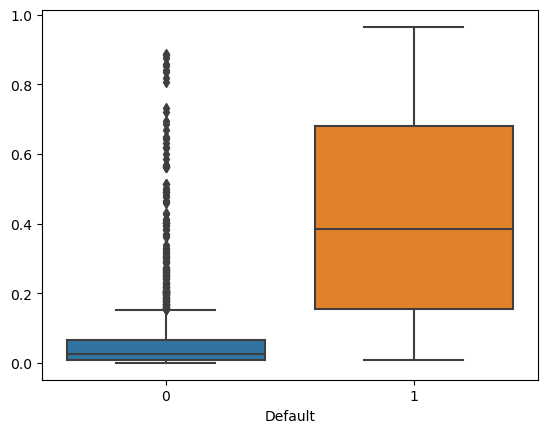

In [168]:
sns.boxplot(x=Default_train22['Default'],y=y_prob_pred_24)
plt.xlabel('Default');

In [169]:
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(Default_train22['Default'],y_prob_pred_24)

In [170]:
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
optimal_threshold

0.10759070415451753

In [171]:
y_prob_pred_train = model_24.predict(Default_train22)
y_prob_pred_train.round(3)

2011    0.110
697     0.009
160     0.064
1273    0.039
541     0.104
        ...  
1386    0.015
1127    0.006
950     0.020
1058    0.025
562     0.249
Length: 1378, dtype: float64

In [172]:
#Logestic Regression

In [173]:
#Let us now see the predicted classes

y_class_pred=[]
for i in range(0,len(y_prob_pred_train)):
    if np.array(y_prob_pred_train)[i]>0.10759070415451749:
        a=1
    else:
        a=0
    y_class_pred.append(a)

In [174]:
from sklearn import metrics

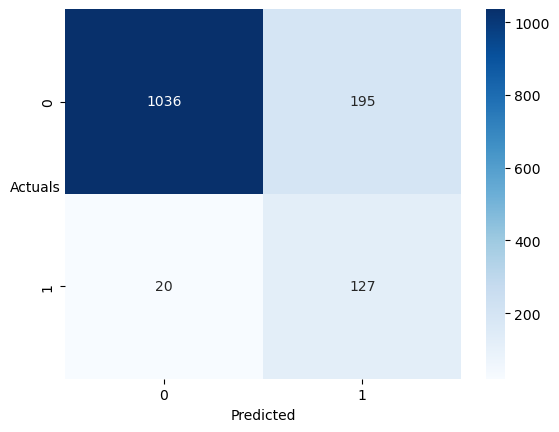

In [175]:
sns.heatmap((metrics.confusion_matrix(Default_train22['Default'],y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);

In [176]:
confusion_matrix = metrics.confusion_matrix(Default_train22['Default'], y_class_pred)
confusion_matrix

array([[1036,  195],
       [  20,  127]], dtype=int64)

In [177]:
print(metrics.classification_report(Default_train22['Default'],y_class_pred,digits=2))

              precision    recall  f1-score   support

           0       0.98      0.84      0.91      1231
           1       0.39      0.86      0.54       147

    accuracy                           0.84      1378
   macro avg       0.69      0.85      0.72      1378
weighted avg       0.92      0.84      0.87      1378



In [178]:
# predicted probability values on test dataset

y_prob_pred_test = model_24.predict(Default_test)
y_prob_pred_test.round(3)

974     0.005
134     0.023
1267    0.023
464     0.003
579     0.008
        ...  
1792    0.080
443     0.069
621     0.017
518     0.005
2057    0.023
Length: 680, dtype: float64

In [179]:
y_class_pred=[]
for i in range(0,len(y_prob_pred_test)):
    if np.array(y_prob_pred_test)[i]>0.10759070415451749:
        a=1
    else:
        a=0
    y_class_pred.append(a)

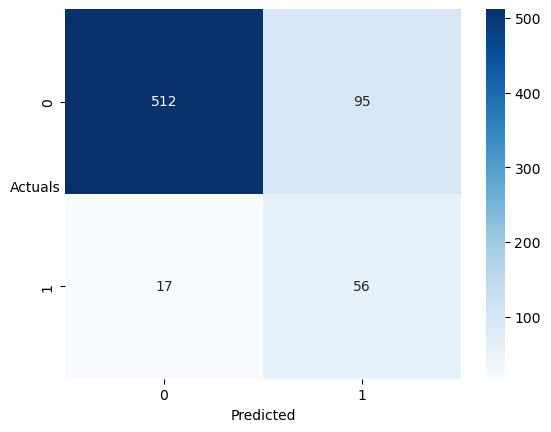

In [180]:
sns.heatmap((metrics.confusion_matrix(Default_test['Default'],y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);

In [181]:
confusion_matrix = metrics.confusion_matrix(Default_test['Default'], y_class_pred)
confusion_matrix

array([[512,  95],
       [ 17,  56]], dtype=int64)

In [182]:
print(metrics.classification_report(Default_test['Default'],y_class_pred,digits=3))

              precision    recall  f1-score   support

           0      0.968     0.843     0.901       607
           1      0.371     0.767     0.500        73

    accuracy                          0.835       680
   macro avg      0.669     0.805     0.701       680
weighted avg      0.904     0.835     0.858       680



In [183]:
# Predicted probabilities and true labels for training data
y_prob_pred_train = model_24.predict(Default_train22)
y_true_train = Default_train['Default']

# Predicted probabilities and true labels for test data
y_prob_pred_test = model_24.predict(Default_test)
y_true_test = Default_test['Default']

AUC for the Training Data: 0.913
AUC for the Test Data: 0.893


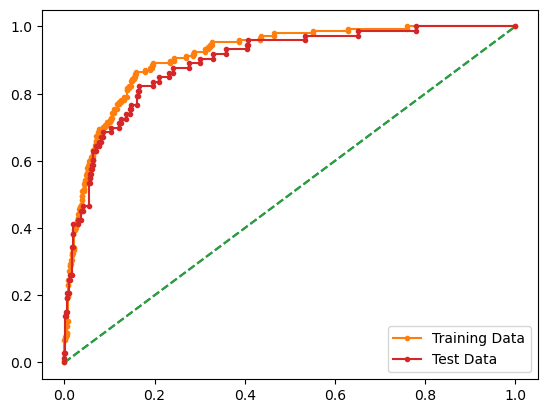

In [184]:
import matplotlib.pyplot as plt
from sklearn import metrics
import numpy as np

# AUC and ROC for the training data
# Calculate AUC
auc_train = metrics.roc_auc_score(y_true_train, y_prob_pred_train)
print('AUC for the Training Data: %.3f' % auc_train)

# Calculate ROC curve
fpr_train, tpr_train, thresholds_train = metrics.roc_curve(y_true_train, y_prob_pred_train)
plt.plot([0, 1], [0, 1], linestyle='--')
# Plot the ROC curve for the model on training data
plt.plot(fpr_train, tpr_train, marker='.', label='Training Data')

# AUC and ROC for the test data
# Calculate AUC
auc_test = metrics.roc_auc_score(y_true_test, y_prob_pred_test)
print('AUC for the Test Data: %.3f' % auc_test)

# Calculate ROC curve
fpr_test, tpr_test, thresholds_test = metrics.roc_curve(y_true_test, y_prob_pred_test)
plt.plot([0, 1], [0, 1], linestyle='--')
# Plot the ROC curve for the model on test data
plt.plot(fpr_test, tpr_test, marker='.', label='Test Data')

# Show the legend
plt.legend(loc='best')

# Show the plot
plt.show()


In [185]:
#smote

In [186]:
from imblearn.over_sampling import SMOTE

sm = SMOTE(random_state=42, sampling_strategy = .75)
X_train_res, y_train_res = sm.fit_resample(X_train, y_train)

In [187]:
y_train_res.value_counts(1)

0    0.571495
1    0.428505
Name: Default, dtype: float64

In [188]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

model_smote = LogisticRegression()
model_smote.fit(X_train_res, y_train_res)

pred_train_smote = model_smote.predict(X_train_res)
pred_test_smote = model_smote.predict(X_test)

print("Training Set Evaluation:")
print(classification_report(y_train_res, pred_train_smote))

print("Test Set Evaluation:")
print(classification_report(y_test, pred_test_smote))

Training Set Evaluation:
              precision    recall  f1-score   support

           0       0.89      0.88      0.88      1231
           1       0.84      0.85      0.85       923

    accuracy                           0.87      2154
   macro avg       0.86      0.87      0.87      2154
weighted avg       0.87      0.87      0.87      2154

Test Set Evaluation:
              precision    recall  f1-score   support

           0       0.96      0.88      0.92       607
           1       0.40      0.70      0.51        73

    accuracy                           0.86       680
   macro avg       0.68      0.79      0.71       680
weighted avg       0.90      0.86      0.87       680



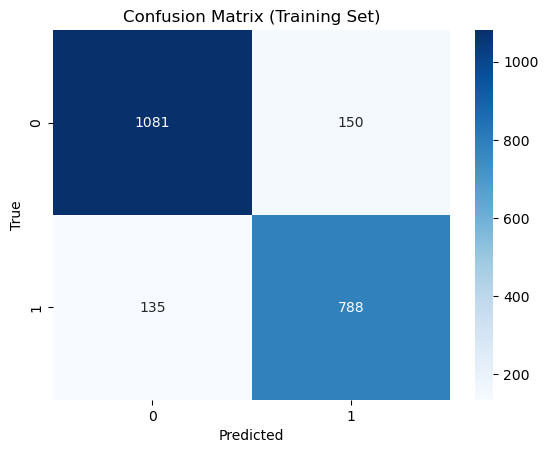

In [189]:
from sklearn.metrics import confusion_matrix

cm_train = confusion_matrix(y_train_res, pred_train_smote)
sns.heatmap(cm_train, annot=True, cmap='Blues', fmt='g', xticklabels=[0, 1], yticklabels=[0, 1])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Training Set)')
plt.show()

In [190]:
cm_train = confusion_matrix(y_train_res, pred_train_smote)
print("Confusion Matrix (Training Set):")
print(cm_train)

Confusion Matrix (Training Set):
[[1081  150]
 [ 135  788]]


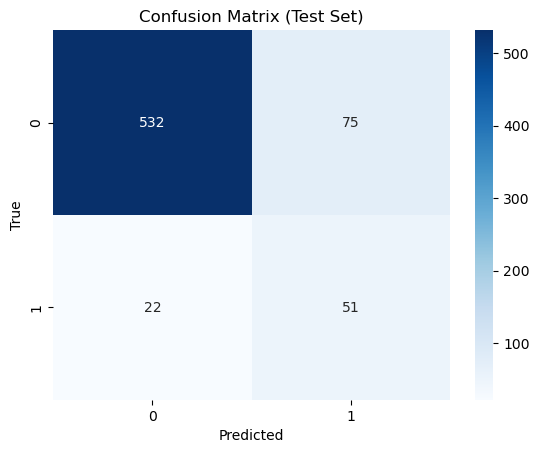

In [191]:
cm_test = confusion_matrix(y_test, pred_test_smote)

# Plot confusion matrix for test set
sns.heatmap(cm_test, annot=True, cmap='Blues', fmt='g', xticklabels=[0, 1], yticklabels=[0, 1])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Test Set)')
plt.show()

In [192]:
cm_test = confusion_matrix(y_test, pred_test_smote)
print("Confusion Matrix (Test Set):")
print(cm_test)

Confusion Matrix (Test Set):
[[532  75]
 [ 22  51]]


AUC for the Training Data: 0.866
AUC for the Test Data: 0.788


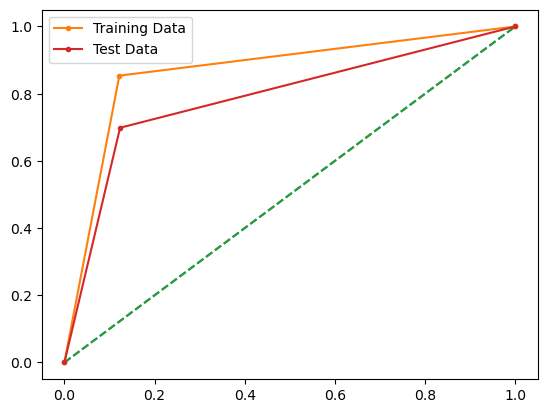

In [193]:
import matplotlib.pyplot as plt
from sklearn import metrics

# AUC and ROC for the training data
# Calculate AUC
auc_train = metrics.roc_auc_score(y_train_res, pred_train_smote)
print('AUC for the Training Data: %.3f' % auc_train)

# Calculate ROC curve
fpr_train, tpr_train, thresholds_train = metrics.roc_curve(y_train_res, pred_train_smote)
plt.plot([0, 1], [0, 1], linestyle='--')
# Plot the ROC curve for the model on training data
plt.plot(fpr_train, tpr_train, marker='.', label='Training Data')

# AUC and ROC for the test data
# Calculate AUC
auc_test = metrics.roc_auc_score(y_test, pred_test_smote)
print('AUC for the Test Data: %.3f' % auc_test)

# Calculate ROC curve
fpr_test, tpr_test, thresholds_test = metrics.roc_curve(y_test, pred_test_smote)
plt.plot([0, 1], [0, 1], linestyle='--')
# Plot the ROC curve for the model on test data
plt.plot(fpr_test, tpr_test, marker='.', label='Test Data')

# Show the legend
plt.legend(loc='best')

# Show the plot
plt.show()

In [194]:
#Random Forest Classifier

In [195]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

param_grid = {
    'max_depth': [3, 5, 7],
    'min_samples_leaf': [5, 10, 15],
    'min_samples_split': [15, 30, 45],
    'n_estimators': [25, 50]
}

rfcl = RandomForestClassifier()

grid_search = GridSearchCV(estimator = rfcl, param_grid = param_grid)

In [196]:
grid_search.fit(X_train, y_train)

GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'max_depth': [3, 5, 7],
                         'min_samples_leaf': [5, 10, 15],
                         'min_samples_split': [15, 30, 45],
                         'n_estimators': [25, 50]})

In [197]:
grid_search.best_params_

{'max_depth': 7,
 'min_samples_leaf': 5,
 'min_samples_split': 30,
 'n_estimators': 25}

In [198]:
best_grid = grid_search.best_estimator_

In [199]:
pred_train_rf = best_grid.predict(X_train)
pred_test_rf = best_grid.predict(X_test)

In [200]:
print(metrics.classification_report(y_train, pred_train_rf))

              precision    recall  f1-score   support

           0       0.94      1.00      0.97      1231
           1       0.92      0.45      0.60       147

    accuracy                           0.94      1378
   macro avg       0.93      0.72      0.78      1378
weighted avg       0.94      0.94      0.93      1378



In [201]:
print(metrics.classification_report(y_test, pred_test_rf))

              precision    recall  f1-score   support

           0       0.93      0.99      0.96       607
           1       0.77      0.37      0.50        73

    accuracy                           0.92       680
   macro avg       0.85      0.68      0.73       680
weighted avg       0.91      0.92      0.91       680



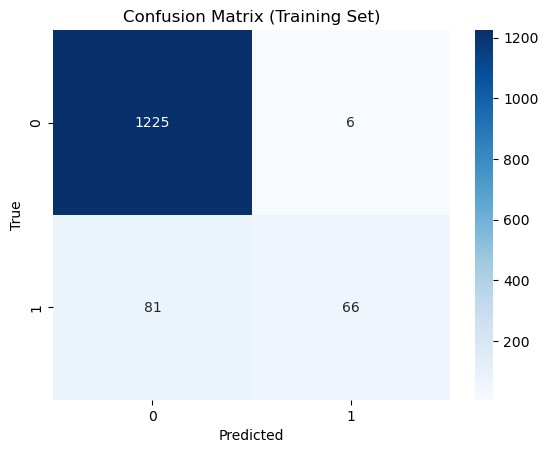

In [202]:
cm_train = confusion_matrix(y_train, pred_train_rf)
sns.heatmap(cm_train, annot=True, cmap='Blues', fmt='g', xticklabels=[0, 1], yticklabels=[0, 1])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Training Set)')
plt.show()


In [203]:
cm_train = confusion_matrix(y_train, pred_train_rf)
cm_train

array([[1225,    6],
       [  81,   66]], dtype=int64)

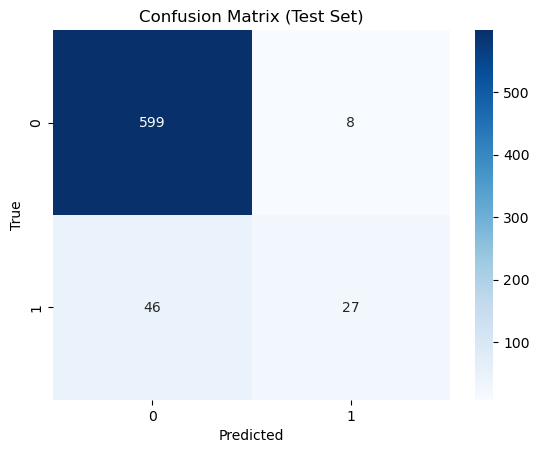

In [204]:
cm_test = confusion_matrix(y_test, pred_test_rf)

# Plot confusion matrix for test set
sns.heatmap(cm_test, annot=True, cmap='Blues', fmt='g', xticklabels=[0, 1], yticklabels=[0, 1])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Test Set)')
plt.show()

In [205]:
cm_test = confusion_matrix(y_test, pred_test_rf)
cm_test

array([[599,   8],
       [ 46,  27]], dtype=int64)

AUC for the Training Data: 0.973
AUC for the Test Data: 0.912


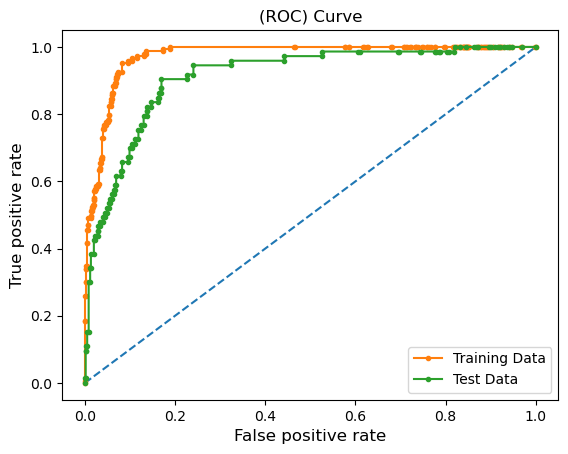

In [206]:
# AUC and ROC for the training data
# Predict probabilities
probs_train = best_grid.predict_proba(X_train)
# Keep probabilities for the positive outcome only
probs_train = probs_train[:, 1]

# Calculate AUC
auc_train = roc_auc_score(y_train, probs_train)
print('AUC for the Training Data: %.3f' % auc_train)

# Calculate ROC curve for training data
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs_train)
plt.plot([0, 1], [0, 1], linestyle='--')
# Plot the ROC curve for the model on training data
plt.plot(train_fpr, train_tpr, marker='.', label='Training Data')

# AUC and ROC for the test data
# Predict probabilities
probs_test = best_grid.predict_proba(X_test)
# Keep probabilities for the positive outcome only
probs_test = probs_test[:, 1]

# Calculate AUC
auc_test = roc_auc_score(y_test, probs_test)
print('AUC for the Test Data: %.3f' % auc_test)

# Calculate ROC curve for test data
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs_test)
# Plot the ROC curve for the model on test data
plt.plot(test_fpr, test_tpr, marker='.', label='Test Data')

# Show the legend
plt.legend(loc='best')

# Set labels and title
plt.xlabel('False positive rate', fontsize=12)
plt.ylabel('True positive rate', fontsize=12)
plt.title('(ROC) Curve')

# Show the plot
plt.show()


AUC for the Training Data: 0.973


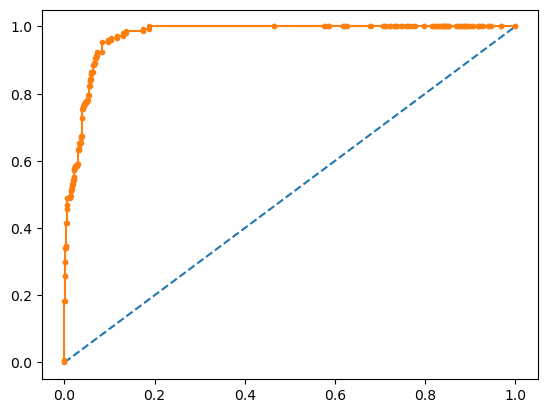

In [207]:
# Calculate AUC
auc_train = roc_auc_score(y_train, probs_train)
print('AUC for the Training Data: %.3f' % auc_train)

# Calculate ROC curve for training data
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs_train)
plt.plot([0, 1], [0, 1], linestyle='--')
# Plot the ROC curve for the model on training data
plt.plot(train_fpr, train_tpr, marker='.', label='Training Data')

# AUC and ROC for the test data
# Predict probabilities
probs_test = best_grid.predict_proba(X_test)
# Keep probabilities for the positive outcome only
probs_test = probs_test[:, 1]

AUC for the Test Data: 0.912


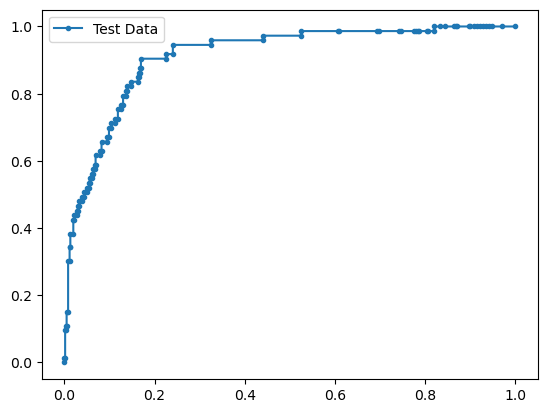

In [208]:
# Calculate AUC
auc_test = roc_auc_score(y_test, probs_test)
print('AUC for the Test Data: %.3f' % auc_test)

# Calculate ROC curve for test data
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs_test)
# Plot the ROC curve for the model on test data
plt.plot(test_fpr, test_tpr, marker='.', label='Test Data')

# Show the legend
plt.legend(loc='best');

In [209]:
from imblearn.over_sampling import SMOTE

sm = SMOTE(random_state=42, sampling_strategy = .75)
X_train_res, y_train_res = sm.fit_resample(X_train, y_train)

In [210]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

model_smote = RandomForestClassifier()
model_smote.fit(X_train_res, y_train_res)

pred_train_smote = model_smote.predict(X_train_res)
pred_test_smote = model_smote.predict(X_test)

print("Training Set Evaluation:")
print(classification_report(y_train_res, pred_train_smote))

print("Test Set Evaluation:")
print(classification_report(y_test, pred_test_smote))

Training Set Evaluation:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1231
           1       1.00      1.00      1.00       923

    accuracy                           1.00      2154
   macro avg       1.00      1.00      1.00      2154
weighted avg       1.00      1.00      1.00      2154

Test Set Evaluation:
              precision    recall  f1-score   support

           0       0.94      0.95      0.95       607
           1       0.55      0.52      0.54        73

    accuracy                           0.90       680
   macro avg       0.75      0.73      0.74       680
weighted avg       0.90      0.90      0.90       680



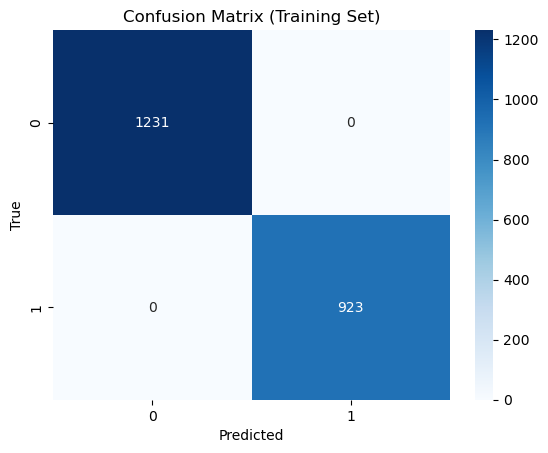

In [211]:
cm_train = confusion_matrix(y_train_res, pred_train_smote)
sns.heatmap(cm_train, annot=True, cmap='Blues', fmt='g', xticklabels=[0, 1], yticklabels=[0, 1])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Training Set)')
plt.show()


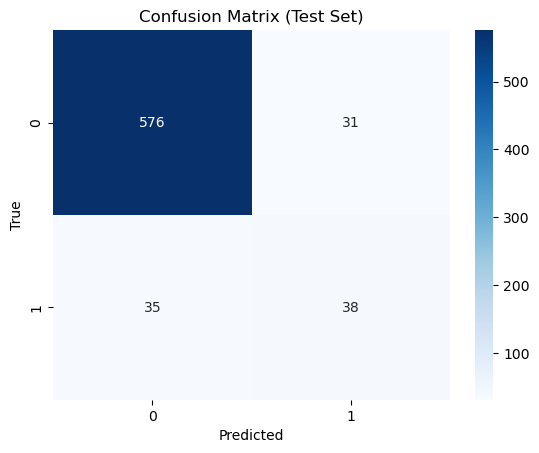

In [212]:
cm_test = confusion_matrix(y_test, pred_test_smote)

# Plot confusion matrix for test set
sns.heatmap(cm_test, annot=True, cmap='Blues', fmt='g', xticklabels=[0, 1], yticklabels=[0, 1])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Test Set)')
plt.show()

AUC for the Training Data: 1.000
AUC for the Test Data: 0.735


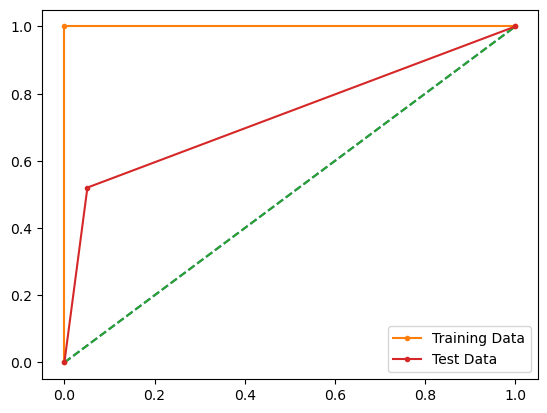

In [213]:
import matplotlib.pyplot as plt
from sklearn import metrics

# AUC and ROC for the training data
# Calculate AUC
auc_train = metrics.roc_auc_score(y_train_res, pred_train_smote)
print('AUC for the Training Data: %.3f' % auc_train)

# Calculate ROC curve
fpr_train, tpr_train, thresholds_train = metrics.roc_curve(y_train_res, pred_train_smote)
plt.plot([0, 1], [0, 1], linestyle='--')
# Plot the ROC curve for the model on training data
plt.plot(fpr_train, tpr_train, marker='.', label='Training Data')

# AUC and ROC for the test data
# Calculate AUC
auc_test = metrics.roc_auc_score(y_test, pred_test_smote)
print('AUC for the Test Data: %.3f' % auc_test)

# Calculate ROC curve
fpr_test, tpr_test, thresholds_test = metrics.roc_curve(y_test, pred_test_smote)
plt.plot([0, 1], [0, 1], linestyle='--')
# Plot the ROC curve for the model on test data
plt.plot(fpr_test, tpr_test, marker='.', label='Test Data')

# Show the legend
plt.legend(loc='best')

# Show the plot
plt.show()

AUC for the Training Data: 1.000


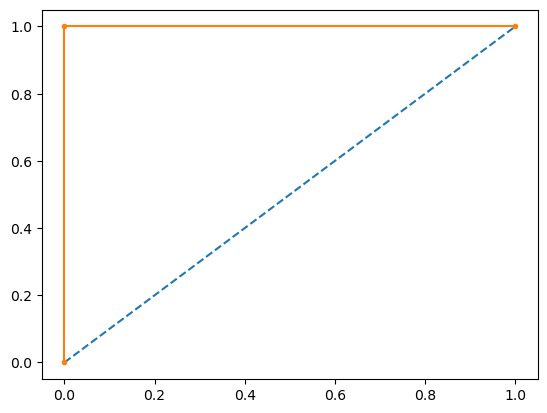

In [214]:
# AUC and ROC for the training data
# Calculate AUC
auc_train = metrics.roc_auc_score(y_train_res, pred_train_smote)
print('AUC for the Training Data: %.3f' % auc_train)

# Calculate ROC curve
fpr_train, tpr_train, thresholds_train = metrics.roc_curve(y_train_res, pred_train_smote)
plt.plot([0, 1], [0, 1], linestyle='--')
# Plot the ROC curve for the model on training data
plt.plot(fpr_train, tpr_train, marker='.', label='Training Data');



AUC for the Test Data: 0.735


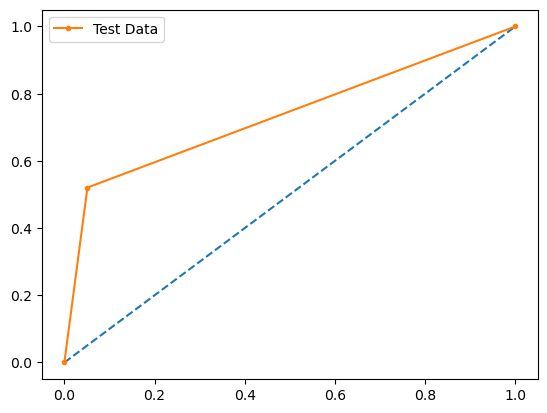

In [215]:
# AUC and ROC for the test data
# Calculate AUC
auc_test = metrics.roc_auc_score(y_test, pred_test_smote)
print('AUC for the Test Data: %.3f' % auc_test)

# Calculate ROC curve
fpr_test, tpr_test, thresholds_test = metrics.roc_curve(y_test, pred_test_smote)
plt.plot([0, 1], [0, 1], linestyle='--')
# Plot the ROC curve for the model on test data
plt.plot(fpr_test, tpr_test, marker='.', label='Test Data')

# Show the legend
plt.legend(loc='best');

# Show the plot


In [216]:
#Linear Discriminant Analysis

In [217]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import RandomForestClassifier

In [218]:
LDA = LinearDiscriminantAnalysis()

In [219]:
lda_model = LDA.fit(X_train, y_train)

In [220]:
pred_train_lda = lda_model.predict(X_train)
pred_test_lda = lda_model.predict(X_test)

In [221]:
print(metrics.classification_report(y_train, pred_train_lda))

              precision    recall  f1-score   support

           0       0.94      0.97      0.95      1231
           1       0.64      0.48      0.55       147

    accuracy                           0.92      1378
   macro avg       0.79      0.73      0.75      1378
weighted avg       0.91      0.92      0.91      1378



In [222]:
print(metrics.classification_report(y_test, pred_test_lda))

              precision    recall  f1-score   support

           0       0.94      0.96      0.95       607
           1       0.60      0.48      0.53        73

    accuracy                           0.91       680
   macro avg       0.77      0.72      0.74       680
weighted avg       0.90      0.91      0.91       680



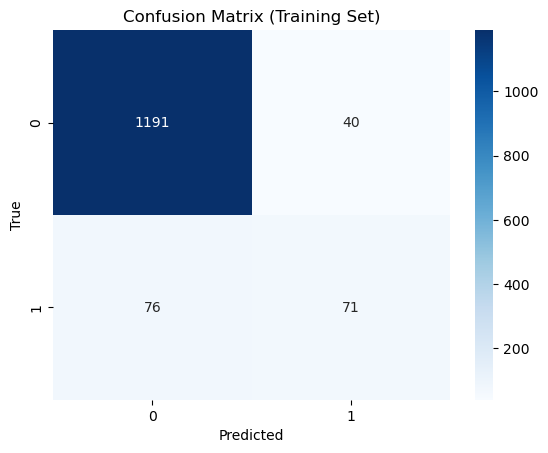

In [223]:
cm_train = confusion_matrix(y_train, pred_train_lda)
sns.heatmap(cm_train, annot=True, cmap='Blues', fmt='g', xticklabels=[0, 1], yticklabels=[0, 1])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Training Set)')
plt.show()

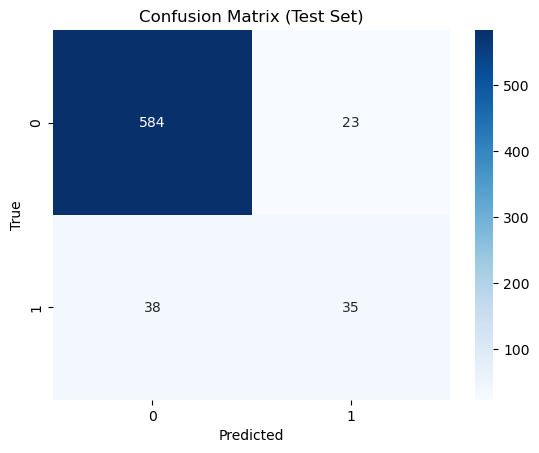

In [224]:
cm_test = confusion_matrix(y_test, pred_test_lda)

# Plot confusion matrix for test set
sns.heatmap(cm_test, annot=True, cmap='Blues', fmt='g', xticklabels=[0, 1], yticklabels=[0, 1])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Test Set)')
plt.show()

AUC for the Training Data: 0.921
AUC for the Test Data: 0.893


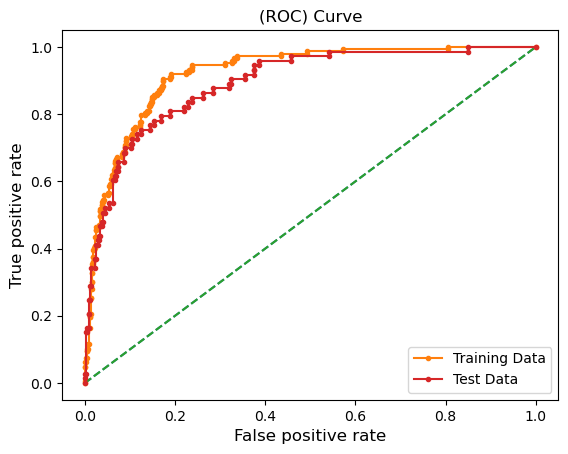

In [225]:
# AUC and ROC for the training data
# Predict probabilities
probs_train = lda_model.predict_proba(X_train)
# Keep probabilities for the positive outcome only
probs_train = probs_train[:, 1]

# Calculate AUC
auc_train = roc_auc_score(y_train, probs_train)
print('AUC for the Training Data: %.3f' % auc_train)

# Calculate ROC curve
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, probs_train)
plt.plot([0, 1], [0, 1], linestyle='--')
# Plot the ROC curve for the model on training data
plt.plot(fpr_train, tpr_train, marker='.', label='Training Data')

# AUC and ROC for the test data
# Predict probabilities
probs_test = lda_model.predict_proba(X_test)
# Keep probabilities for the positive outcome only
probs_test = probs_test[:, 1]

# Calculate AUC
auc_test = roc_auc_score(y_test, probs_test)
print('AUC for the Test Data: %.3f' % auc_test)

# Calculate ROC curve
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, probs_test)
plt.plot([0, 1], [0, 1], linestyle='--')
# Plot the ROC curve for the model on test data
plt.plot(fpr_test, tpr_test, marker='.', label='Test Data')

# Set labels and title
plt.xlabel('False positive rate', fontsize=12)
plt.ylabel('True positive rate', fontsize=12)
plt.title('(ROC) Curve')

# Show the legend
plt.legend(loc='best')

# Show the plot
plt.show()


AUC for the Training Data: 0.921


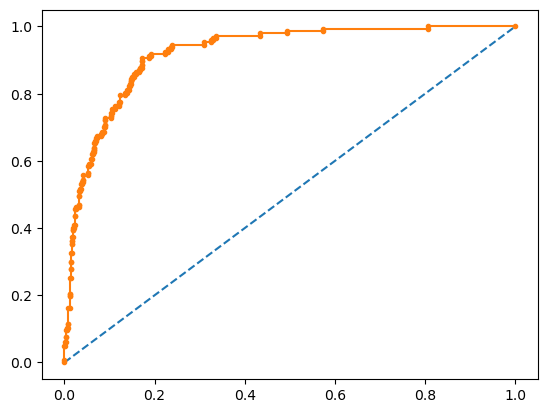

In [226]:
# Calculate AUC
auc_train = roc_auc_score(y_train, probs_train)
print('AUC for the Training Data: %.3f' % auc_train)

# Calculate ROC curve
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, probs_train)
plt.plot([0, 1], [0, 1], linestyle='--')
# Plot the ROC curve for the model on training data
plt.plot(fpr_train, tpr_train, marker='.', label='Training Data')

# AUC and ROC for the test data
# Predict probabilities
probs_test = lda_model.predict_proba(X_test)
# Keep probabilities for the positive outcome only
probs_test = probs_test[:, 1]

AUC for the Test Data: 0.893


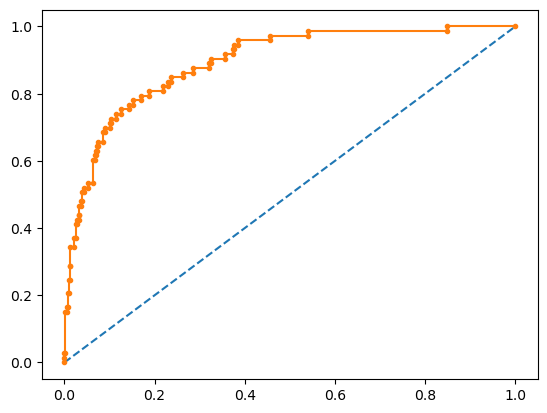

In [227]:
# Calculate AUC
auc_test = roc_auc_score(y_test, probs_test)
print('AUC for the Test Data: %.3f' % auc_test)

# Calculate ROC curve
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, probs_test)
plt.plot([0, 1], [0, 1], linestyle='--')
# Plot the ROC curve for the model on test data
plt.plot(fpr_test, tpr_test, marker='.', label='Test Data');


In [228]:
pred_train_lda_prob = lda_model.predict_proba(X_train)[:,1]
pred_test_lda_prob = lda_model.predict_proba(X_test)[:,1]

In [229]:
fpr, tpr, thresholds = roc_curve(y_train,pred_train_lda_prob)

In [230]:
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
optimal_threshold

0.06656909141457601

In [231]:
y_class_pred=[]
for i in range(0,len(pred_train_lda_prob)):
    if np.array(pred_train_lda_prob)[i]>0.06656909141457523:
        a=1
    else:
        a=0
    y_class_pred.append(a)

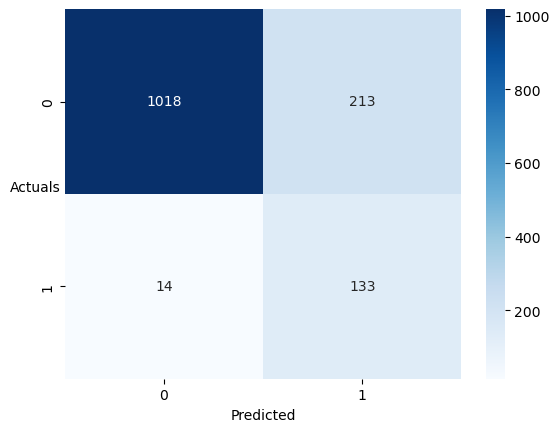

In [232]:
sns.heatmap((metrics.confusion_matrix(y_train,y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);

In [233]:
from sklearn.metrics import classification_report

print(classification_report(y_train[:len(y_class_pred)], y_class_pred, digits=3))


              precision    recall  f1-score   support

           0      0.986     0.827     0.900      1231
           1      0.384     0.905     0.540       147

    accuracy                          0.835      1378
   macro avg      0.685     0.866     0.720      1378
weighted avg      0.922     0.835     0.861      1378



In [234]:
y_class_pred=[]
for i in range(0,len(pred_test_lda_prob)):
    if np.array(pred_test_lda_prob)[i]>0.06656909141457523:
        a=1
    else:
        a=0
    y_class_pred.append(a)

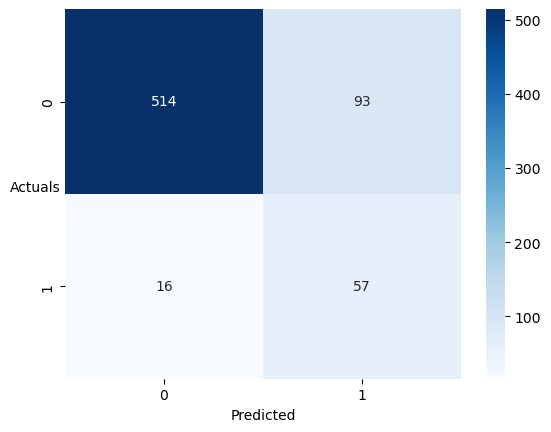

In [235]:
sns.heatmap((metrics.confusion_matrix(y_test, y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);

In [236]:
print(metrics.classification_report(y_test, y_class_pred,digits=3))

              precision    recall  f1-score   support

           0      0.970     0.847     0.904       607
           1      0.380     0.781     0.511        73

    accuracy                          0.840       680
   macro avg      0.675     0.814     0.708       680
weighted avg      0.906     0.840     0.862       680



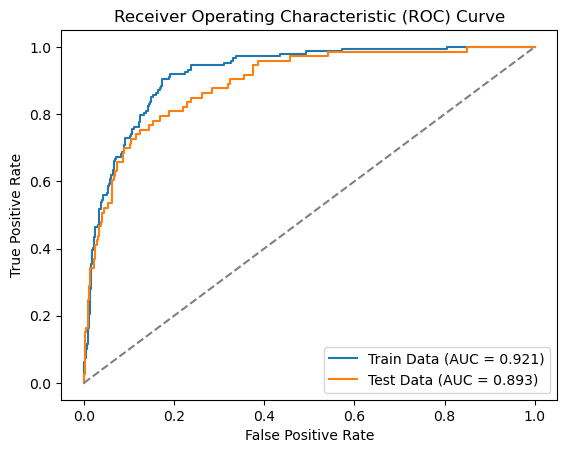

In [237]:
# Plot AUC-ROC curve for the training data
fpr_train, tpr_train, thresholds_train = metrics.roc_curve(y_train, pred_train_lda_prob)
auc_train = metrics.auc(fpr_train, tpr_train)
plt.plot(fpr_train, tpr_train, label=f'Train Data (AUC = {auc_train:.3f})')

# Plot AUC-ROC curve for the test data
fpr_test, tpr_test, thresholds_test = metrics.roc_curve(y_test, pred_test_lda_prob)
auc_test = metrics.auc(fpr_test, tpr_test)
plt.plot(fpr_test, tpr_test, label=f'Test Data (AUC = {auc_test:.3f})')

# Configure plot
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()

# Display plot
plt.show()

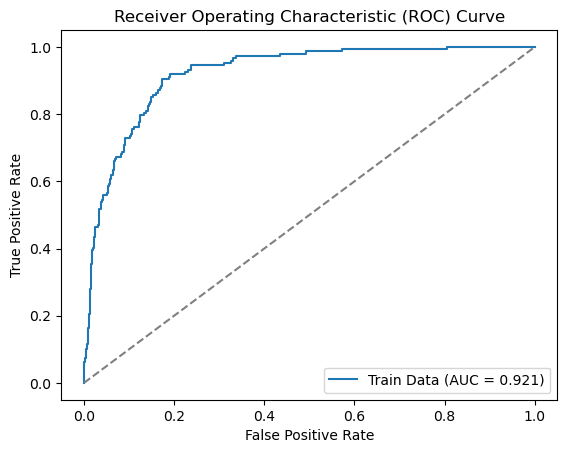

In [238]:
# Plot AUC-ROC curve for the training data
fpr_train, tpr_train, thresholds_train = metrics.roc_curve(y_train, pred_train_lda_prob)
auc_train = metrics.auc(fpr_train, tpr_train)
plt.plot(fpr_train, tpr_train, label=f'Train Data (AUC = {auc_train:.3f})')

# Configure plot
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()

# Display plot
plt.show()

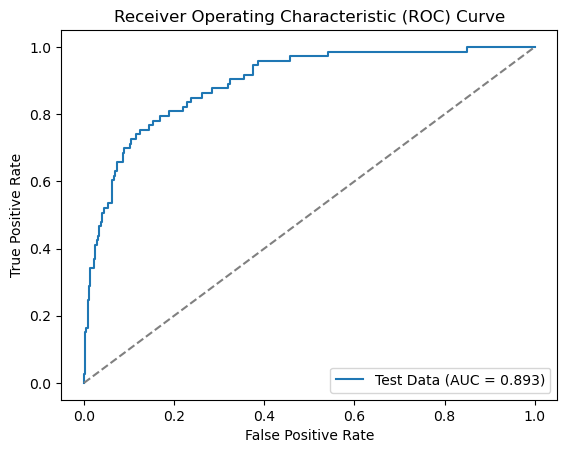

In [239]:

# Plot AUC-ROC curve for the test data
fpr_test, tpr_test, thresholds_test = metrics.roc_curve(y_test, pred_test_lda_prob)
auc_test = metrics.auc(fpr_test, tpr_test)
plt.plot(fpr_test, tpr_test, label=f'Test Data (AUC = {auc_test:.3f})')

# Configure plot
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()

# Display plot
plt.show()

In [240]:
#SMOTE

In [241]:
from imblearn.over_sampling import SMOTE

sm = SMOTE(random_state=42, sampling_strategy = .75)
X_train_res, y_train_res = sm.fit_resample(X_train, y_train)

In [242]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

model_smote = LinearDiscriminantAnalysis()
model_smote.fit(X_train_res, y_train_res)

pred_train_smote = model_smote.predict(X_train_res)
pred_test_smote = model_smote.predict(X_test)

print("Training Set Evaluation:")
print(classification_report(y_train_res, pred_train_smote))

print("Test Set Evaluation:")
print(classification_report(y_test, pred_test_smote))

Training Set Evaluation:
              precision    recall  f1-score   support

           0       0.89      0.88      0.88      1231
           1       0.84      0.85      0.84       923

    accuracy                           0.87      2154
   macro avg       0.86      0.86      0.86      2154
weighted avg       0.87      0.87      0.87      2154

Test Set Evaluation:
              precision    recall  f1-score   support

           0       0.96      0.89      0.92       607
           1       0.43      0.70      0.53        73

    accuracy                           0.87       680
   macro avg       0.69      0.79      0.73       680
weighted avg       0.90      0.87      0.88       680



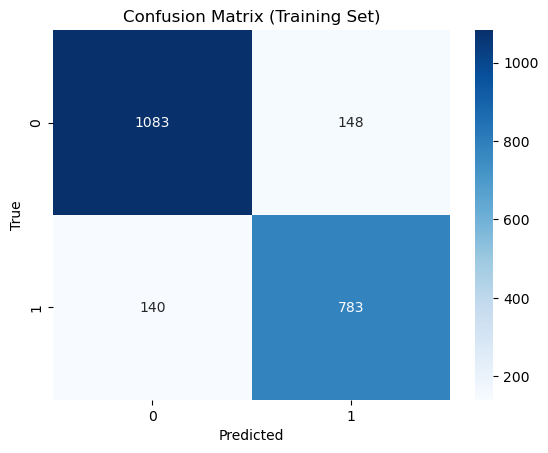

In [243]:
cm_train = confusion_matrix(y_train_res, pred_train_smote)
sns.heatmap(cm_train, annot=True, cmap='Blues', fmt='g', xticklabels=[0, 1], yticklabels=[0, 1])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Training Set)')
plt.show()


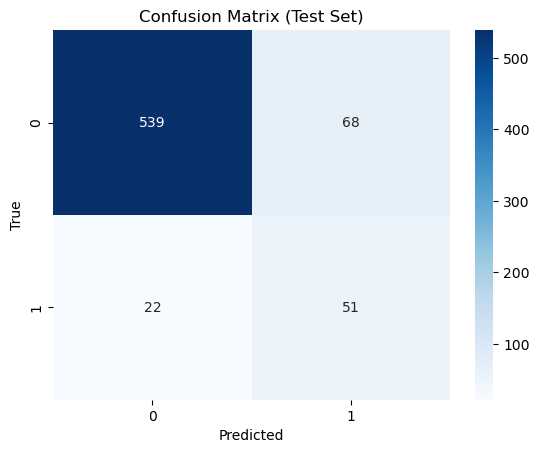

In [244]:
cm_test = confusion_matrix(y_test, pred_test_smote)

# Plot confusion matrix for test set
sns.heatmap(cm_test, annot=True, cmap='Blues', fmt='g', xticklabels=[0, 1], yticklabels=[0, 1])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Test Set)')
plt.show()

AUC for the Training Data: 0.864
AUC for the Test Data: 0.793


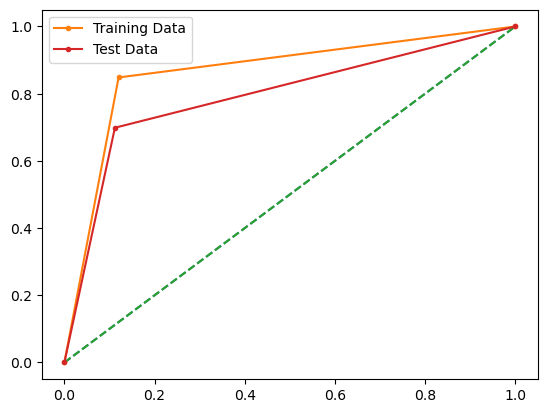

In [245]:
import matplotlib.pyplot as plt
from sklearn import metrics

# AUC and ROC for the training data
# Calculate AUC
auc_train = metrics.roc_auc_score(y_train_res, pred_train_smote)
print('AUC for the Training Data: %.3f' % auc_train)

# Calculate ROC curve
fpr_train, tpr_train, thresholds_train = metrics.roc_curve(y_train_res, pred_train_smote)
plt.plot([0, 1], [0, 1], linestyle='--')
# Plot the ROC curve for the model on training data
plt.plot(fpr_train, tpr_train, marker='.', label='Training Data')

# AUC and ROC for the test data
# Calculate AUC
auc_test = metrics.roc_auc_score(y_test, pred_test_smote)
print('AUC for the Test Data: %.3f' % auc_test)

# Calculate ROC curve
fpr_test, tpr_test, thresholds_test = metrics.roc_curve(y_test, pred_test_smote)
plt.plot([0, 1], [0, 1], linestyle='--')
# Plot the ROC curve for the model on test data
plt.plot(fpr_test, tpr_test, marker='.', label='Test Data')

# Show the legend
plt.legend(loc='best')

# Show the plot
plt.show()

AUC for the Training Data: 0.864


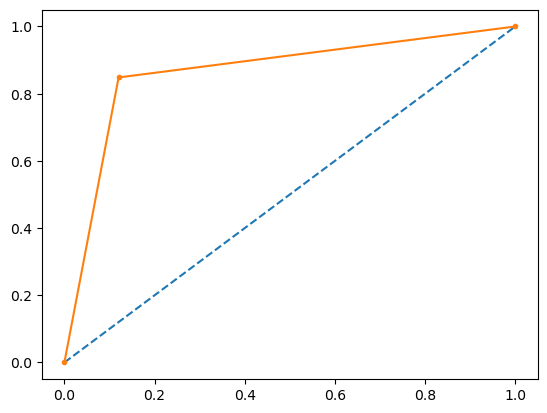

In [246]:
# AUC and ROC for the training data
# Calculate AUC
auc_train = metrics.roc_auc_score(y_train_res, pred_train_smote)
print('AUC for the Training Data: %.3f' % auc_train)

# Calculate ROC curve
fpr_train, tpr_train, thresholds_train = metrics.roc_curve(y_train_res, pred_train_smote)
plt.plot([0, 1], [0, 1], linestyle='--')
# Plot the ROC curve for the model on training data
plt.plot(fpr_train, tpr_train, marker='.', label='Training Data');

AUC for the Test Data: 0.793


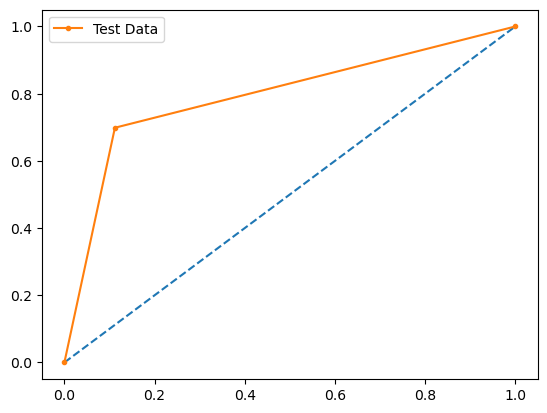

In [247]:
# AUC and ROC for the test data
# Calculate AUC
auc_test = metrics.roc_auc_score(y_test, pred_test_smote)
print('AUC for the Test Data: %.3f' % auc_test)

# Calculate ROC curve
fpr_test, tpr_test, thresholds_test = metrics.roc_curve(y_test, pred_test_smote)
plt.plot([0, 1], [0, 1], linestyle='--')
# Plot the ROC curve for the model on test data
plt.plot(fpr_test, tpr_test, marker='.', label='Test Data')

# Show the legend
plt.legend(loc='best')

# Show the plot
plt.show()